In [1]:
#@title Imports

import torch
import torchvision
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from typing import Tuple, Optional, Any
import math
from torch import Tensor
from einops import rearrange
from diffusers import DDPMScheduler
from torchvision import transforms
from tqdm import tqdm
from IPython.display import clear_output
import einops
from torch.utils.data.dataset import Dataset
from dataclasses import dataclass
from typing import List, Union, Dict, Any, Optional, BinaryIO
import pathlib
from types import FunctionType
from PIL import Image, ImageColor, ImageDraw, ImageFont
import tqdm

In [2]:
#@title Hyperparameters

T = 1000 # Timesteps
EPOCHS = 100 # Number of epochs

In [3]:
#@title Device / CUDA

if torch.backends.mps.is_available():
    # Mac
    device = "mps"
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = "cpu"

print(f'Using device: {device}')

Using device: cuda


In [4]:


@dataclass
class DataPack:
    train_dataset: Dataset
    train_loader: DataLoader
    val_dataset: Dataset
    val_loader: DataLoader
    transform_to_tensor: Any
    transform_to_pil: Any
    in_channels: int
    out_channels: int
    num_classes: int
    recommended_steps: Tuple[int]
    recommended_attn_step_indexes: List[int]

class MNISTTransformation:
    def __call__(self, tensor: torch.Tensor):
        return (tensor * -1 + 1).permute(1,2,0).detach().cpu().numpy()

def get_mnist_loader_and_transform(
    path_to_dataset: str = "./datasets",
    batch_size: int = 128,
    num_workers: int = 2
) -> DataPack:
    transform_to_tensor = transforms.ToTensor()
    train_dataset = torchvision.datasets.MNIST(root=path_to_dataset, download=True, transform=transform_to_tensor)
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

    val_dataset = torchvision.datasets.MNIST(root=path_to_dataset, download=True, transform=transform_to_tensor, train=False)
    val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

    return DataPack(
        train_dataset=train_dataset,
        train_loader=train_dataloader,
        val_dataset=val_dataset,
        val_loader=val_dataloader,
        transform_to_tensor=transform_to_tensor,
        transform_to_pil=MNISTTransformation(),
        in_channels=1,
        out_channels=1,
        num_classes=10,
        recommended_steps=(1,2,4),
        recommended_attn_step_indexes=[1]
    )

class CifarTransformation:
    def __call__(self, tensor: torch.Tensor):
        return (tensor * 127.5 + 127.5).long().clip(0,255).permute(1,2,0).detach().cpu().numpy()

def get_cifar10_loader_and_transform(
    path_to_dataset: str = "./datasets",
    batch_size: int = 128,
    num_workers: int = 2
) -> DataPack:
    transform_to_tensor = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((.5,.5,.5), (.5,.5,.5))
    ])
    transform_to_pil = CifarTransformation()
    train_dataset = torchvision.datasets.CIFAR10(root=path_to_dataset, download=True, transform=transform_to_tensor)
    train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

    val_dataset = torchvision.datasets.CIFAR10(root=path_to_dataset, download=True, transform=transform_to_tensor, train=False)
    val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

    return DataPack(
        train_dataset=train_dataset,
        train_loader=train_dataloader,
        val_dataset=val_dataset,
        val_loader=val_dataloader,
        transform_to_tensor=transform_to_tensor,
        transform_to_pil=transform_to_pil,
        in_channels=3,
        out_channels=3,
        num_classes=10,
        recommended_steps=(1,2,2,2),
        recommended_attn_step_indexes=[1,2]
    )



In [5]:
class MLP(nn.Module):
    def __init__(self, input_dim: int, output_dim: int):
        super().__init__()
        self.ln = nn.Sequential(
            nn.ReLU(),
            nn.Linear(input_dim, output_dim),
        )

    def forward(self, x):
        return self.ln(x)

class PositionalEmbedding(nn.Module):
    def __init__(self, T: int, output_dim: int) -> None:
        super().__init__()
        self.output_dim = output_dim
        position = torch.arange(T).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, output_dim, 2) * (-math.log(10000.0) / output_dim))
        pe = torch.zeros(T, output_dim)
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x: torch.Tensor):
        return self.pe[x].reshape(x.shape[0], self.output_dim)

class MultiheadAttention(nn.Module):
    def __init__(self, n_heads: int, emb_dim: int, input_dim: int) -> None:
        super().__init__()
        assert emb_dim % n_heads == 0
        head_dim = emb_dim // n_heads
        self.K_W = nn.Parameter(torch.rand(n_heads, input_dim, head_dim))
        self.K_b = nn.Parameter(torch.rand(n_heads, head_dim))
        self.Q_W = nn.Parameter(torch.rand(n_heads, input_dim, head_dim))
        self.Q_b = nn.Parameter(torch.rand(n_heads, head_dim))
        self.V_W = nn.Parameter(torch.rand(n_heads, input_dim, head_dim))
        self.V_b = nn.Parameter(torch.rand(n_heads, head_dim))
        self.O_W = nn.Parameter(torch.rand(n_heads, head_dim, input_dim))
        self.O_b = nn.Parameter(torch.rand(input_dim))
        self.norm = nn.LayerNorm([input_dim])
        self.mlp = nn.Sequential(
            nn.LayerNorm([input_dim]),
            nn.Linear(input_dim, input_dim),
            nn.GELU(),
            nn.Linear(input_dim, input_dim)
        )

    def forward(self, x, t):
        _, input_dim, h, w = x.shape
        x = einops.rearrange(x, "b c h w -> b (h w) c")
        res = x
        res = self.norm(x)
        k = einops.einsum(res, self.K_W, "b size ch, n_h ch h_dim -> b size n_h h_dim")
        k = k + self.K_b
        q = einops.einsum(res, self.Q_W, "b size ch, n_h ch h_dim -> b size n_h h_dim")
        q = q + self.Q_b
        qk = einops.einsum(q, k, "batch s1 n_h h_dim, batch s2 n_h h_dim -> batch n_h s1 s2")
        qk = qk / torch.sqrt(torch.tensor(input_dim, dtype=torch.float))
        qk = qk.softmax(-1)
        v = einops.einsum(res, self.V_W, "b size ch, n_h ch h_dim -> b size n_h h_dim")
        v = v + self.V_b
        res = einops.einsum(qk, v, "batch n_h size size, batch size n_h h_dim -> batch size n_h h_dim")
        res = einops.einsum(res, self.O_W, "batch size n_h h_dim, n_h h_dim ch -> batch size ch")
        res = res + self.O_b
        res = res + x
        res = self.mlp(res) + res
        res = einops.rearrange(res, "b (h w) c -> b c h w", h=h, w=w)
        return res

class ResnetBlock(nn.Module):
    def __init__(self, in_channels, out_channels, time_emb_dim, is_residual=False, is_debug=False):
        super().__init__()
        self.conv_1 = nn.Sequential(
            nn.GroupNorm(8, in_channels),
            nn.ReLU(),
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1),
        )
        self.conv_2 = nn.Sequential(
            nn.GroupNorm(8, out_channels),
            nn.ReLU(),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, padding=1)
        )
        self.time_emb = MLP(input_dim=time_emb_dim, output_dim=out_channels)
        if in_channels != out_channels:
            self.conv_3 = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=1)
        else:
            self.conv_3 = nn.Identity()
        self.is_debug = is_debug
        self.is_residual = is_residual

    def forward(self, x, t):
        h = self.conv_1(x)
        if t is None:
            return self.conv_3(x) + self.conv_2(h)
        t = self.time_emb(t)
        batch_size, emb_dim = t.shape
        t = t.view(batch_size, emb_dim, 1, 1)
        if self.is_residual:
            return self.conv_3(x) + self.conv_2(h + t)
        else:
            return self.conv_2(h + t)


class DownBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.pool = nn.AvgPool2d(kernel_size=2)

    def forward(self, x, t):
        return self.pool(x)

class UpBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upscale = nn.ConvTranspose2d(in_channels=in_channels, out_channels=out_channels, kernel_size=2, stride=2)

    def forward(self, x, t):
        return self.upscale(x)

class SequenceWithTimeEmbedding(nn.Module):
    def __init__(self, blocks):
        super().__init__()
        self.models = nn.ModuleList(blocks)

    def forward(self, x, t):
        for model in self.models:
            x = model(x, t)
        return x

In [6]:
class UNet(nn.Module):
    def __init__(
            self,
            in_channels,
            out_channels,
            T,
            steps=(1, 2, 4),
            hid_size = 128,
            attn_step_indexes = [1],
            has_residuals=True,
            num_resolution_blocks=2,
            is_debug = False
        ):
        super().__init__()

        time_emb_dim = hid_size * 4
        self.time_embedding = nn.Sequential(
            PositionalEmbedding(T=T, output_dim=hid_size),
            nn.Linear(hid_size, time_emb_dim),
            nn.ReLU(),
            nn.Linear(time_emb_dim, time_emb_dim)
        )

        self.first_conv = nn.Conv2d(in_channels, steps[0] * hid_size, 3, padding=1)
        self.down_blocks = nn.ModuleList()
        prev_hid_size = steps[0] * hid_size
        for (index, step) in enumerate(steps):
            res_blocks = []
            for block in range(num_resolution_blocks):
                res_blocks.append(
                    ResnetBlock(
                        in_channels=prev_hid_size if block == 0 else step * hid_size,
                        out_channels=step * hid_size,
                        time_emb_dim=time_emb_dim,
                        is_residual=has_residuals
                    )
                )
                if step in attn_step_indexes:
                    res_blocks.append(
                        MultiheadAttention(
                            n_heads=4,
                            emb_dim=step * hid_size,
                            input_dim=step * hid_size
                        )
                    )
            self.down_blocks.append(
                SequenceWithTimeEmbedding(res_blocks)
            )
            if index != len(steps) - 1:
                self.down_blocks.append(DownBlock())
            prev_hid_size = step * hid_size
        if len(attn_step_indexes) > 0:
            self.backbone = SequenceWithTimeEmbedding([
                ResnetBlock(steps[-1] * hid_size, steps[-1] * hid_size, time_emb_dim=time_emb_dim),
                MultiheadAttention(n_heads=4, emb_dim=steps[-1] * hid_size, input_dim=steps[-1] * hid_size),
                ResnetBlock(steps[-1] * hid_size, steps[-1] * hid_size, time_emb_dim=time_emb_dim),
            ])
        else:
            self.backbone = SequenceWithTimeEmbedding([
                ResnetBlock(steps[-1] * hid_size, steps[-1] * hid_size, time_emb_dim=time_emb_dim),
                ResnetBlock(steps[-1] * hid_size, steps[-1] * hid_size, time_emb_dim=time_emb_dim),
            ])

        self.up_blocks = nn.ModuleList()
        reverse_steps = list(reversed(steps))
        for (index, step) in enumerate(reverse_steps):
            res_blocks = []
            for block in range(num_resolution_blocks):
                next_hid_size = reverse_steps[index + 1] * hid_size if index != len(steps) - 1 else step * hid_size
                res_blocks.append(
                    ResnetBlock(
                        in_channels=prev_hid_size * 2 if block == 0 else next_hid_size,
                        out_channels=next_hid_size,
                        time_emb_dim=time_emb_dim,
                        is_residual=has_residuals
                    )
                )
                if len(reverse_steps) - index - 1 in attn_step_indexes:
                    res_blocks.append(
                        MultiheadAttention(
                            n_heads=4,
                            emb_dim=next_hid_size,
                            input_dim=next_hid_size
                        )
                    )
            self.up_blocks.append(
                SequenceWithTimeEmbedding(res_blocks)
            )
            if index != len(steps) - 1:
                self.up_blocks.append(UpBlock(next_hid_size, next_hid_size))
            prev_hid_size = next_hid_size

        self.is_debug = is_debug
        self.out = nn.Sequential(*[
            nn.GroupNorm(8, steps[0] * hid_size),
            nn.ReLU(),
            nn.Conv2d(in_channels=steps[0] * hid_size, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        ])

    def forward(self, x, t):
        time_emb = self.time_embedding(t)

        x = self.first_conv(x)
        hx = []
        for down_block in self.down_blocks:
            x = down_block(x, time_emb)
            if not isinstance(down_block, DownBlock):
                hx.append(x)
        x = self.backbone(x, time_emb)

        ind = len(hx) - 1
        for up_block in self.up_blocks:
            if not isinstance(up_block, UpBlock):
                x = up_block(torch.cat([x, hx[ind]], 1), time_emb)
                ind -= 1
            else:
                x = up_block(x, time_emb)
        x = self.out(x)

        return x

In [7]:
class DDPM(nn.Module):
    def __init__(
        self,
        T: int,
        eps_model: nn.Module,
        device: str
    ):
        super().__init__()
        self.T = T
        self.eps_model = eps_model.to(device)
        self.device = device
        beta_schedule = torch.linspace(1e-4, 0.02, T + 1, device=device)
        alpha_t_schedule = 1 - beta_schedule
        bar_alpha_t_schedule = torch.cumprod(alpha_t_schedule.detach().cpu(), 0).to(device)
        sqrt_bar_alpha_t_schedule = torch.sqrt(bar_alpha_t_schedule)
        sqrt_minus_bar_alpha_t_schedule = torch.sqrt(1 - bar_alpha_t_schedule)
        self.register_buffer("beta_schedule", beta_schedule)
        self.register_buffer("alpha_t_schedule", alpha_t_schedule)
        self.register_buffer("bar_alpha_t_schedule", bar_alpha_t_schedule)
        self.register_buffer("sqrt_bar_alpha_t_schedule", sqrt_bar_alpha_t_schedule)
        self.register_buffer("sqrt_minus_bar_alpha_t_schedule", sqrt_minus_bar_alpha_t_schedule)
        self.criterion = nn.MSELoss()

    def forward(self, imgs):
        # random choose some time steps
        t = torch.randint(low=1, high=self.T+1, size=(imgs.shape[0],), device=self.device)

        # get random noise to add it to the images
        noise = torch.randn_like(imgs, device=self.device)

        # get noise image as: sqrt(alpha_t_bar) * x0 + noise * sqrt(1 - alpha_t_bar)
        batch_size, channels, width, height = imgs.shape
        noise_imgs = self.sqrt_bar_alpha_t_schedule[t].view((batch_size, 1, 1 ,1)) * imgs \
            + self.sqrt_minus_bar_alpha_t_schedule[t].view((batch_size, 1, 1, 1)) * noise

        # get predicted noise from our model
        pred_noise = self.eps_model(noise_imgs, t.unsqueeze(1))

        # calculate of Loss simple ||noise - pred_noise||^2, which is MSELoss
        return self.criterion(pred_noise, noise)

    def sample(self, n_samples, size):
        self.eval()
        with torch.no_grad():
            # get normal noise
            x_t = torch.randn(n_samples, *size, device=self.device)
            # calculate x_(t-1) on every iteration
            for t in range(self.T, 0, -1):
                t_tensor = torch.tensor([t], device=self.device).repeat(x_t.shape[0], 1)
                # get predicted noise from model
                pred_noise = self.eps_model(x_t, t_tensor)

                # get some noise to calculate x_(t-1) as in formula (How to get a Noise)
                # for t = 0, noise should be 0
                z = torch.randn_like(x_t, device=self.device) if t > 0 else 0

                # Formula from How to get sample
                # x_(t-1) = 1 / sqrt(alpha_t) * (x_t - pred_noise * (1 - alpha_t) / sqrt(1 - alpha_t_bar)) + beta_t * eps
                x_t = 1 / torch.sqrt(self.alpha_t_schedule[t]) * \
                    (x_t - pred_noise * (1 - self.alpha_t_schedule[t]) / self.sqrt_minus_bar_alpha_t_schedule[t]) + \
                    torch.sqrt(self.beta_schedule[t]) * z
            return x_t

In [8]:
data = get_cifar10_loader_and_transform()

ddpm = DDPM(
    T = T,
    eps_model=UNet(
        in_channels=data.in_channels,
        out_channels=data.out_channels,
        T=T+1,
        steps=data.recommended_steps,
        attn_step_indexes=data.recommended_attn_step_indexes
    ),
    device=device
)

data

100%|██████████| 170M/170M [00:13<00:00, 13.1MB/s]


DataPack(train_dataset=Dataset CIFAR10
    Number of datapoints: 50000
    Root location: ./datasets
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           ), train_loader=<torch.utils.data.dataloader.DataLoader object at 0x7fbdcfc48810>, val_dataset=Dataset CIFAR10
    Number of datapoints: 10000
    Root location: ./datasets
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           ), val_loader=<torch.utils.data.dataloader.DataLoader object at 0x7fbdcfb15910>, transform_to_tensor=Compose(
    ToTensor()
    Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
), transform_to_pil=<__main__.CifarTransformation object at 0x7fbeca7825d0>, in_channels=3, out_channels=3, num_classes=10, recommended_steps=(1, 2, 2, 2), recommended_attn_step_indexes=[1, 2])

In [9]:
num_of_params = sum([p.numel() for p in ddpm.parameters()])

print("Number of trainable parameters in the model: " + str(f"{num_of_params:,}"))

Number of trainable parameters in the model: 24,675,587


In [10]:
@torch.no_grad()
def make_grid(
    tensor: Union[torch.Tensor, List[torch.Tensor]],
    nrow: int = 8,
    padding: int = 2,
    normalize: bool = False,
    value_range: Optional[Tuple[int, int]] = None,
    scale_each: bool = False,
    pad_value: float = 0.0,
) -> torch.Tensor:
    """
    Make a grid of images.

    Args:
        tensor (Tensor or list): 4D mini-batch Tensor of shape (B x C x H x W)
            or a list of images all of the same size.
        nrow (int, optional): Number of images displayed in each row of the grid.
            The final grid size is ``(B / nrow, nrow)``. Default: ``8``.
        padding (int, optional): amount of padding. Default: ``2``.
        normalize (bool, optional): If True, shift the image to the range (0, 1),
            by the min and max values specified by ``value_range``. Default: ``False``.
        value_range (tuple, optional): tuple (min, max) where min and max are numbers,
            then these numbers are used to normalize the image. By default, min and max
            are computed from the tensor.
        scale_each (bool, optional): If ``True``, scale each image in the batch of
            images separately rather than the (min, max) over all images. Default: ``False``.
        pad_value (float, optional): Value for the padded pixels. Default: ``0``.

    Returns:
        grid (Tensor): the tensor containing grid of images.
    """
    if not torch.jit.is_scripting() and not torch.jit.is_tracing():
        _log_api_usage_once(make_grid)
    if not torch.is_tensor(tensor):
        if isinstance(tensor, list):
            for t in tensor:
                if not torch.is_tensor(t):
                    raise TypeError(f"tensor or list of tensors expected, got a list containing {type(t)}")
        else:
            raise TypeError(f"tensor or list of tensors expected, got {type(tensor)}")

    # if list of tensors, convert to a 4D mini-batch Tensor
    if isinstance(tensor, list):
        tensor = torch.stack(tensor, dim=0)

    if tensor.dim() == 2:  # single image H x W
        tensor = tensor.unsqueeze(0)
    if tensor.dim() == 3:  # single image
        if tensor.size(0) == 1:  # if single-channel, convert to 3-channel
            tensor = torch.cat((tensor, tensor, tensor), 0)
        tensor = tensor.unsqueeze(0)

    if tensor.dim() == 4 and tensor.size(1) == 1:  # single-channel images
        tensor = torch.cat((tensor, tensor, tensor), 1)

    if normalize is True:
        tensor = tensor.clone()  # avoid modifying tensor in-place
        if value_range is not None and not isinstance(value_range, tuple):
            raise TypeError("value_range has to be a tuple (min, max) if specified. min and max are numbers")

        def norm_ip(img, low, high):
            img.clamp_(min=low, max=high)
            img.sub_(low).div_(max(high - low, 1e-5))

        def norm_range(t, value_range):
            if value_range is not None:
                norm_ip(t, value_range[0], value_range[1])
            else:
                norm_ip(t, float(t.min()), float(t.max()))

        if scale_each is True:
            for t in tensor:  # loop over mini-batch dimension
                norm_range(t, value_range)
        else:
            norm_range(tensor, value_range)

    if not isinstance(tensor, torch.Tensor):
        raise TypeError("tensor should be of type torch.Tensor")
    if tensor.size(0) == 1:
        return tensor.squeeze(0)

    # make the mini-batch of images into a grid
    nmaps = tensor.size(0)
    xmaps = min(nrow, nmaps)
    ymaps = int(math.ceil(float(nmaps) / xmaps))
    height, width = int(tensor.size(2) + padding), int(tensor.size(3) + padding)
    num_channels = tensor.size(1)
    grid = tensor.new_full((num_channels, height * ymaps + padding, width * xmaps + padding), pad_value)
    k = 0
    for y in range(ymaps):
        for x in range(xmaps):
            if k >= nmaps:
                break
            # Tensor.copy_() is a valid method but seems to be missing from the stubs
            # https://pytorch.org/docs/stable/tensors.html#torch.Tensor.copy_
            grid.narrow(1, y * height + padding, height - padding).narrow(  # type: ignore[attr-defined]
                2, x * width + padding, width - padding
            ).copy_(tensor[k])
            k = k + 1
    return grid


@torch.no_grad()
def save_image(
    tensor: Union[torch.Tensor, List[torch.Tensor]],
    fp: Union[str, pathlib.Path, BinaryIO],
    format: Optional[str] = None,
    **kwargs,
) -> None:
    """
    Save a given Tensor into an image file.

    Args:
        tensor (Tensor or list): Image to be saved. If given a mini-batch tensor,
            saves the tensor as a grid of images by calling ``make_grid``.
        fp (string or file object): A filename or a file object
        format(Optional):  If omitted, the format to use is determined from the filename extension.
            If a file object was used instead of a filename, this parameter should always be used.
        **kwargs: Other arguments are documented in ``make_grid``.
    """

    if not torch.jit.is_scripting() and not torch.jit.is_tracing():
        _log_api_usage_once(save_image)
    grid = make_grid(tensor, **kwargs)
    # Add 0.5 after unnormalizing to [0, 255] to round to the nearest integer
    ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to("cpu", torch.uint8).numpy()
    im = Image.fromarray(ndarr)
    im.save(fp, format=format)


@torch.no_grad()
def draw_bounding_boxes(
    image: torch.Tensor,
    boxes: torch.Tensor,
    labels: Optional[List[str]] = None,
    colors: Optional[Union[List[Union[str, Tuple[int, int, int]]], str, Tuple[int, int, int]]] = None,
    fill: Optional[bool] = False,
    width: int = 1,
    font: Optional[str] = None,
    font_size: Optional[int] = None,
    label_colors: Optional[Union[List[Union[str, Tuple[int, int, int]]], str, Tuple[int, int, int]]] = None,
) -> torch.Tensor:

    """
    Draws bounding boxes on given RGB image.
    The image values should be uint8 in [0, 255] or float in [0, 1].
    If fill is True, Resulting Tensor should be saved as PNG image.

    Args:
        image (Tensor): Tensor of shape (C, H, W) and dtype uint8 or float.
        boxes (Tensor): Tensor of size (N, 4) containing bounding boxes in (xmin, ymin, xmax, ymax) format. Note that
            the boxes are absolute coordinates with respect to the image. In other words: `0 <= xmin < xmax < W` and
            `0 <= ymin < ymax < H`.
        labels (List[str]): List containing the labels of bounding boxes.
        colors (color or list of colors, optional): List containing the colors
            of the boxes or single color for all boxes. The color can be represented as
            PIL strings e.g. "red" or "#FF00FF", or as RGB tuples e.g. ``(240, 10, 157)``.
            By default, random colors are generated for boxes.
        fill (bool): If `True` fills the bounding box with specified color.
        width (int): Width of bounding box.
        font (str): A filename containing a TrueType font. If the file is not found in this filename, the loader may
            also search in other directories, such as the `fonts/` directory on Windows or `/Library/Fonts/`,
            `/System/Library/Fonts/` and `~/Library/Fonts/` on macOS.
        font_size (int): The requested font size in points.
        label_colors (color or list of colors, optional): Colors for the label text.  See the description of the
            `colors` argument for details.  Defaults to the same colors used for the boxes.

    Returns:
        img (Tensor[C, H, W]): Image Tensor of dtype uint8 with bounding boxes plotted.

    """
    import torchvision.transforms.v2.functional as F  # noqa

    if not torch.jit.is_scripting() and not torch.jit.is_tracing():
        _log_api_usage_once(draw_bounding_boxes)
    if not isinstance(image, torch.Tensor):
        raise TypeError(f"Tensor expected, got {type(image)}")
    elif not (image.dtype == torch.uint8 or image.is_floating_point()):
        raise ValueError(f"The image dtype must be uint8 or float, got {image.dtype}")
    elif image.dim() != 3:
        raise ValueError("Pass individual images, not batches")
    elif image.size(0) not in {1, 3}:
        raise ValueError("Only grayscale and RGB images are supported")
    elif (boxes[:, 0] > boxes[:, 2]).any() or (boxes[:, 1] > boxes[:, 3]).any():
        raise ValueError(
            "Boxes need to be in (xmin, ymin, xmax, ymax) format. Use torchvision.ops.box_convert to convert them"
        )

    num_boxes = boxes.shape[0]

    if num_boxes == 0:
        warnings.warn("boxes doesn't contain any box. No box was drawn")
        return image

    if labels is None:
        labels: Union[List[str], List[None]] = [None] * num_boxes  # type: ignore[no-redef]
    elif len(labels) != num_boxes:
        raise ValueError(
            f"Number of boxes ({num_boxes}) and labels ({len(labels)}) mismatch. Please specify labels for each box."
        )

    colors = _parse_colors(colors, num_objects=num_boxes)
    if label_colors:
        label_colors = _parse_colors(label_colors, num_objects=num_boxes)  # type: ignore[assignment]
    else:
        label_colors = colors.copy()  # type: ignore[assignment]

    if font is None:
        if font_size is not None:
            warnings.warn("Argument 'font_size' will be ignored since 'font' is not set.")
        txt_font = ImageFont.load_default()
    else:
        txt_font = ImageFont.truetype(font=font, size=font_size or 10)

    # Handle Grayscale images
    if image.size(0) == 1:
        image = torch.tile(image, (3, 1, 1))

    original_dtype = image.dtype
    if original_dtype.is_floating_point:
        image = F.to_dtype(image, dtype=torch.uint8, scale=True)

    img_to_draw = F.to_pil_image(image)
    img_boxes = boxes.to(torch.int64).tolist()

    if fill:
        draw = ImageDraw.Draw(img_to_draw, "RGBA")
    else:
        draw = ImageDraw.Draw(img_to_draw)

    for bbox, color, label, label_color in zip(img_boxes, colors, labels, label_colors):  # type: ignore[arg-type]
        if fill:
            fill_color = color + (100,)
            draw.rectangle(bbox, width=width, outline=color, fill=fill_color)
        else:
            draw.rectangle(bbox, width=width, outline=color)

        if label is not None:
            margin = width + 1
            draw.text((bbox[0] + margin, bbox[1] + margin), label, fill=label_color, font=txt_font)  # type: ignore[arg-type]

    out = F.pil_to_tensor(img_to_draw)
    if original_dtype.is_floating_point:
        out = F.to_dtype(out, dtype=original_dtype, scale=True)
    return out


@torch.no_grad()
def draw_segmentation_masks(
    image: torch.Tensor,
    masks: torch.Tensor,
    alpha: float = 0.8,
    colors: Optional[Union[List[Union[str, Tuple[int, int, int]]], str, Tuple[int, int, int]]] = None,
) -> torch.Tensor:

    """
    Draws segmentation masks on given RGB image.
    The image values should be uint8 in [0, 255] or float in [0, 1].

    Args:
        image (Tensor): Tensor of shape (3, H, W) and dtype uint8 or float.
        masks (Tensor): Tensor of shape (num_masks, H, W) or (H, W) and dtype bool.
        alpha (float): Float number between 0 and 1 denoting the transparency of the masks.
            0 means full transparency, 1 means no transparency.
        colors (color or list of colors, optional): List containing the colors
            of the masks or single color for all masks. The color can be represented as
            PIL strings e.g. "red" or "#FF00FF", or as RGB tuples e.g. ``(240, 10, 157)``.
            By default, random colors are generated for each mask.

    Returns:
        img (Tensor[C, H, W]): Image Tensor, with segmentation masks drawn on top.
    """

    if not torch.jit.is_scripting() and not torch.jit.is_tracing():
        _log_api_usage_once(draw_segmentation_masks)
    if not isinstance(image, torch.Tensor):
        raise TypeError(f"The image must be a tensor, got {type(image)}")
    elif not (image.dtype == torch.uint8 or image.is_floating_point()):
        raise ValueError(f"The image dtype must be uint8 or float, got {image.dtype}")
    elif image.dim() != 3:
        raise ValueError("Pass individual images, not batches")
    elif image.size()[0] != 3:
        raise ValueError("Pass an RGB image. Other Image formats are not supported")
    if masks.ndim == 2:
        masks = masks[None, :, :]
    if masks.ndim != 3:
        raise ValueError("masks must be of shape (H, W) or (batch_size, H, W)")
    if masks.dtype != torch.bool:
        raise ValueError(f"The masks must be of dtype bool. Got {masks.dtype}")
    if masks.shape[-2:] != image.shape[-2:]:
        raise ValueError("The image and the masks must have the same height and width")

    num_masks = masks.size()[0]
    overlapping_masks = masks.sum(dim=0) > 1

    if num_masks == 0:
        warnings.warn("masks doesn't contain any mask. No mask was drawn")
        return image

    original_dtype = image.dtype
    colors = [
        torch.tensor(color, dtype=original_dtype, device=image.device)
        for color in _parse_colors(colors, num_objects=num_masks, dtype=original_dtype)
    ]

    img_to_draw = image.detach().clone()
    # TODO: There might be a way to vectorize this
    for mask, color in zip(masks, colors):
        img_to_draw[:, mask] = color[:, None]

    img_to_draw[:, overlapping_masks] = 0

    out = image * (1 - alpha) + img_to_draw * alpha
    # Note: at this point, out is a float tensor in [0, 1] or [0, 255] depending on original_dtype
    return out.to(original_dtype)


@torch.no_grad()
def draw_keypoints(
    image: torch.Tensor,
    keypoints: torch.Tensor,
    connectivity: Optional[List[Tuple[int, int]]] = None,
    colors: Optional[Union[str, Tuple[int, int, int]]] = None,
    radius: int = 2,
    width: int = 3,
    visibility: Optional[torch.Tensor] = None,
) -> torch.Tensor:

    """
    Draws Keypoints on given RGB image.
    The image values should be uint8 in [0, 255] or float in [0, 1].
    Keypoints can be drawn for multiple instances at a time.

    This method allows that keypoints and their connectivity are drawn based on the visibility of this keypoint.

    Args:
        image (Tensor): Tensor of shape (3, H, W) and dtype uint8 or float.
        keypoints (Tensor): Tensor of shape (num_instances, K, 2) the K keypoint locations for each of the N instances,
            in the format [x, y].
        connectivity (List[Tuple[int, int]]]): A List of tuple where each tuple contains a pair of keypoints
            to be connected.
            If at least one of the two connected keypoints has a ``visibility`` of False,
            this specific connection is not drawn.
            Exclusions due to invisibility are computed per-instance.
        colors (str, Tuple): The color can be represented as
            PIL strings e.g. "red" or "#FF00FF", or as RGB tuples e.g. ``(240, 10, 157)``.
        radius (int): Integer denoting radius of keypoint.
        width (int): Integer denoting width of line connecting keypoints.
        visibility (Tensor): Tensor of shape (num_instances, K) specifying the visibility of the K
            keypoints for each of the N instances.
            True means that the respective keypoint is visible and should be drawn.
            False means invisible, so neither the point nor possible connections containing it are drawn.
            The input tensor will be cast to bool.
            Default ``None`` means that all the keypoints are visible.
            For more details, see :ref:`draw_keypoints_with_visibility`.

    Returns:
        img (Tensor[C, H, W]): Image Tensor with keypoints drawn.
    """

    if not torch.jit.is_scripting() and not torch.jit.is_tracing():
        _log_api_usage_once(draw_keypoints)
    # validate image
    if not isinstance(image, torch.Tensor):
        raise TypeError(f"The image must be a tensor, got {type(image)}")
    elif not (image.dtype == torch.uint8 or image.is_floating_point()):
        raise ValueError(f"The image dtype must be uint8 or float, got {image.dtype}")
    elif image.dim() != 3:
        raise ValueError("Pass individual images, not batches")
    elif image.size()[0] != 3:
        raise ValueError("Pass an RGB image. Other Image formats are not supported")

    # validate keypoints
    if keypoints.ndim != 3:
        raise ValueError("keypoints must be of shape (num_instances, K, 2)")

    # validate visibility
    if visibility is None:  # set default
        visibility = torch.ones(keypoints.shape[:-1], dtype=torch.bool)
    if visibility.ndim == 3:
        # If visibility was passed as pred.split([2, 1], dim=-1), it will be of shape (num_instances, K, 1).
        # We make sure it is of shape (num_instances, K). This isn't documented, we're just being nice.
        visibility = visibility.squeeze(-1)
    if visibility.ndim != 2:
        raise ValueError(f"visibility must be of shape (num_instances, K). Got ndim={visibility.ndim}")
    if visibility.shape != keypoints.shape[:-1]:
        raise ValueError(
            "keypoints and visibility must have the same dimensionality for num_instances and K. "
            f"Got {visibility.shape = } and {keypoints.shape = }"
        )

    original_dtype = image.dtype
    if original_dtype.is_floating_point:
        from torchvision.transforms.v2.functional import to_dtype  # noqa

        image = to_dtype(image, dtype=torch.uint8, scale=True)

    ndarr = image.permute(1, 2, 0).cpu().numpy()
    img_to_draw = Image.fromarray(ndarr)
    draw = ImageDraw.Draw(img_to_draw)
    img_kpts = keypoints.to(torch.int64).tolist()
    img_vis = visibility.cpu().bool().tolist()

    for kpt_inst, vis_inst in zip(img_kpts, img_vis):
        for kpt_coord, kp_vis in zip(kpt_inst, vis_inst):
            if not kp_vis:
                continue
            x1 = kpt_coord[0] - radius
            x2 = kpt_coord[0] + radius
            y1 = kpt_coord[1] - radius
            y2 = kpt_coord[1] + radius
            draw.ellipse([x1, y1, x2, y2], fill=colors, outline=None, width=0)

        if connectivity:
            for connection in connectivity:
                if (not vis_inst[connection[0]]) or (not vis_inst[connection[1]]):
                    continue
                start_pt_x = kpt_inst[connection[0]][0]
                start_pt_y = kpt_inst[connection[0]][1]

                end_pt_x = kpt_inst[connection[1]][0]
                end_pt_y = kpt_inst[connection[1]][1]

                draw.line(
                    ((start_pt_x, start_pt_y), (end_pt_x, end_pt_y)),
                    width=width,
                )

    out = torch.from_numpy(np.array(img_to_draw)).permute(2, 0, 1)
    if original_dtype.is_floating_point:
        out = to_dtype(out, dtype=original_dtype, scale=True)
    return out


# Flow visualization code adapted from https://github.com/tomrunia/OpticalFlow_Visualization
@torch.no_grad()
def flow_to_image(flow: torch.Tensor) -> torch.Tensor:

    """
    Converts a flow to an RGB image.

    Args:
        flow (Tensor): Flow of shape (N, 2, H, W) or (2, H, W) and dtype torch.float.

    Returns:
        img (Tensor): Image Tensor of dtype uint8 where each color corresponds
            to a given flow direction. Shape is (N, 3, H, W) or (3, H, W) depending on the input.
    """

    if flow.dtype != torch.float:
        raise ValueError(f"Flow should be of dtype torch.float, got {flow.dtype}.")

    orig_shape = flow.shape
    if flow.ndim == 3:
        flow = flow[None]  # Add batch dim

    if flow.ndim != 4 or flow.shape[1] != 2:
        raise ValueError(f"Input flow should have shape (2, H, W) or (N, 2, H, W), got {orig_shape}.")

    max_norm = torch.sum(flow**2, dim=1).sqrt().max()
    epsilon = torch.finfo((flow).dtype).eps
    normalized_flow = flow / (max_norm + epsilon)
    img = _normalized_flow_to_image(normalized_flow)

    if len(orig_shape) == 3:
        img = img[0]  # Remove batch dim
    return img


@torch.no_grad()
def _normalized_flow_to_image(normalized_flow: torch.Tensor) -> torch.Tensor:

    """
    Converts a batch of normalized flow to an RGB image.

    Args:
        normalized_flow (torch.Tensor): Normalized flow tensor of shape (N, 2, H, W)
    Returns:
       img (Tensor(N, 3, H, W)): Flow visualization image of dtype uint8.
    """

    N, _, H, W = normalized_flow.shape
    device = normalized_flow.device
    flow_image = torch.zeros((N, 3, H, W), dtype=torch.uint8, device=device)
    colorwheel = _make_colorwheel().to(device)  # shape [55x3]
    num_cols = colorwheel.shape[0]
    norm = torch.sum(normalized_flow**2, dim=1).sqrt()
    a = torch.atan2(-normalized_flow[:, 1, :, :], -normalized_flow[:, 0, :, :]) / torch.pi
    fk = (a + 1) / 2 * (num_cols - 1)
    k0 = torch.floor(fk).to(torch.long)
    k1 = k0 + 1
    k1[k1 == num_cols] = 0
    f = fk - k0

    for c in range(colorwheel.shape[1]):
        tmp = colorwheel[:, c]
        col0 = tmp[k0] / 255.0
        col1 = tmp[k1] / 255.0
        col = (1 - f) * col0 + f * col1
        col = 1 - norm * (1 - col)
        flow_image[:, c, :, :] = torch.floor(255 * col)
    return flow_image


def _make_colorwheel() -> torch.Tensor:
    """
    Generates a color wheel for optical flow visualization as presented in:
    Baker et al. "A Database and Evaluation Methodology for Optical Flow" (ICCV, 2007)
    URL: http://vision.middlebury.edu/flow/flowEval-iccv07.pdf.

    Returns:
        colorwheel (Tensor[55, 3]): Colorwheel Tensor.
    """

    RY = 15
    YG = 6
    GC = 4
    CB = 11
    BM = 13
    MR = 6

    ncols = RY + YG + GC + CB + BM + MR
    colorwheel = torch.zeros((ncols, 3))
    col = 0

    # RY
    colorwheel[0:RY, 0] = 255
    colorwheel[0:RY, 1] = torch.floor(255 * torch.arange(0, RY) / RY)
    col = col + RY
    # YG
    colorwheel[col : col + YG, 0] = 255 - torch.floor(255 * torch.arange(0, YG) / YG)
    colorwheel[col : col + YG, 1] = 255
    col = col + YG
    # GC
    colorwheel[col : col + GC, 1] = 255
    colorwheel[col : col + GC, 2] = torch.floor(255 * torch.arange(0, GC) / GC)
    col = col + GC
    # CB
    colorwheel[col : col + CB, 1] = 255 - torch.floor(255 * torch.arange(CB) / CB)
    colorwheel[col : col + CB, 2] = 255
    col = col + CB
    # BM
    colorwheel[col : col + BM, 2] = 255
    colorwheel[col : col + BM, 0] = torch.floor(255 * torch.arange(0, BM) / BM)
    col = col + BM
    # MR
    colorwheel[col : col + MR, 2] = 255 - torch.floor(255 * torch.arange(MR) / MR)
    colorwheel[col : col + MR, 0] = 255
    return colorwheel


def _generate_color_palette(num_objects: int):
    palette = torch.tensor([2**25 - 1, 2**15 - 1, 2**21 - 1])
    return [tuple((i * palette) % 255) for i in range(num_objects)]


def _parse_colors(
    colors: Union[None, str, Tuple[int, int, int], List[Union[str, Tuple[int, int, int]]]],
    *,
    num_objects: int,
    dtype: torch.dtype = torch.uint8,
) -> List[Tuple[int, int, int]]:
    """
    Parses a specification of colors for a set of objects.

    Args:
        colors: A specification of colors for the objects. This can be one of the following:
            - None: to generate a color palette automatically.
            - A list of colors: where each color is either a string (specifying a named color) or an RGB tuple.
            - A string or an RGB tuple: to use the same color for all objects.

            If `colors` is a tuple, it should be a 3-tuple specifying the RGB values of the color.
            If `colors` is a list, it should have at least as many elements as the number of objects to color.

        num_objects (int): The number of objects to color.

    Returns:
        A list of 3-tuples, specifying the RGB values of the colors.

    Raises:
        ValueError: If the number of colors in the list is less than the number of objects to color.
                    If `colors` is not a list, tuple, string or None.
    """
    if colors is None:
        colors = _generate_color_palette(num_objects)
    elif isinstance(colors, list):
        if len(colors) < num_objects:
            raise ValueError(
                f"Number of colors must be equal or larger than the number of objects, but got {len(colors)} < {num_objects}."
            )
    elif not isinstance(colors, (tuple, str)):
        raise ValueError(f"`colors` must be a tuple or a string, or a list thereof, but got {colors}.")
    elif isinstance(colors, tuple) and len(colors) != 3:
        raise ValueError(f"If passed as tuple, colors should be an RGB triplet, but got {colors}.")
    else:  # colors specifies a single color for all objects
        colors = [colors] * num_objects

    colors = [ImageColor.getrgb(color) if isinstance(color, str) else color for color in colors]
    if dtype.is_floating_point:  # [0, 255] -> [0, 1]
        colors = [tuple(v / 255 for v in color) for color in colors]  # type: ignore[union-attr]
    return colors  # type: ignore[return-value]


def _log_api_usage_once(obj: Any) -> None:

    """
    Logs API usage(module and name) within an organization.
    In a large ecosystem, it's often useful to track the PyTorch and
    TorchVision APIs usage. This API provides the similar functionality to the
    logging module in the Python stdlib. It can be used for debugging purpose
    to log which methods are used and by default it is inactive, unless the user
    manually subscribes a logger via the `SetAPIUsageLogger method <https://github.com/pytorch/pytorch/blob/eb3b9fe719b21fae13c7a7cf3253f970290a573e/c10/util/Logging.cpp#L114>`_.
    Please note it is triggered only once for the same API call within a process.
    It does not collect any data from open-source users since it is no-op by default.
    For more information, please refer to
    * PyTorch note: https://pytorch.org/docs/stable/notes/large_scale_deployments.html#api-usage-logging;
    * Logging policy: https://github.com/pytorch/vision/issues/5052;

    Args:
        obj (class instance or method): an object to extract info from.
    """
    module = obj.__module__
    if not module.startswith("torchvision"):
        module = f"torchvision.internal.{module}"
    name = obj.__class__.__name__
    if isinstance(obj, FunctionType):
        name = obj.__name__
    torch._C._log_api_usage_once(f"{module}.{name}")


def _make_ntuple(x: Any, n: int) -> Tuple[Any, ...]:
    """
    Make n-tuple from input x. If x is an iterable, then we just convert it to tuple.
    Otherwise, we will make a tuple of length n, all with value of x.
    reference: https://github.com/pytorch/pytorch/blob/master/torch/nn/modules/utils.py#L8

    Args:
        x (Any): input value
        n (int): length of the resulting tuple
    """
    if isinstance(x, collections.abc.Iterable):
        return tuple(x)
    return tuple(repeat(x, n))


In [11]:
def show_samples():
    n_samples = 10
    x_t = ddpm.sample(n_samples=n_samples, size=data.train_dataset[0][0].shape)

    result = []
    for i in range(x_t.shape[0]):
        result.append(data.transform_to_pil(x_t[i]))

    grid = make_grid(x_t, nrow=10)
    save_image(grid, f"sample.png")

    cols = 5
    rows = (n_samples // cols) + (0 if n_samples % cols == 0 else 1)
    fig, axs = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows))
    for i in range(len(result)):
        row = i // cols
        axs[row, i % cols].imshow(result[i], cmap='gray')

    plt.show()

In [12]:
def train(
    model: DDPM,
    optimizer: torch.optim.Optimizer,
    epochs: int,
    device: str,
    train_dataloader: DataLoader,
    val_dataloader: DataLoader
):
    training_losses = []
    val_losses = []
    for epoch in range(epochs):
        print(f"Epoch: {epoch}")
        show_samples()

        model.train(True)
        training_loss = 0
        val_loss = 0
        pbar = tqdm.tqdm(train_dataloader)
        for index, (imgs, labels) in enumerate(pbar):
            optimizer.zero_grad()

            imgs = imgs.to(device)

            loss = model(imgs)

            loss.backward()
            optimizer.step()
            training_loss += loss.item()
            pbar.set_description(f"loss for epoch {epoch}: {training_loss / (index + 1):.4f}")
        model.eval()
        with torch.no_grad():
            for (imgs, labels) in val_dataloader:
                imgs = imgs.to(device)

                loss = model(imgs)

                val_loss += loss.item()
        training_losses.append(training_loss / len(val_dataloader))
        val_losses.append(val_loss / len(val_dataloader))

        show_samples()
    return training_losses, val_losses

Epoch: 0


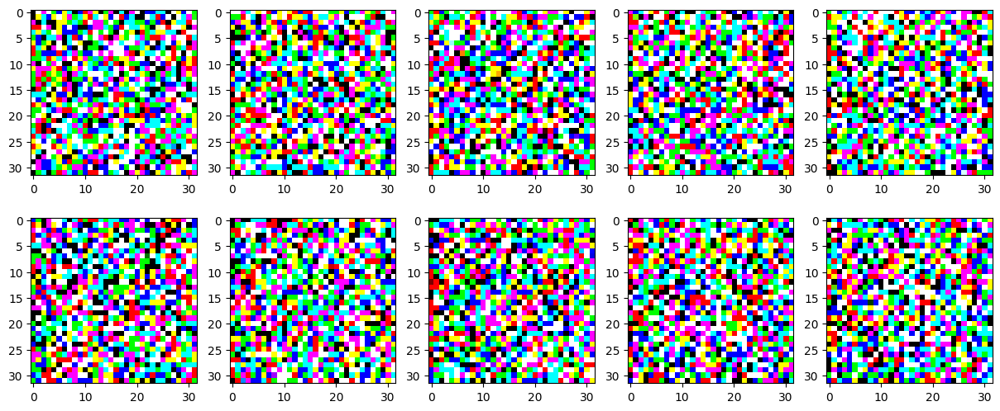

loss for epoch 0: 0.1193: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


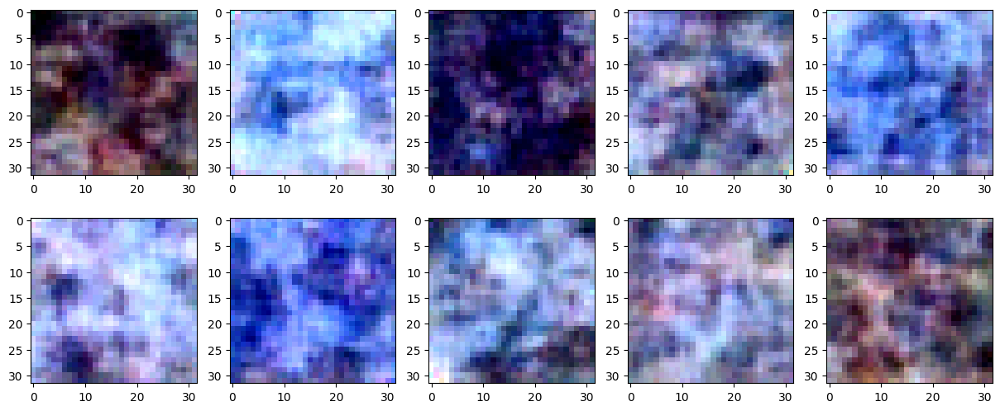

Epoch: 1


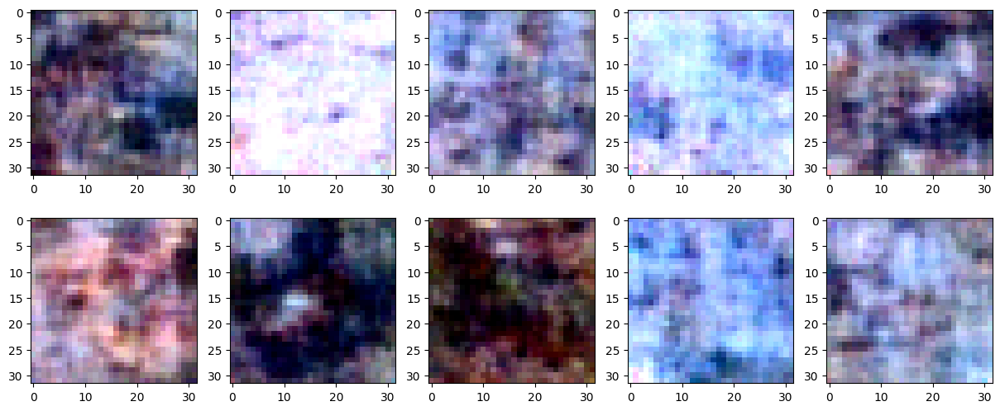

loss for epoch 1: 0.0530: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


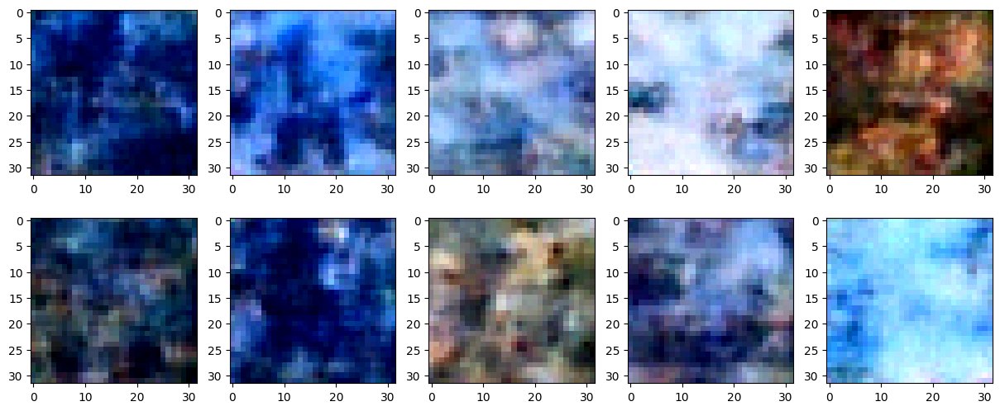

Epoch: 2


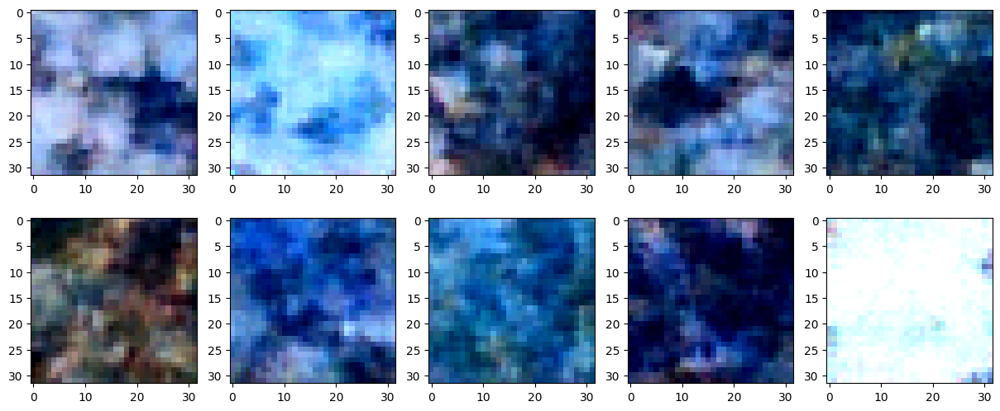

loss for epoch 2: 0.0465: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


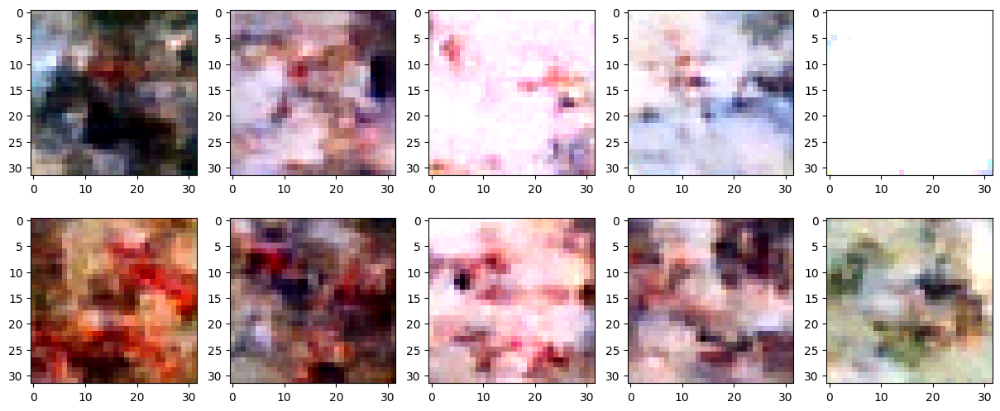

Epoch: 3


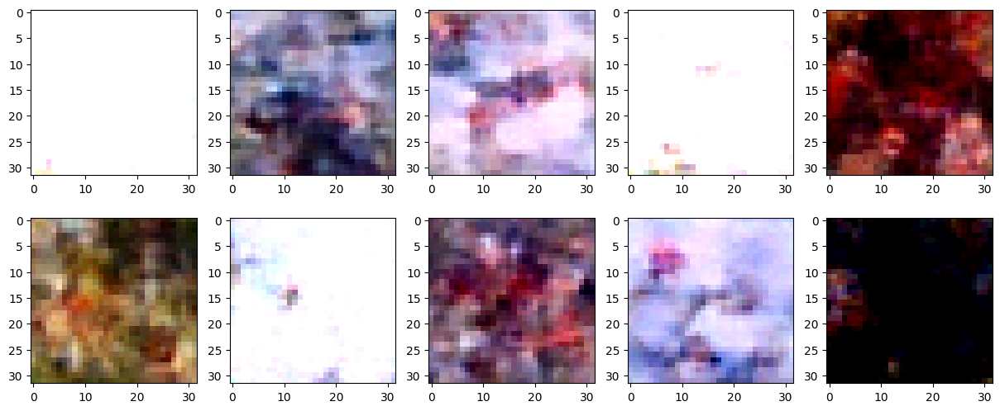

loss for epoch 3: 0.0436: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


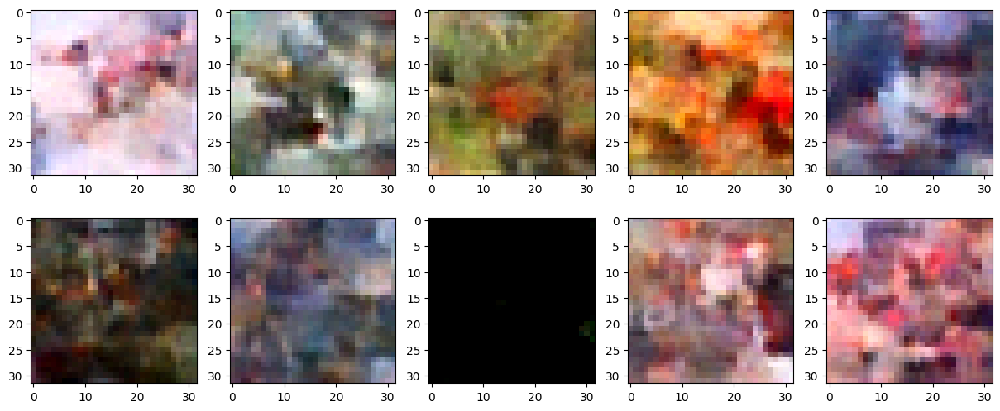

Epoch: 4


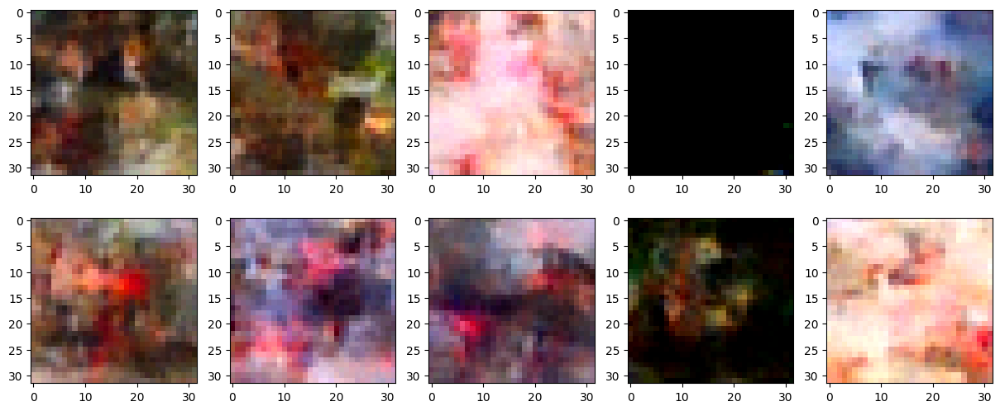

loss for epoch 4: 0.0415: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


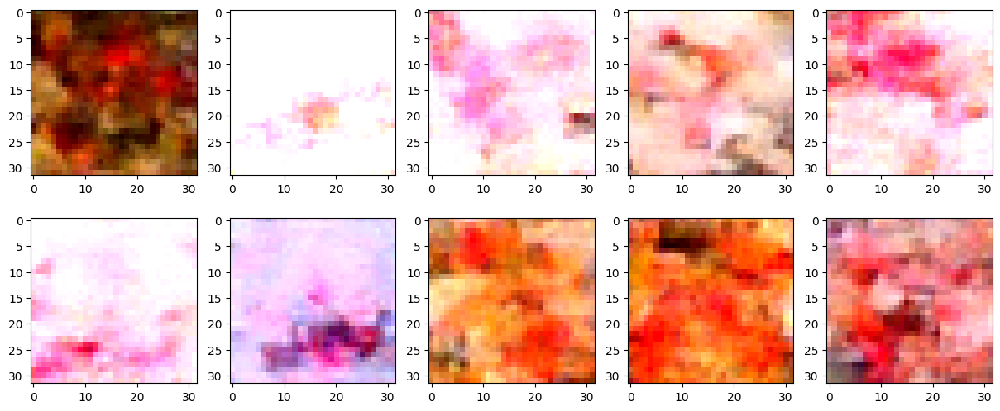

Epoch: 5


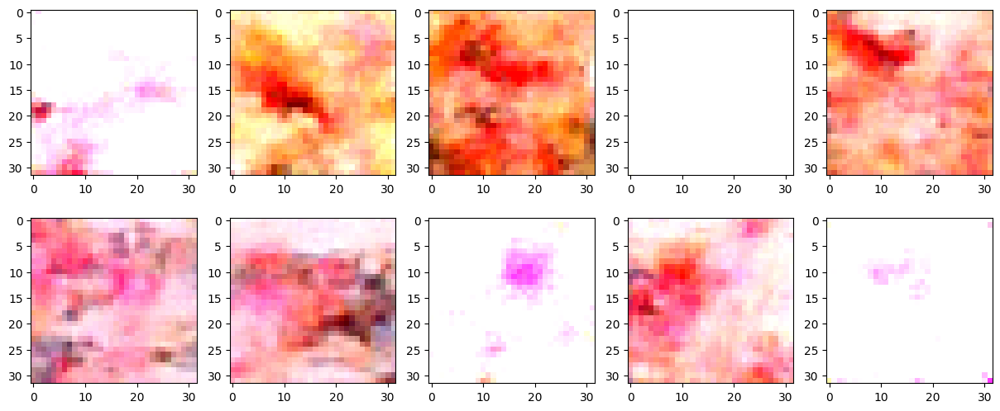

loss for epoch 5: 0.0407: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


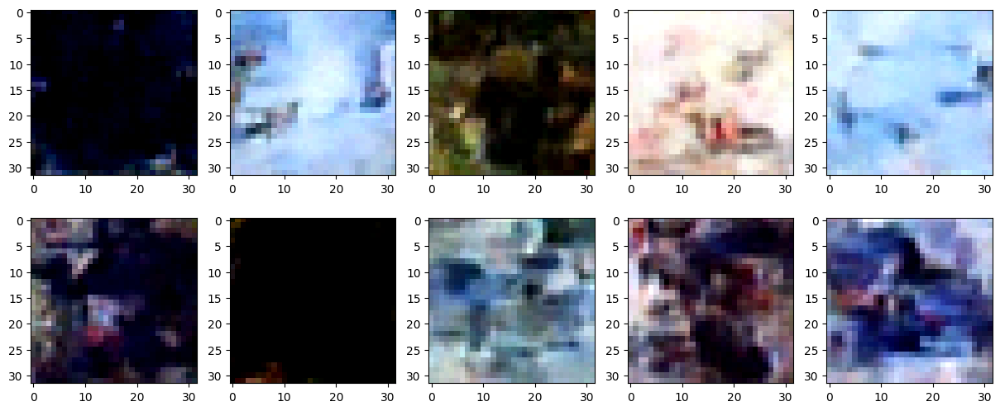

Epoch: 6


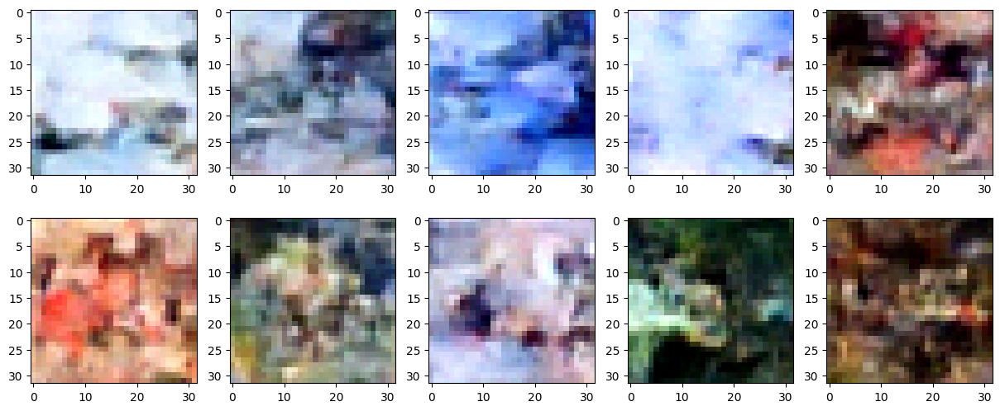

loss for epoch 6: 0.0410: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


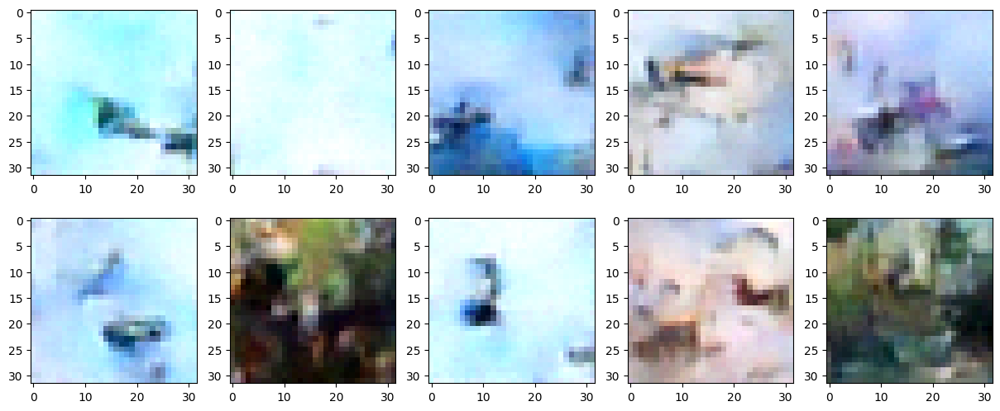

Epoch: 7


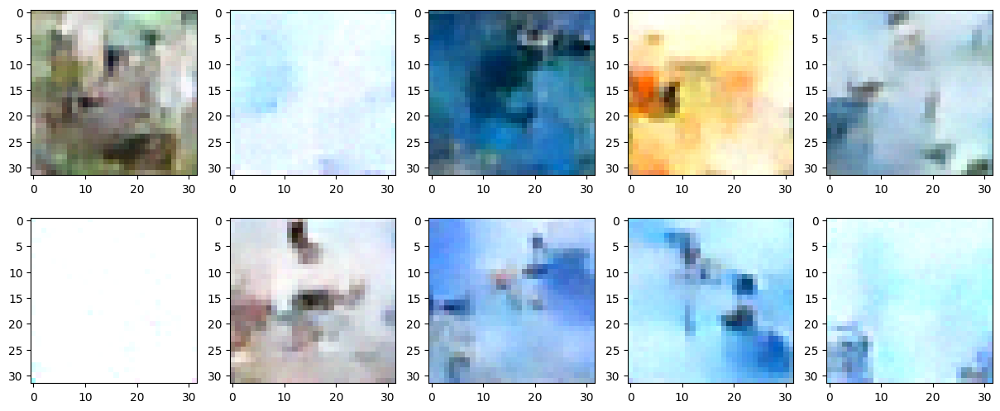

loss for epoch 7: 0.0384: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


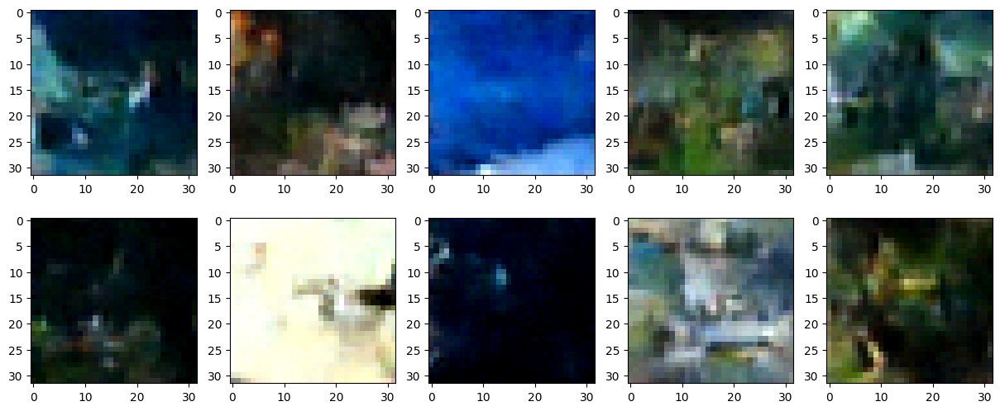

Epoch: 8


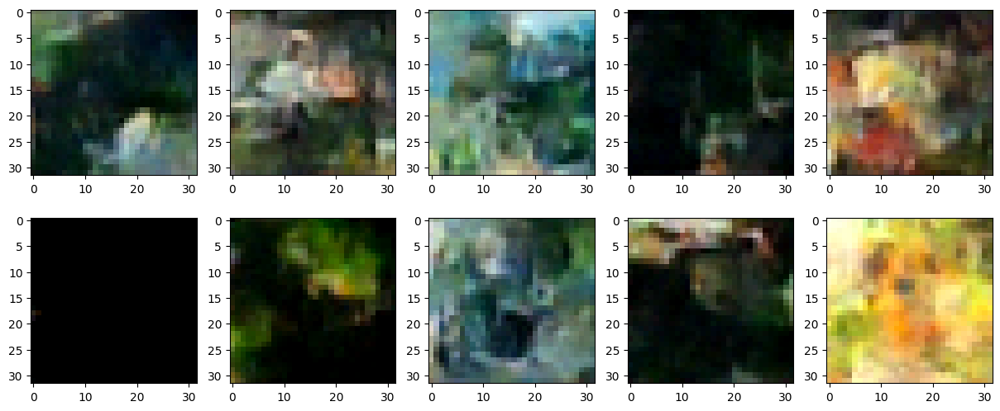

loss for epoch 8: 0.0378: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


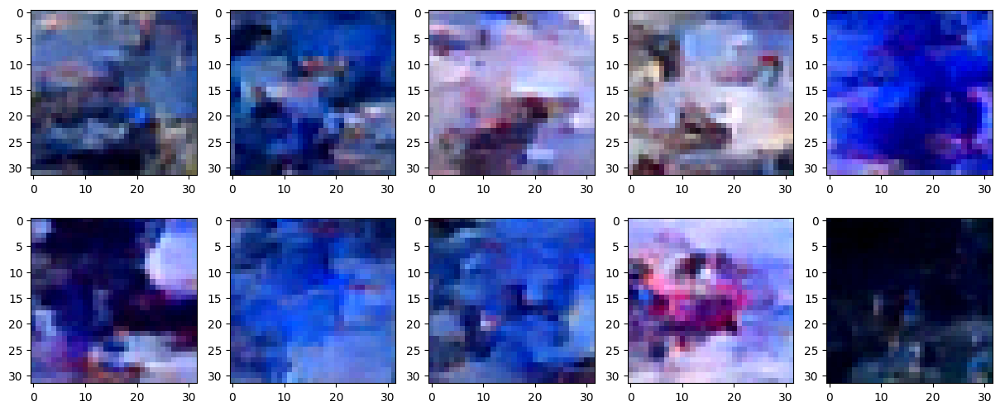

Epoch: 9


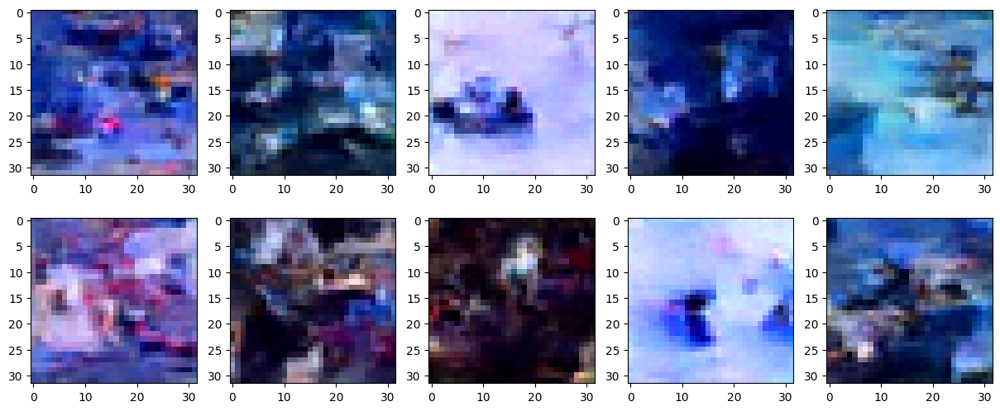

loss for epoch 9: 0.0370: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


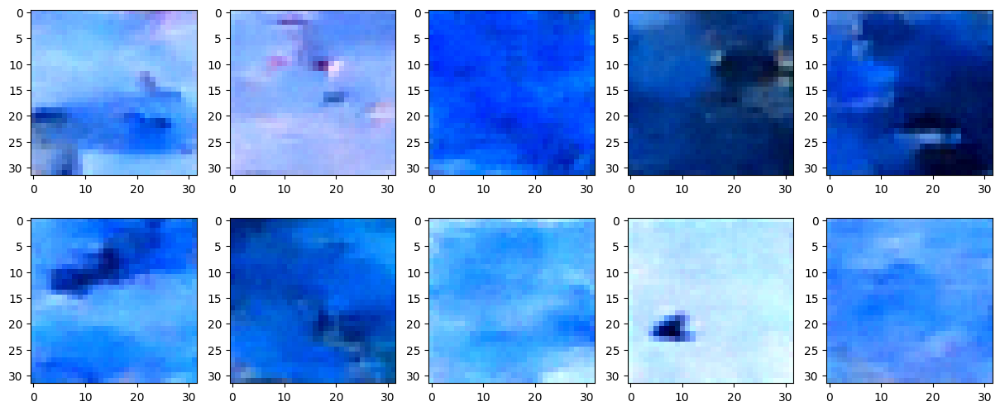

Epoch: 10


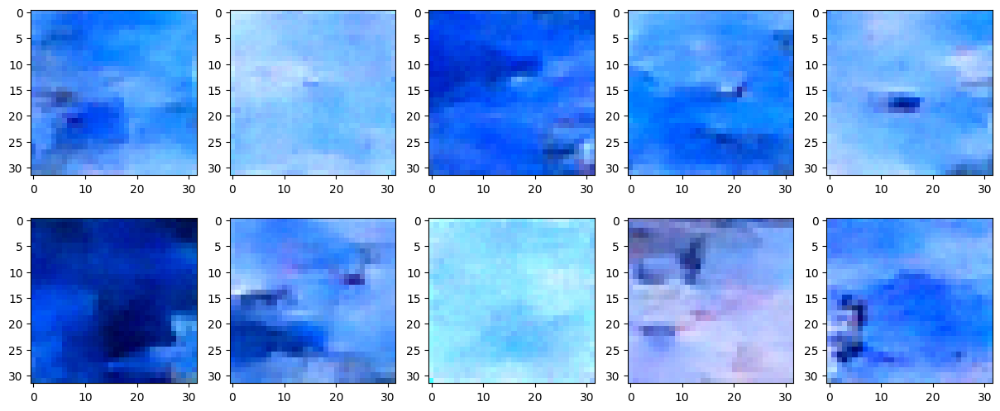

loss for epoch 10: 0.0368: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


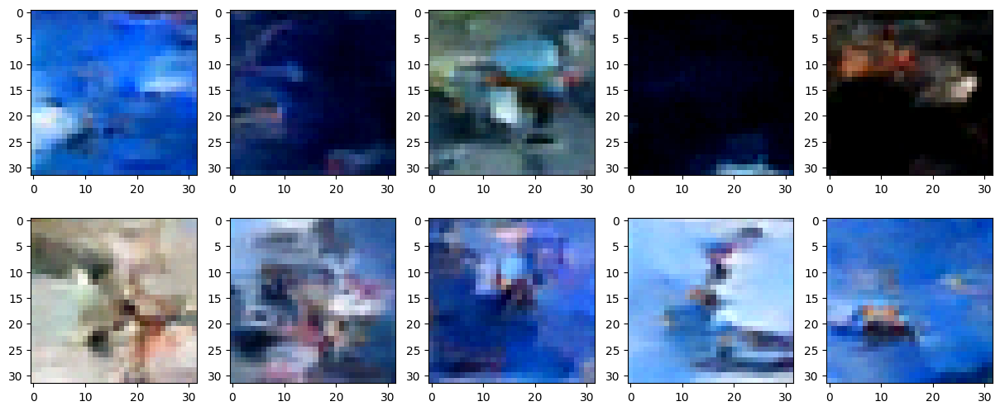

Epoch: 11


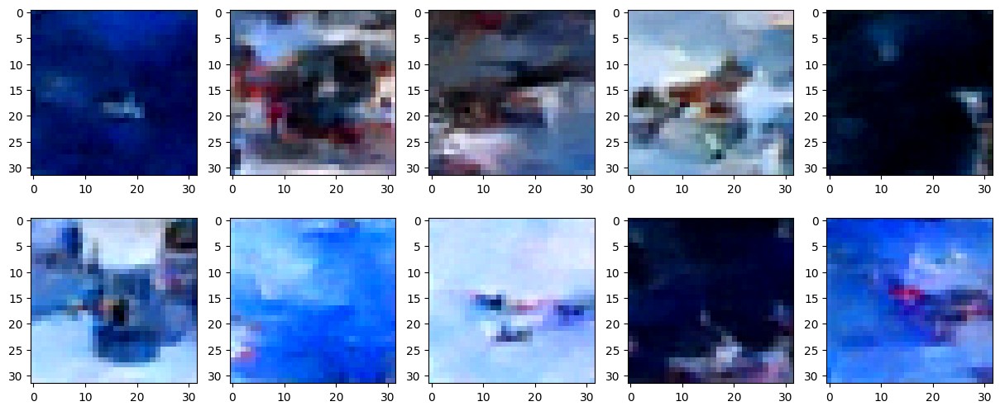

loss for epoch 11: 0.0360: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


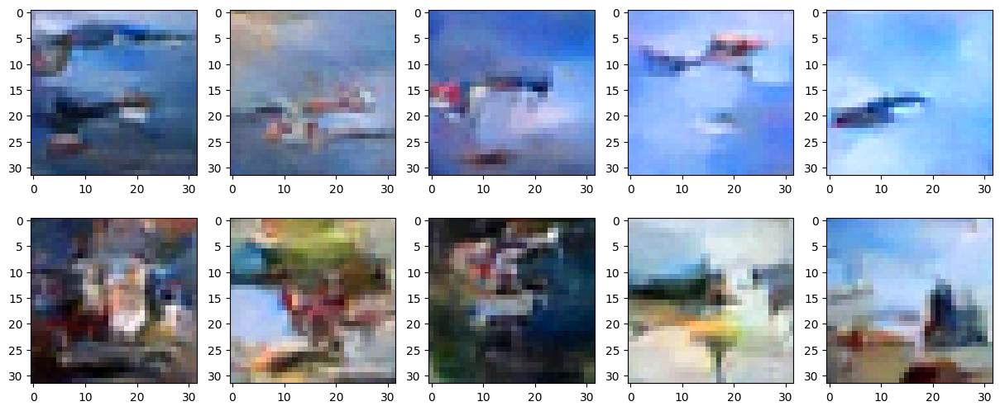

Epoch: 12


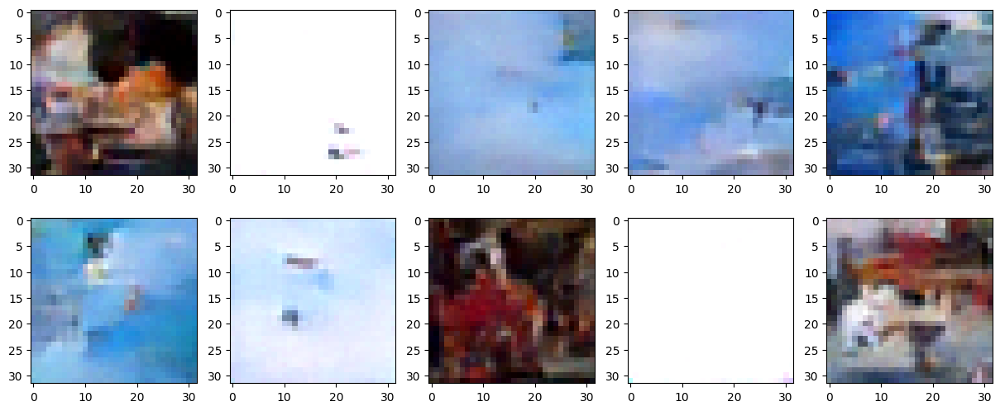

loss for epoch 12: 0.0366: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


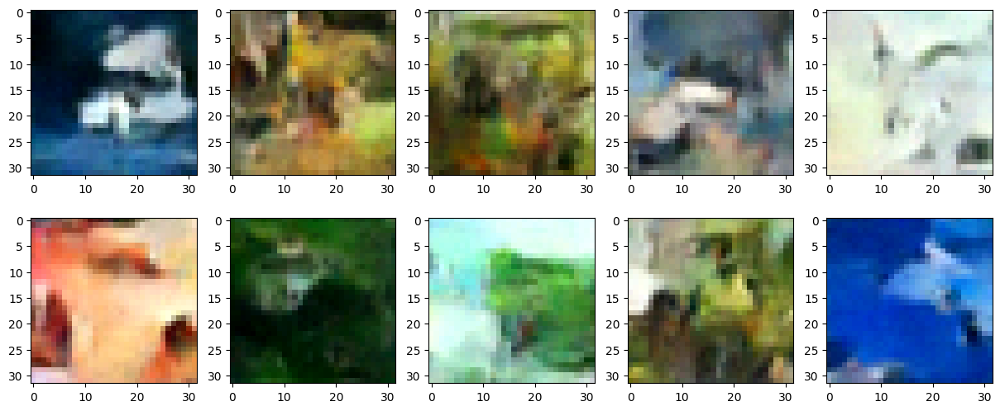

Epoch: 13


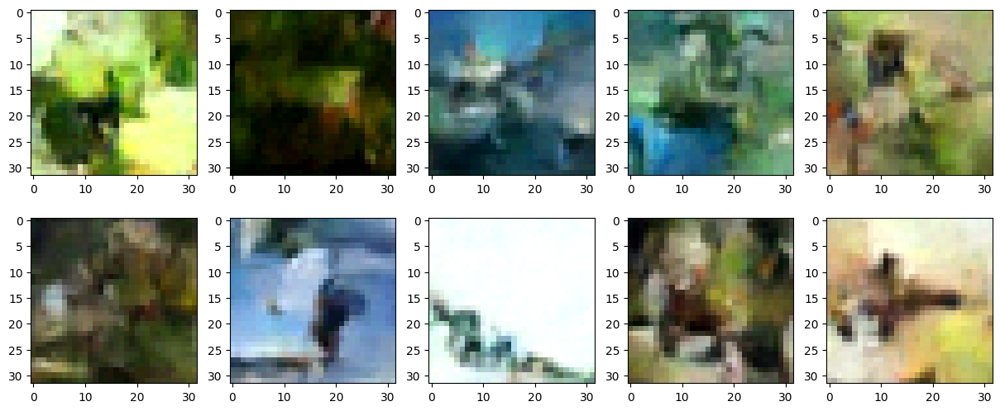

loss for epoch 13: 0.0356: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


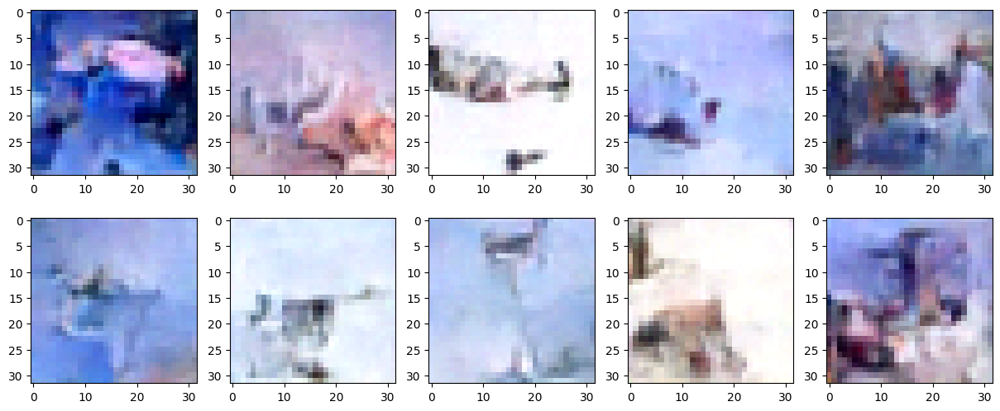

Epoch: 14


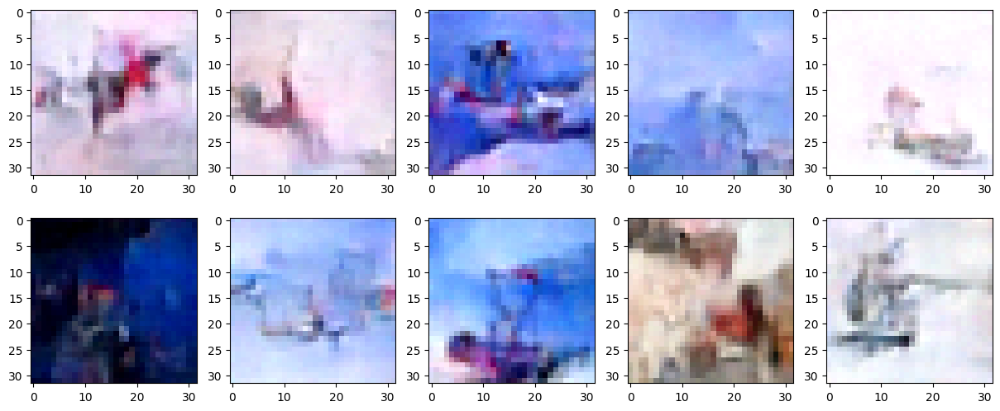

loss for epoch 14: 0.0346: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


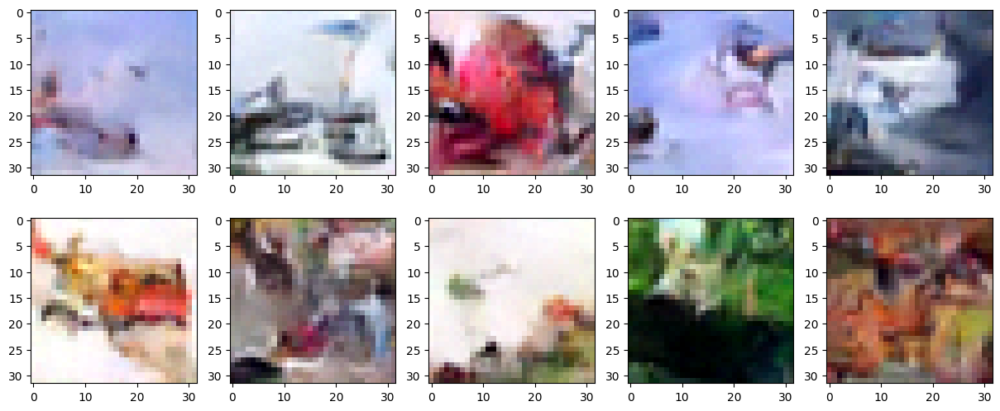

Epoch: 15


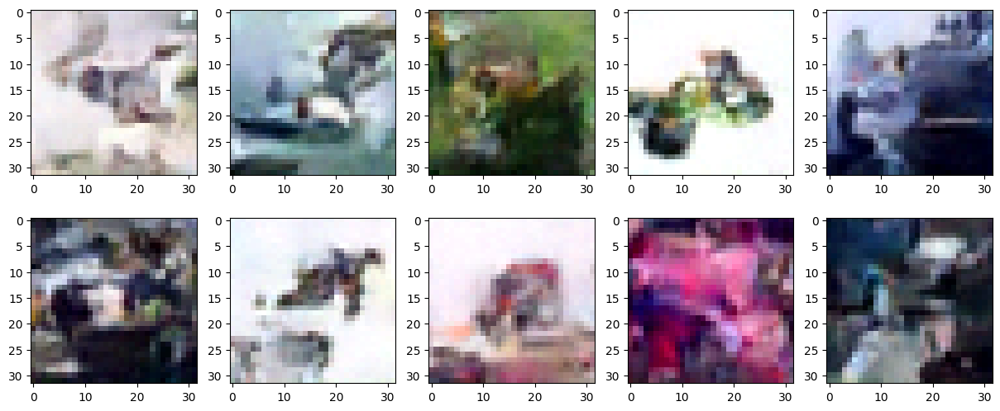

loss for epoch 15: 0.0355: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


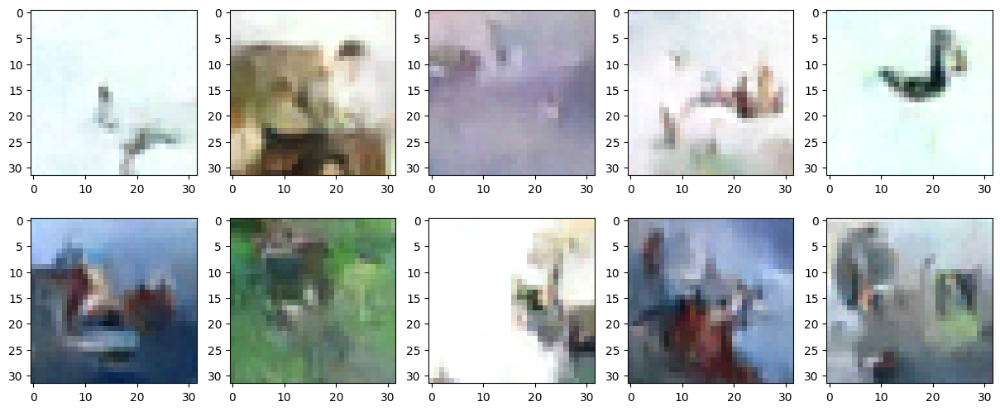

Epoch: 16


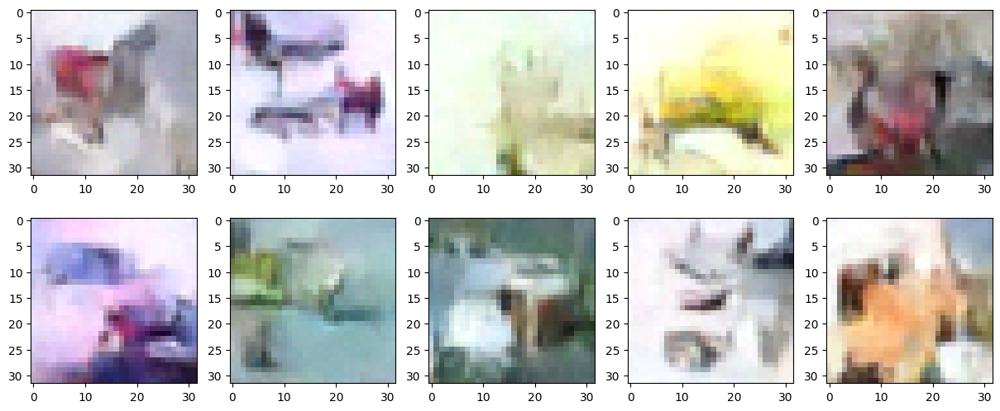

loss for epoch 16: 0.0344: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


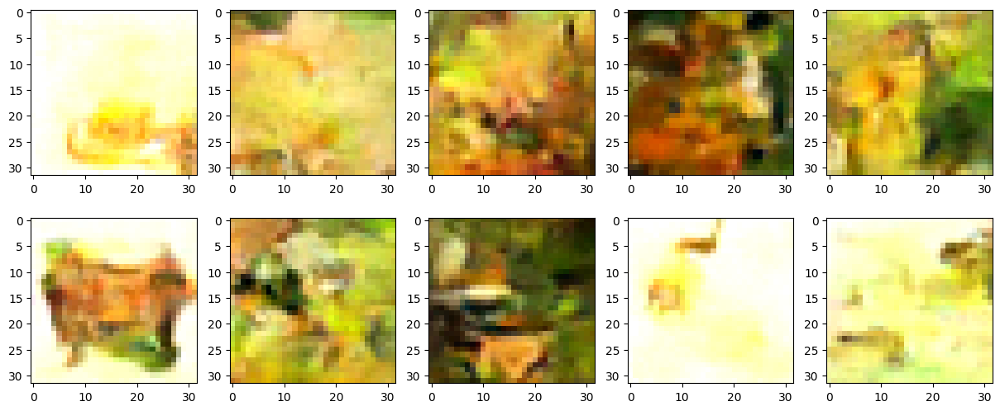

Epoch: 17


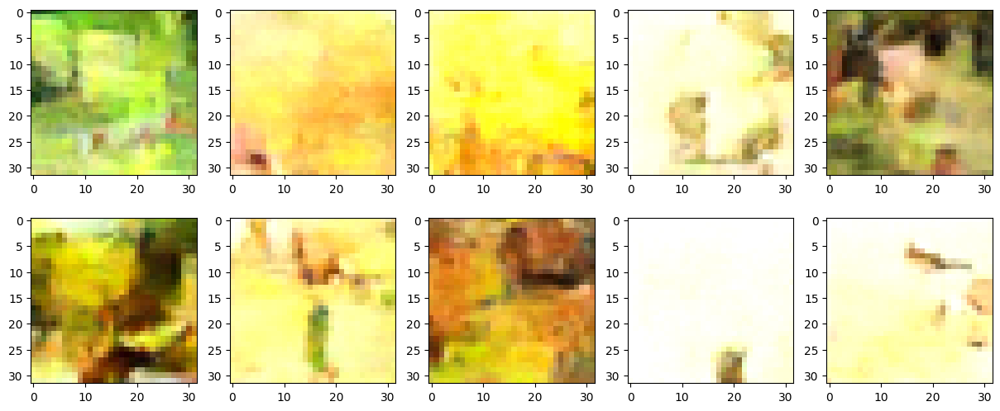

loss for epoch 17: 0.0343: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


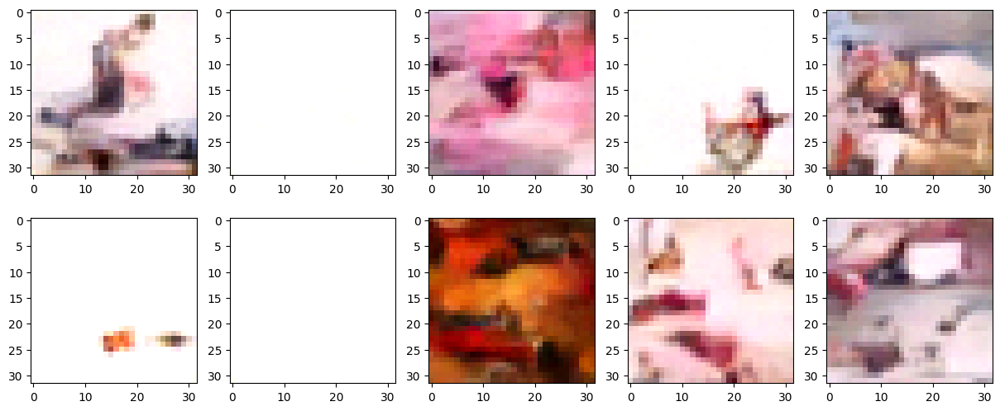

Epoch: 18


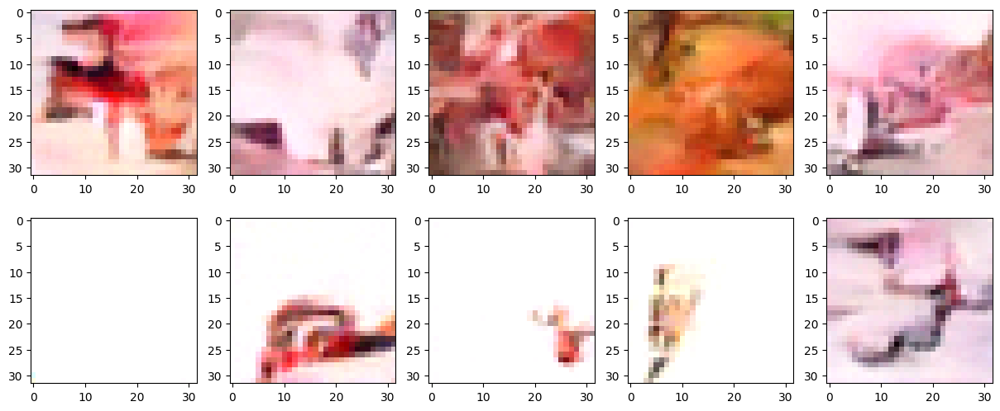

loss for epoch 18: 0.0346: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


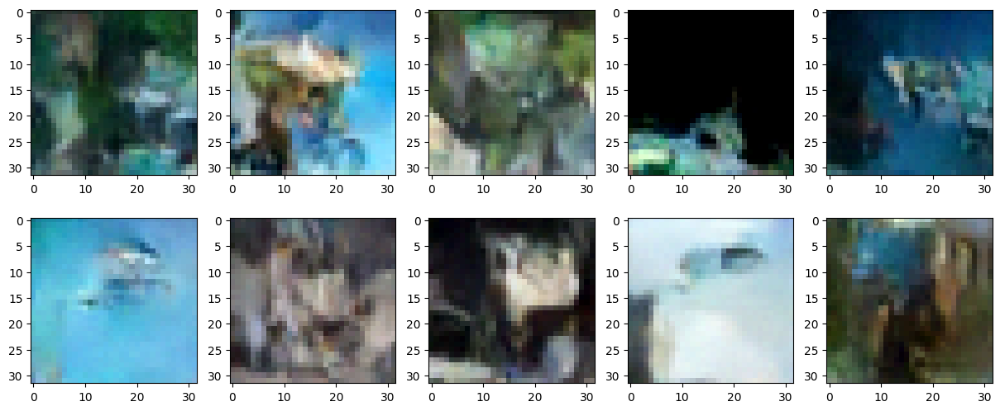

Epoch: 19


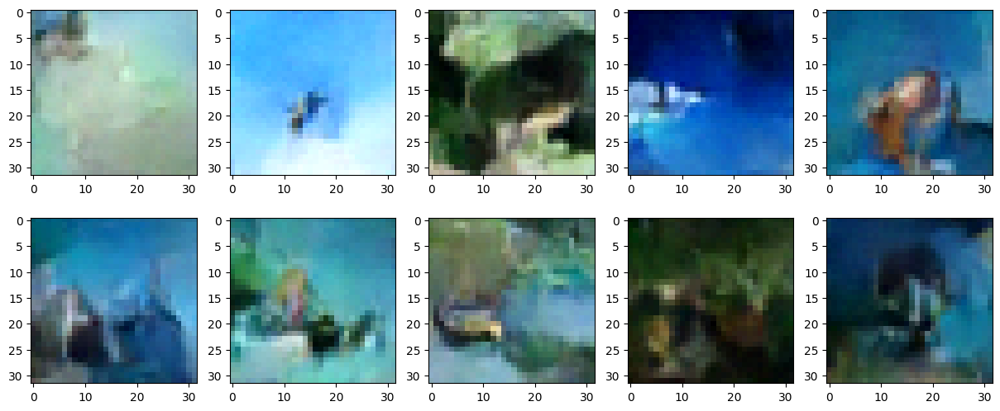

loss for epoch 19: 0.0342: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


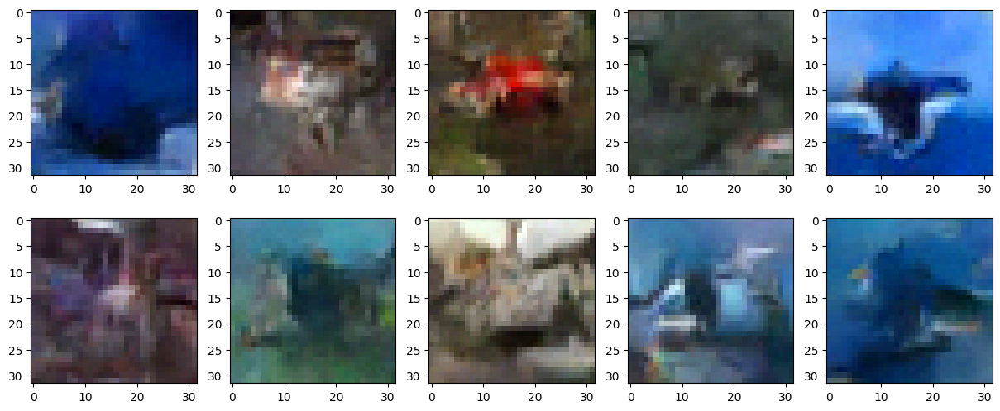

Epoch: 20


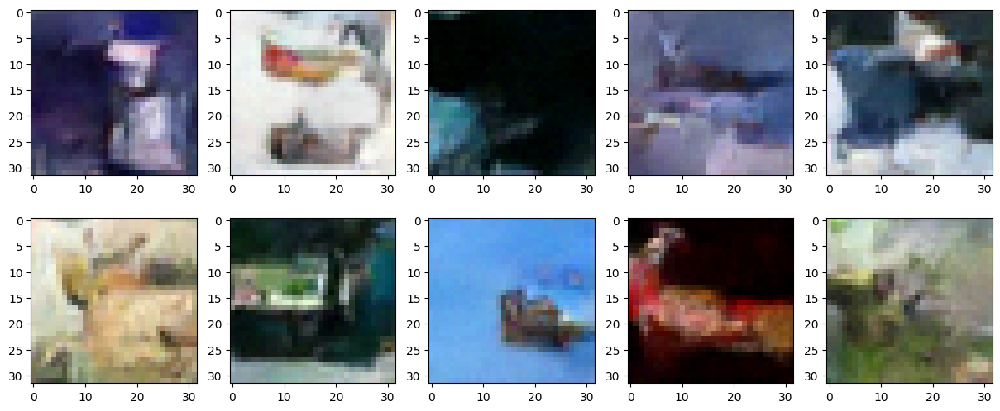

loss for epoch 20: 0.0338: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


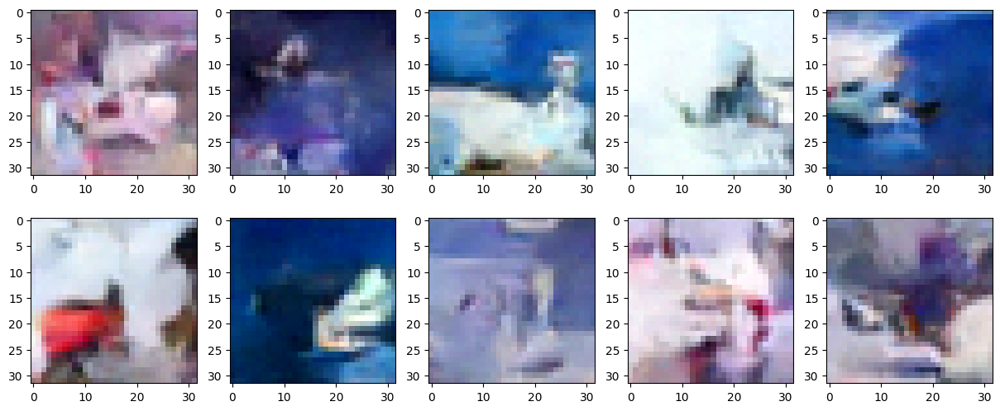

Epoch: 21


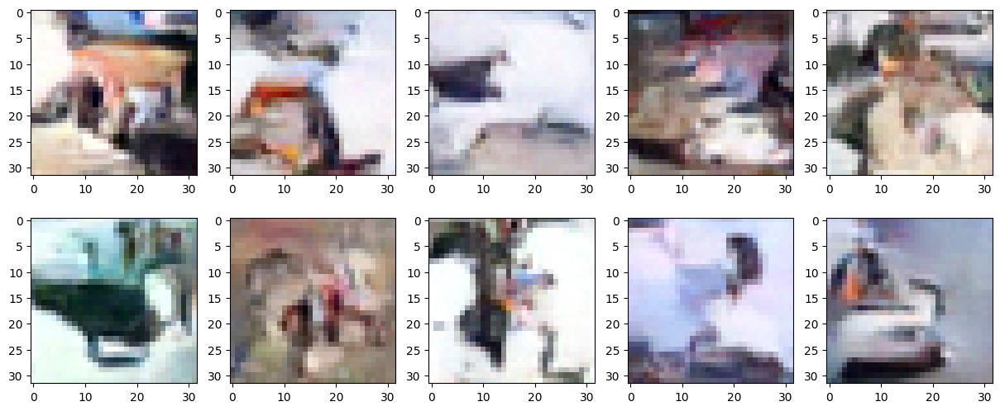

loss for epoch 21: 0.0337: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


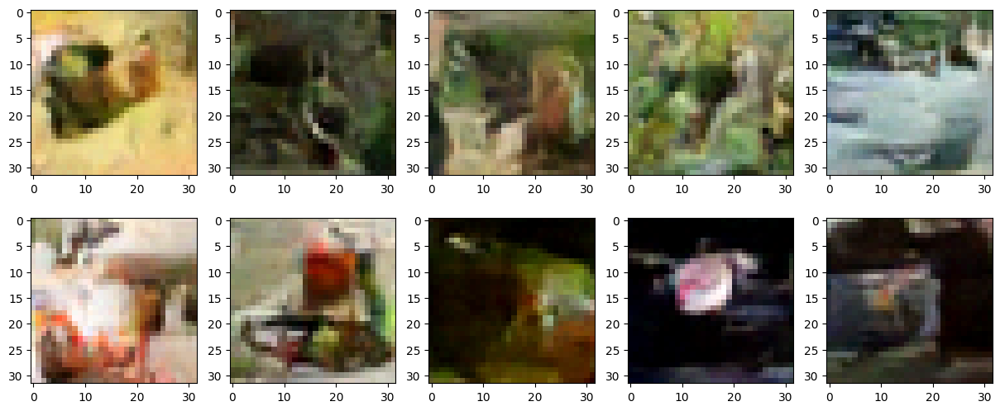

Epoch: 22


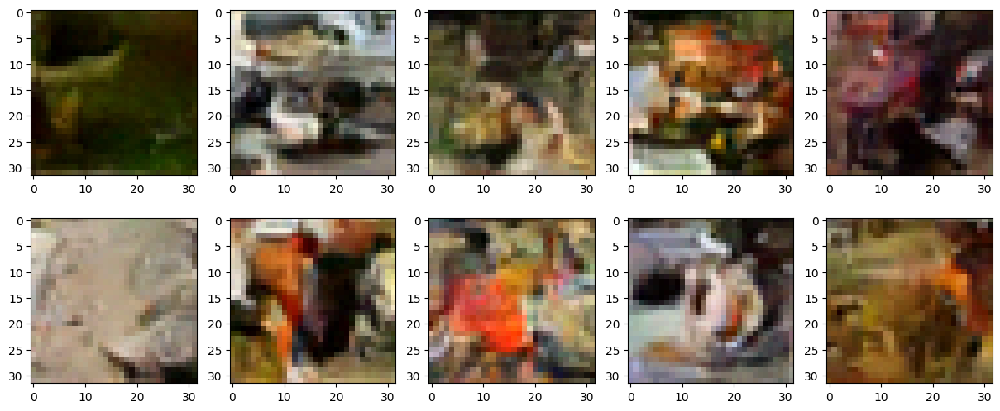

loss for epoch 22: 0.0346: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


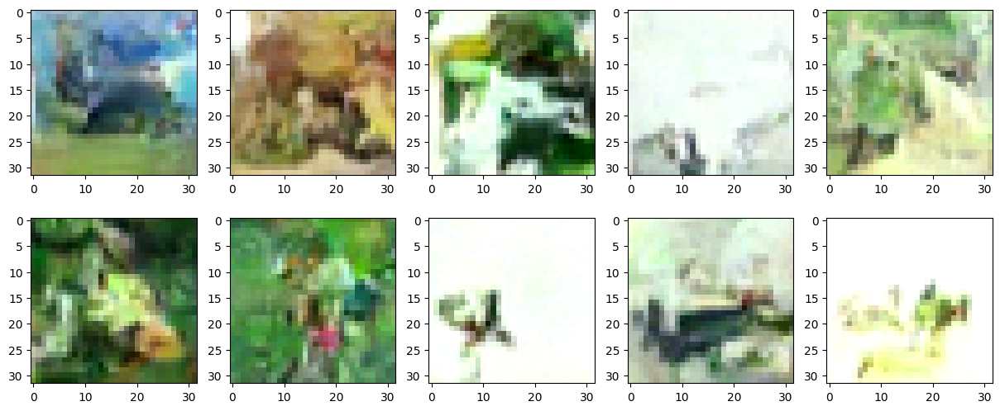

Epoch: 23


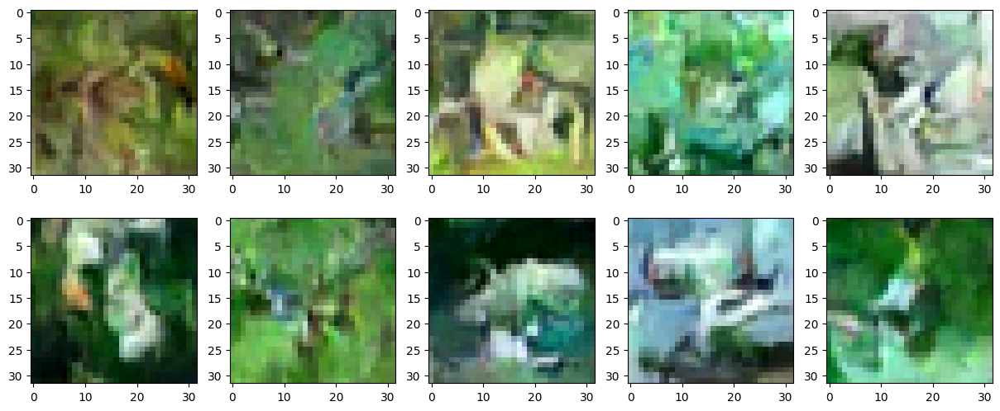

loss for epoch 23: 0.0340: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


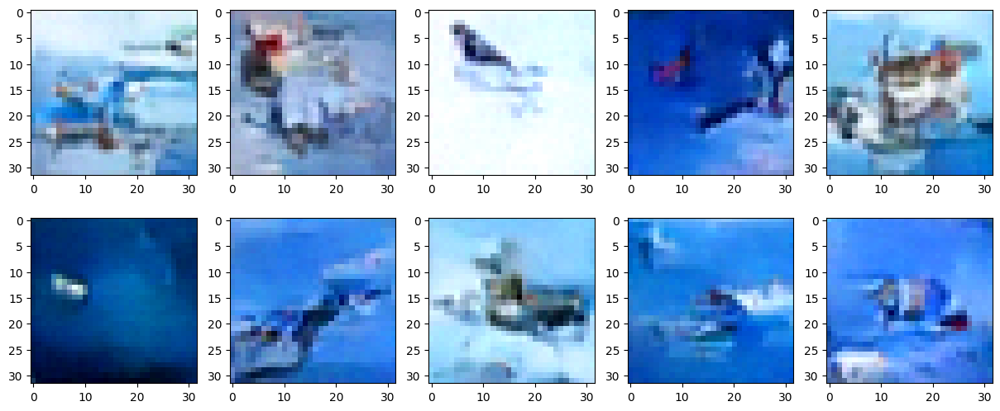

Epoch: 24


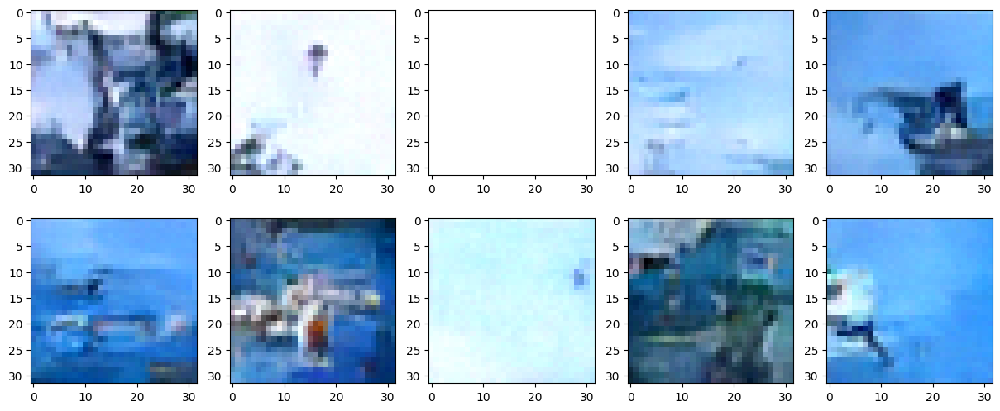

loss for epoch 24: 0.0335: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


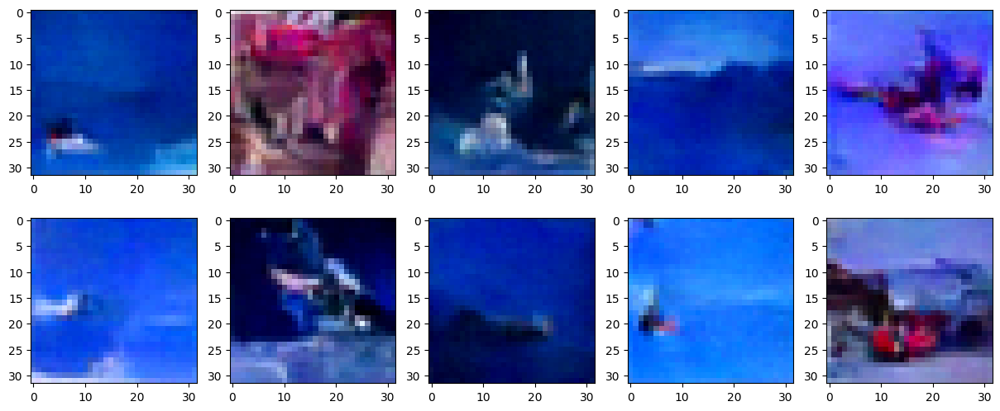

Epoch: 25


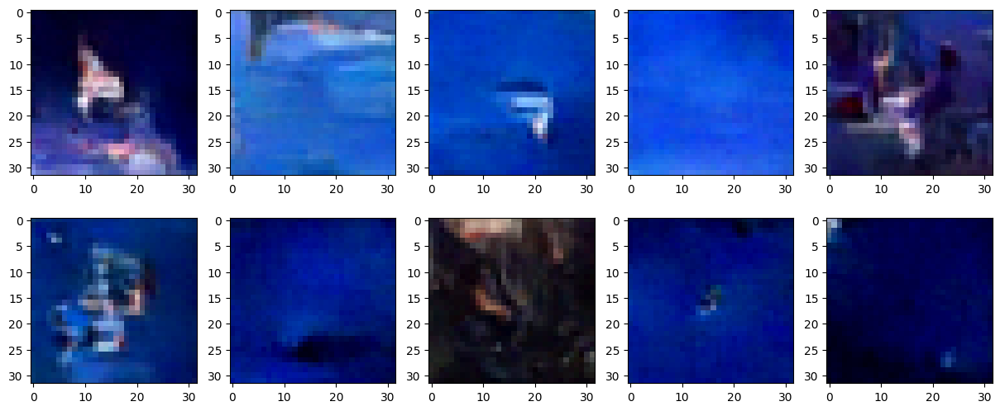

loss for epoch 25: 0.0329: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


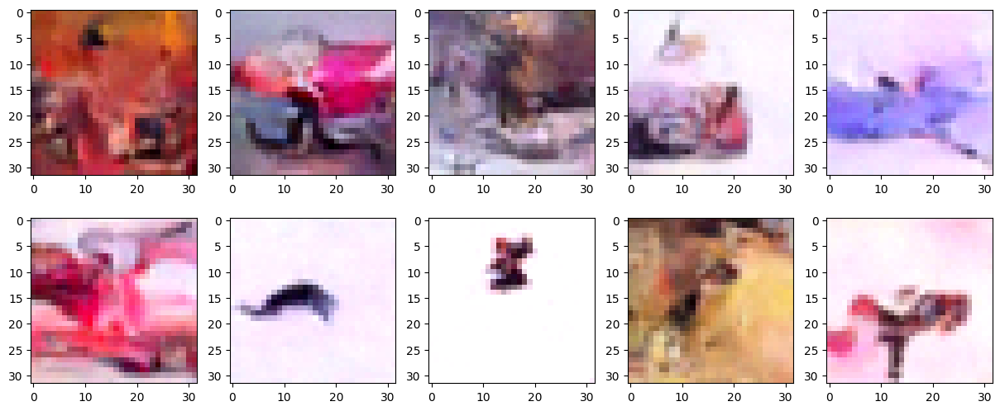

Epoch: 26


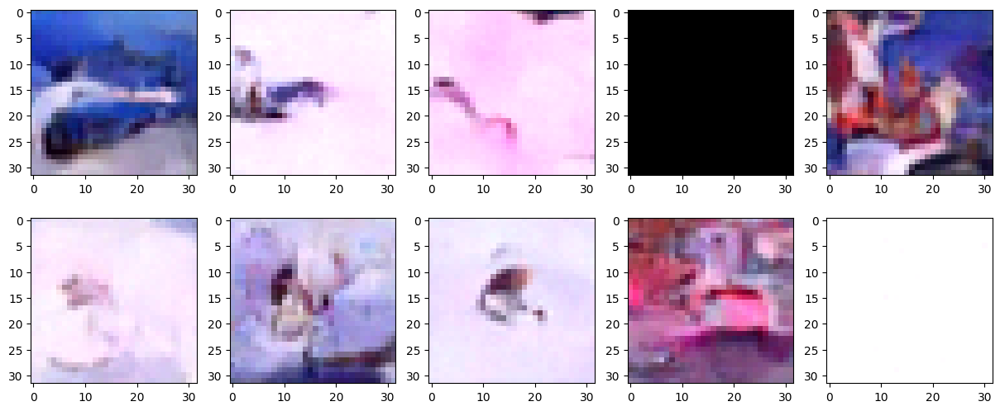

loss for epoch 26: 0.0333: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


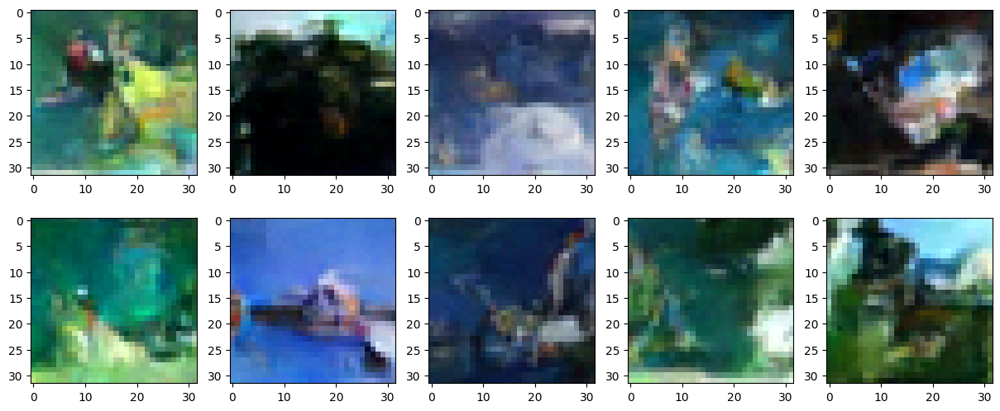

Epoch: 27


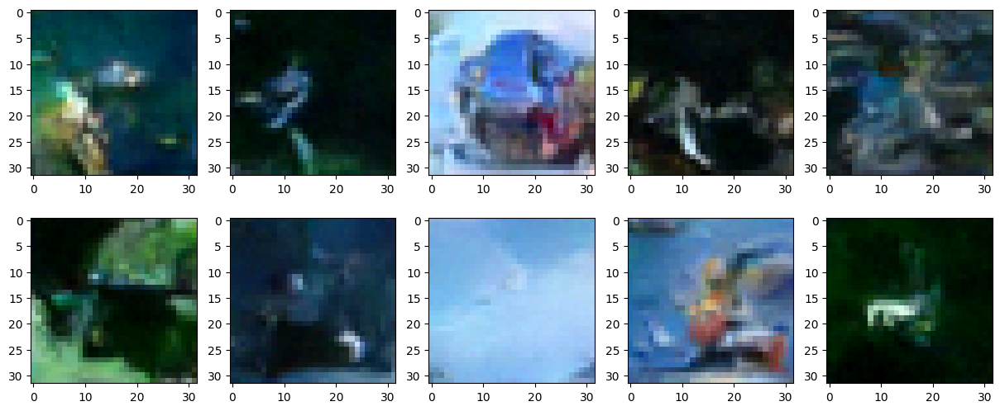

loss for epoch 27: 0.0331: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


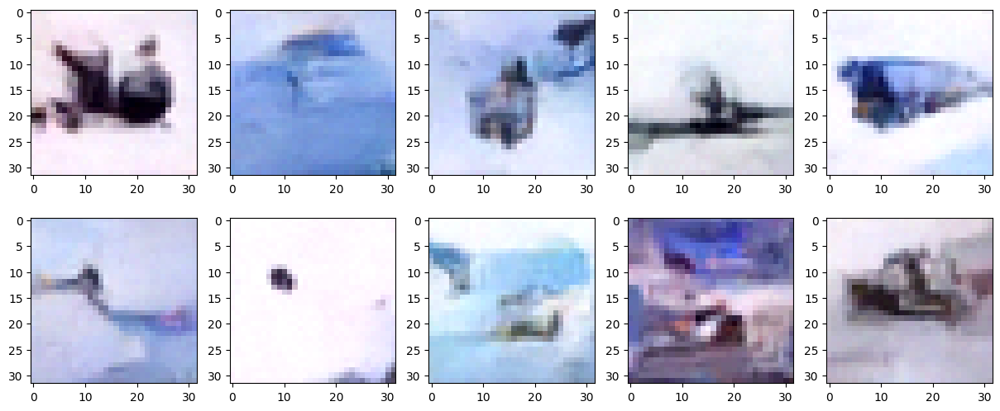

Epoch: 28


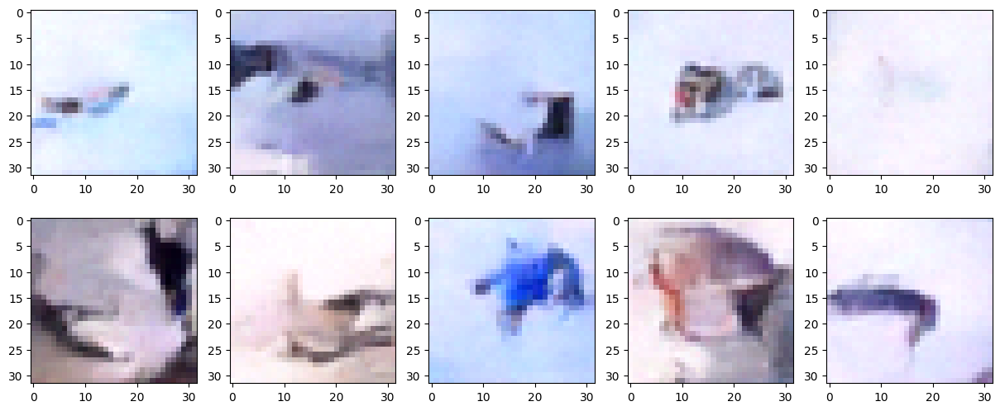

loss for epoch 28: 0.0331: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


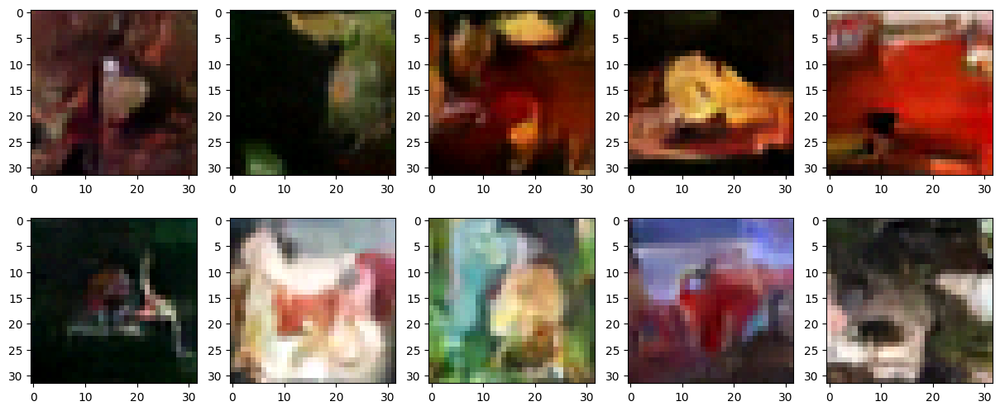

Epoch: 29


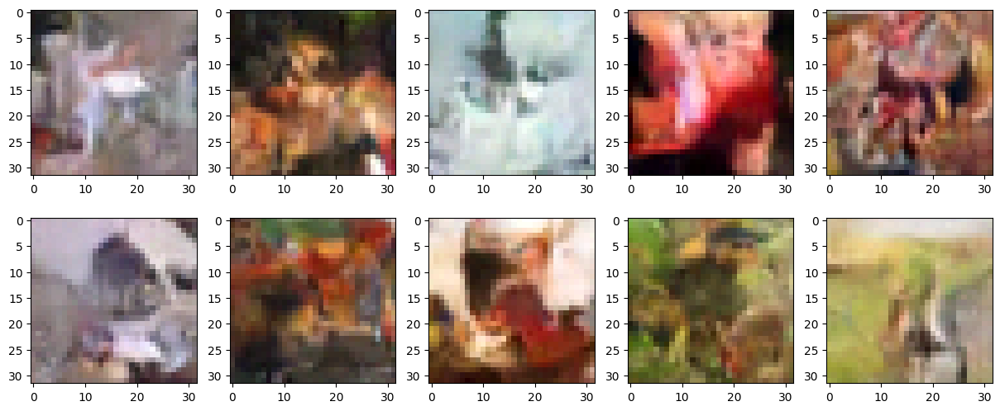

loss for epoch 29: 0.0328: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


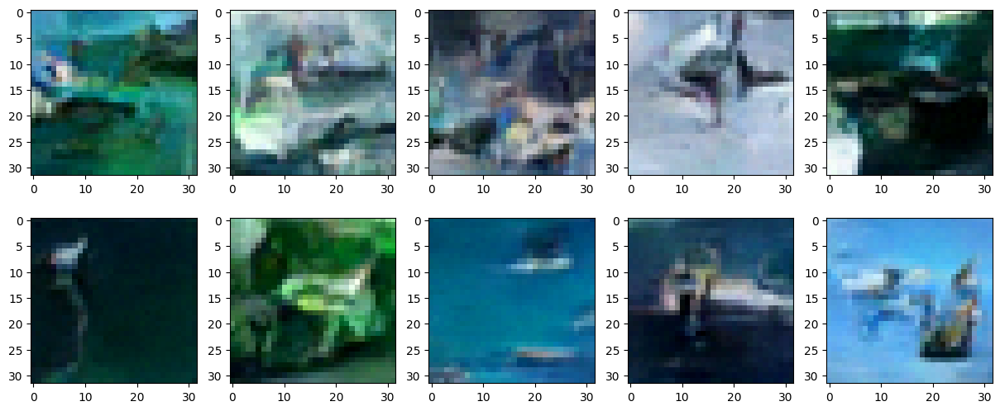

Epoch: 30


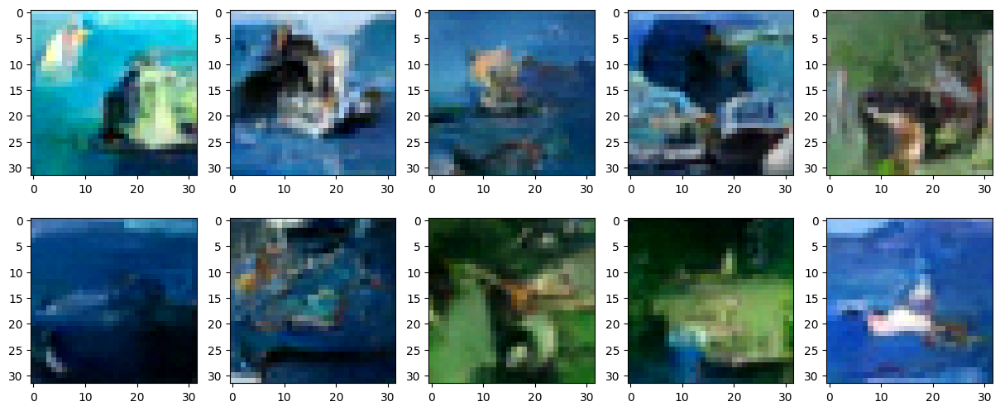

loss for epoch 30: 0.0341: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


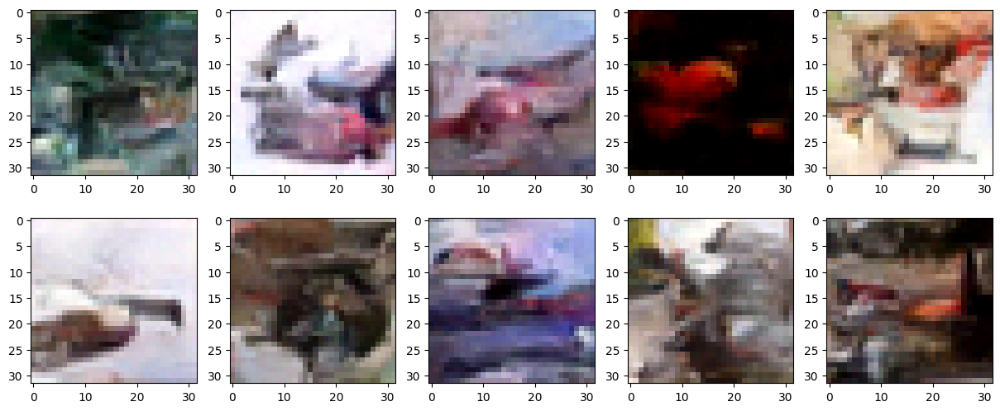

Epoch: 31


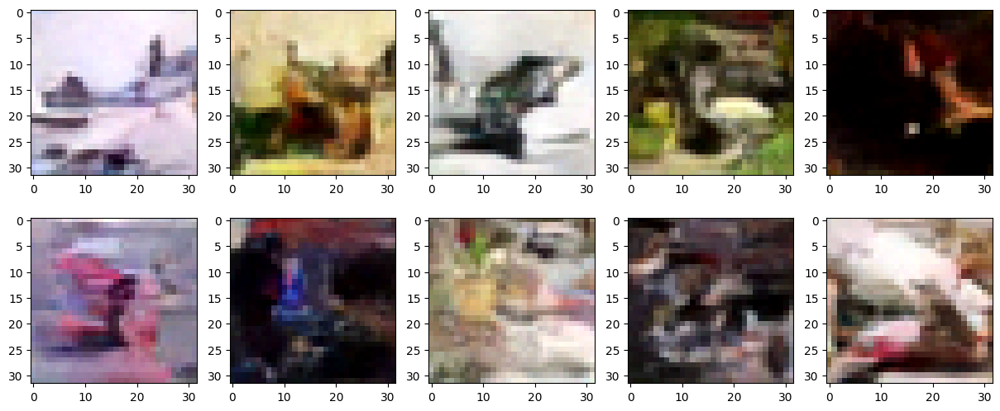

loss for epoch 31: 0.0330: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


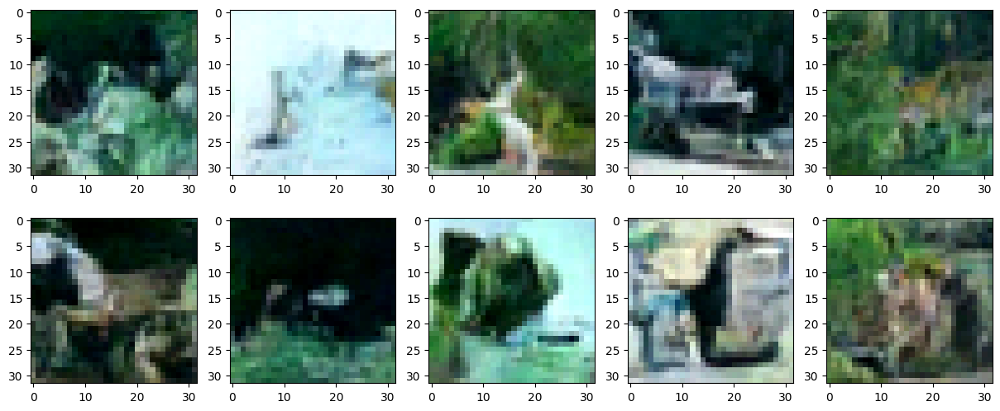

Epoch: 32


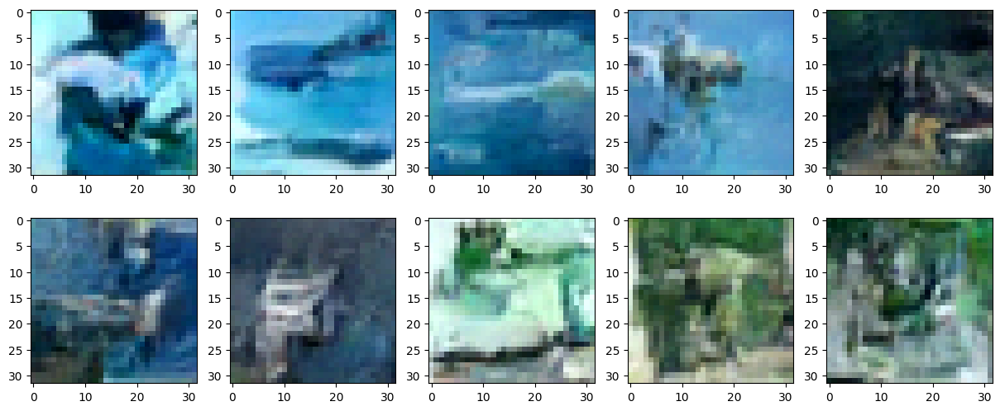

loss for epoch 32: 0.0323: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


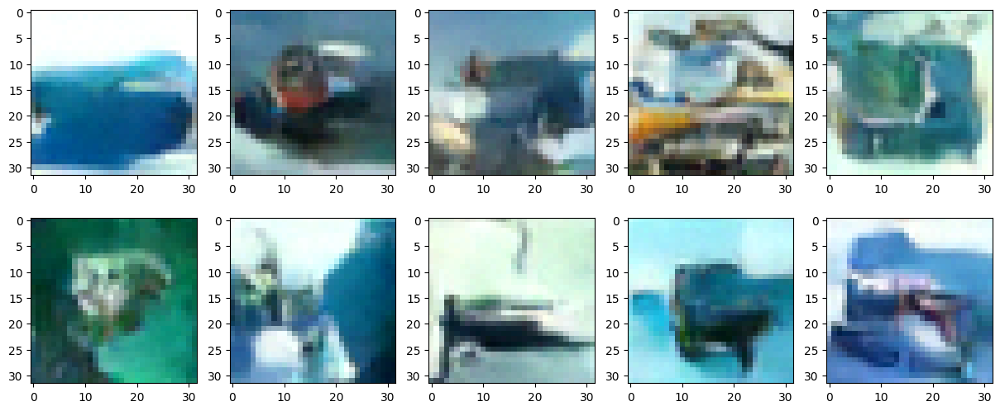

Epoch: 33


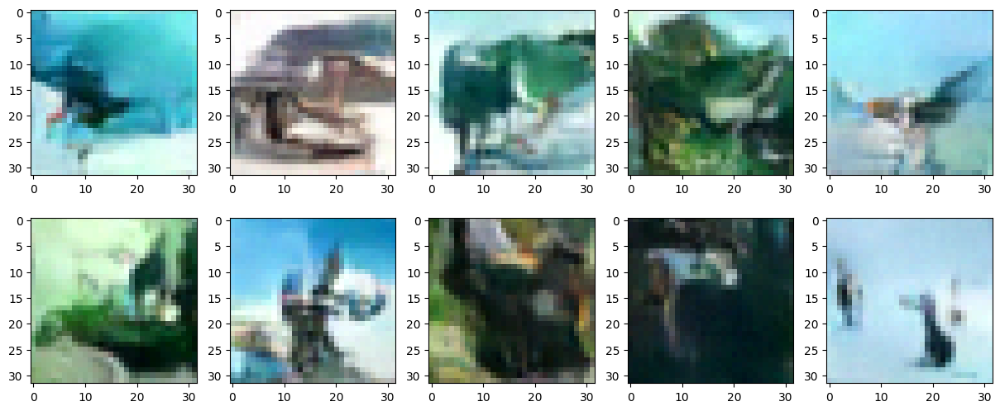

loss for epoch 33: 0.0326: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


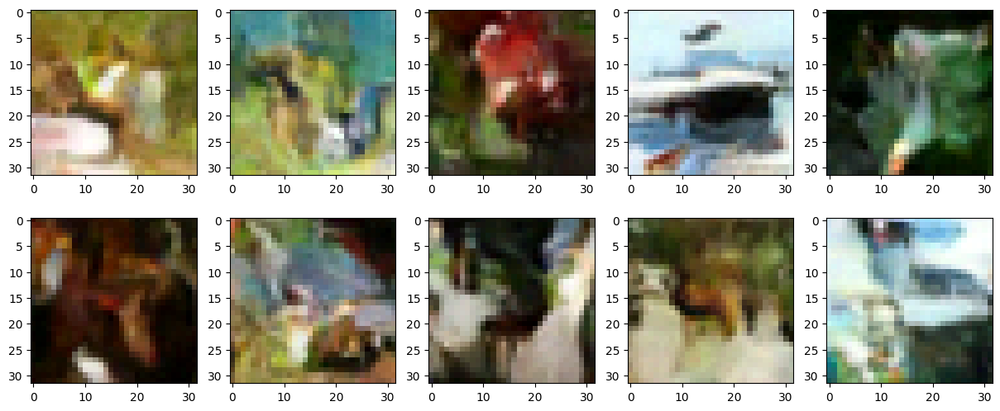

Epoch: 34


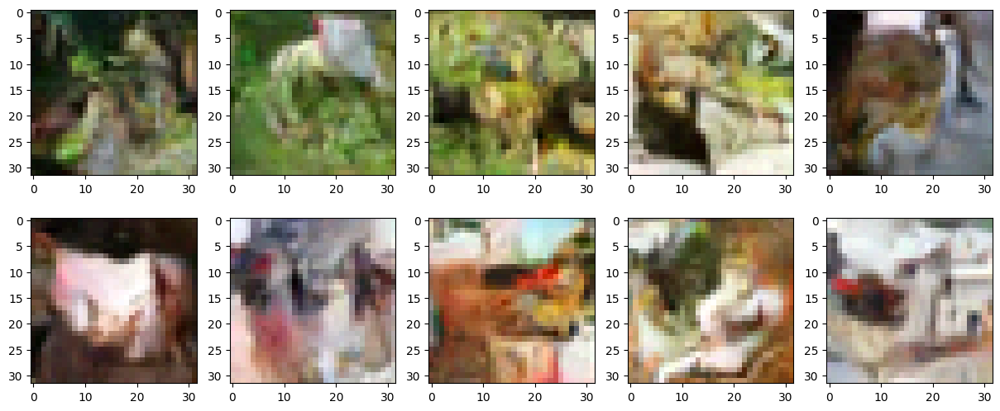

loss for epoch 34: 0.0323: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


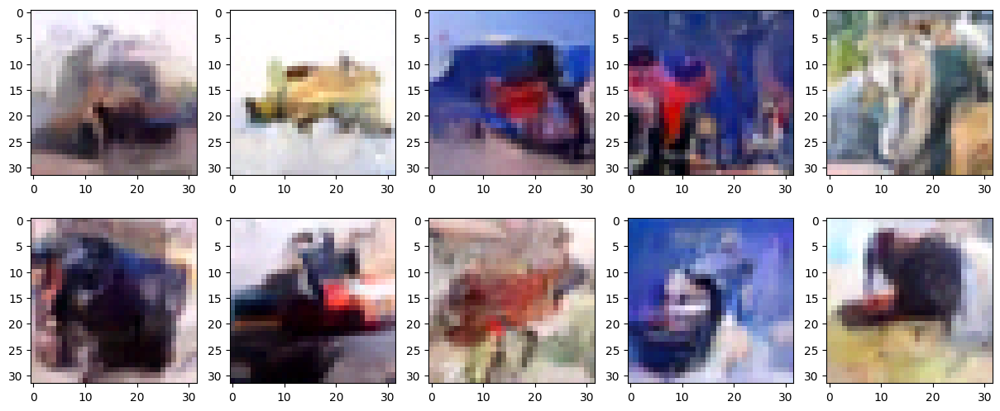

Epoch: 35


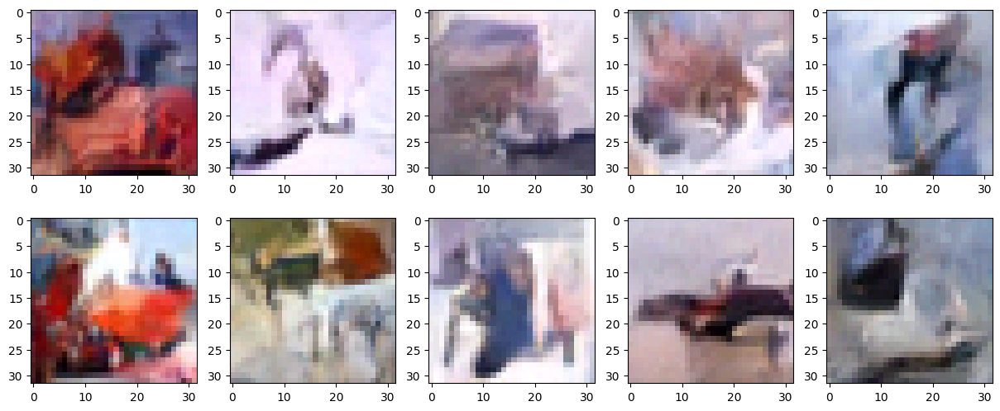

loss for epoch 35: 0.0323: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


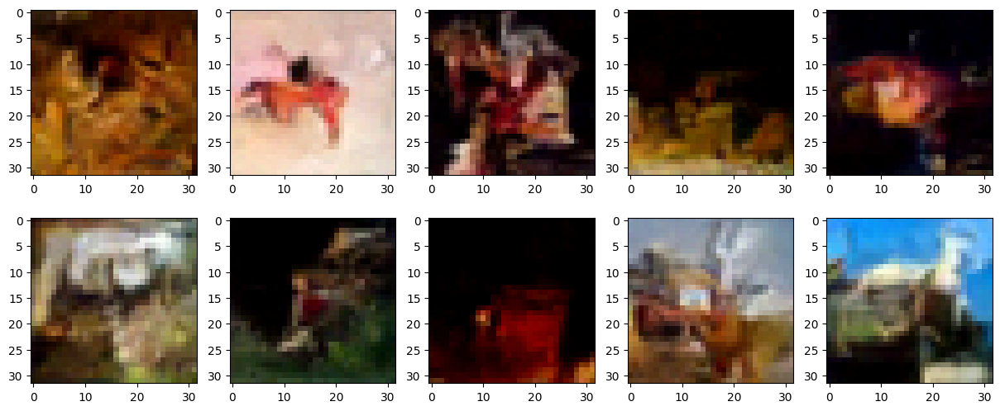

Epoch: 36


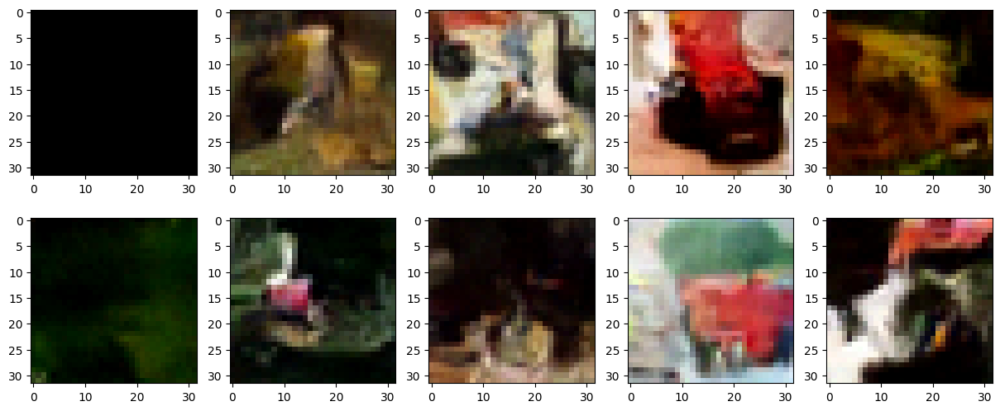

loss for epoch 36: 0.0323: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


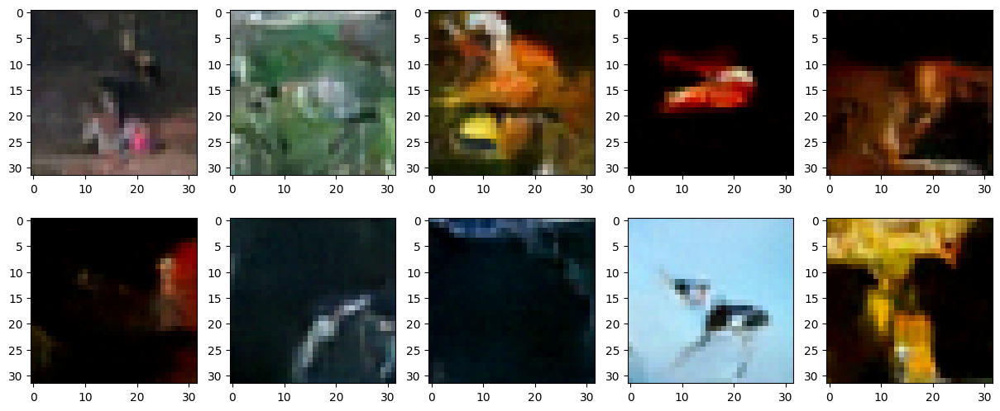

Epoch: 37


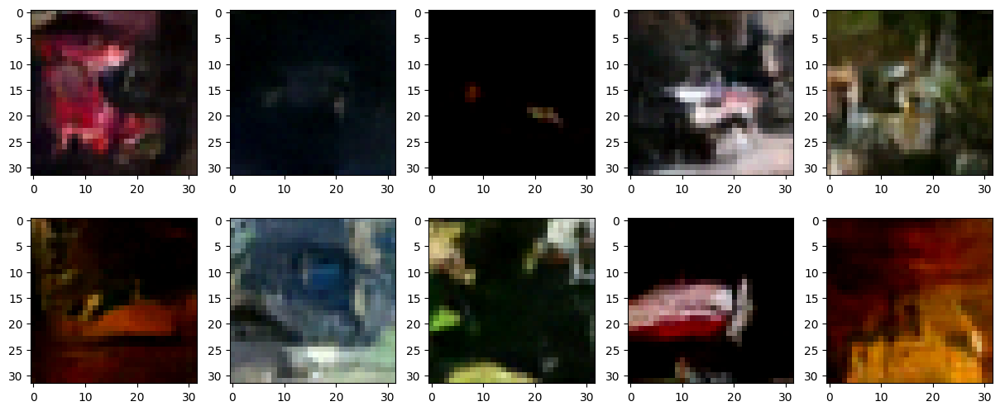

loss for epoch 37: 0.0326: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


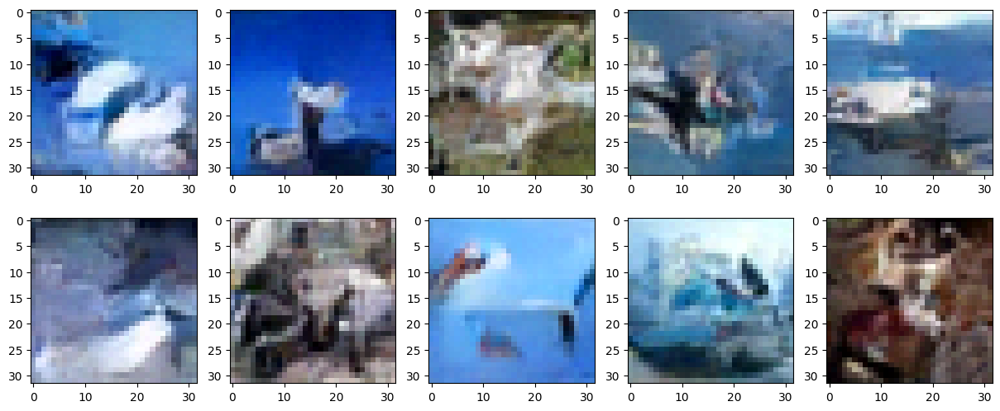

Epoch: 38


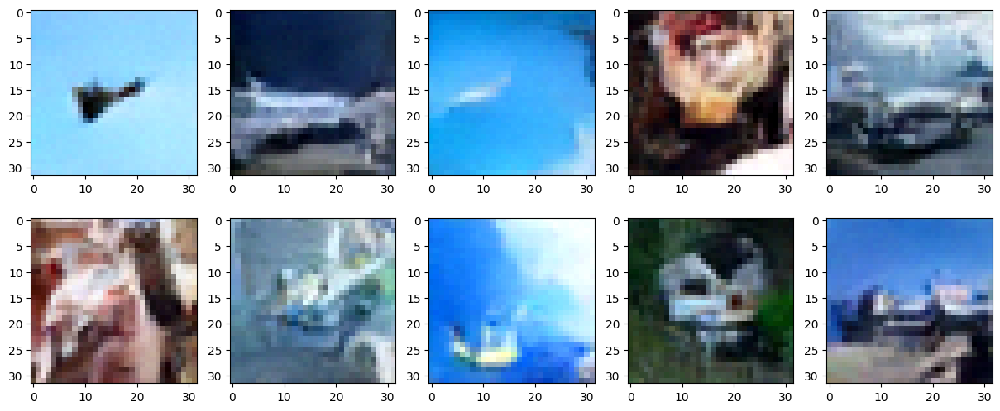

loss for epoch 38: 0.0321: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


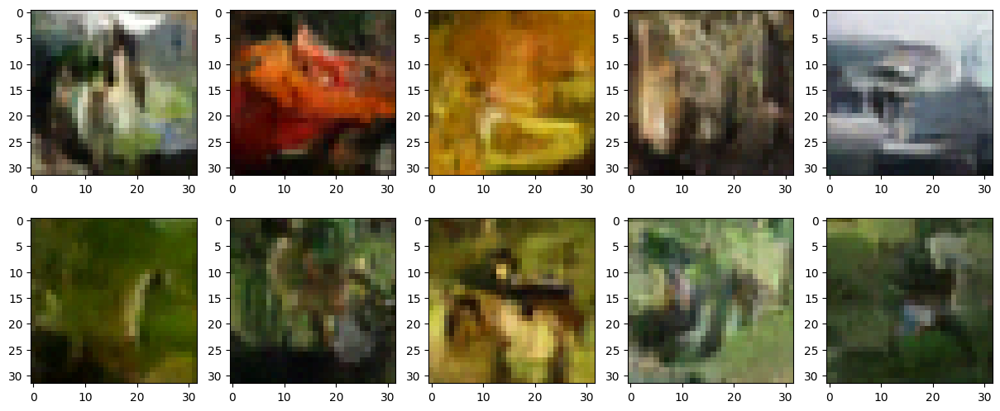

Epoch: 39


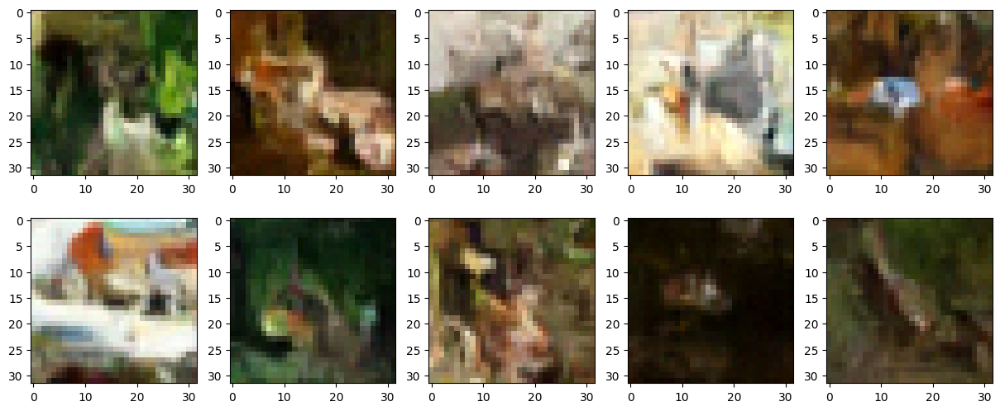

loss for epoch 39: 0.0319: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


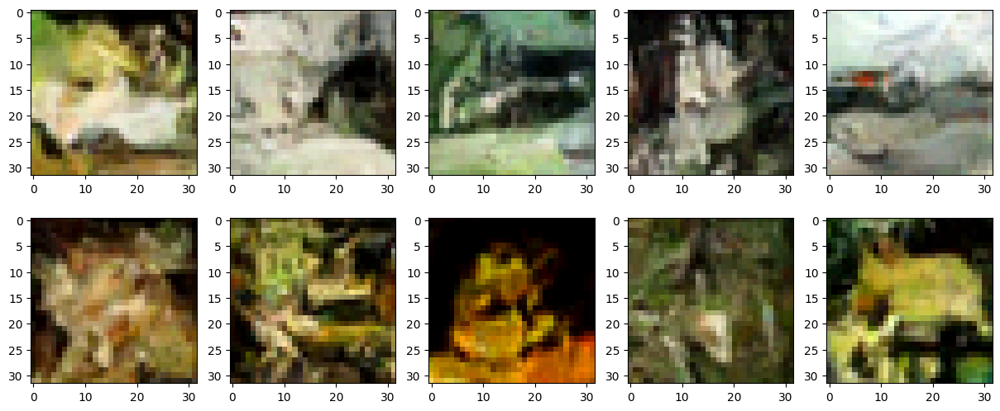

Epoch: 40


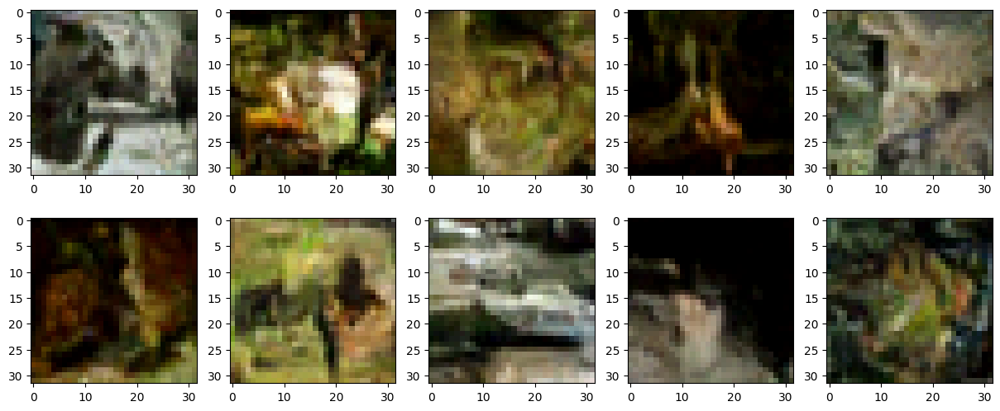

loss for epoch 40: 0.0327: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


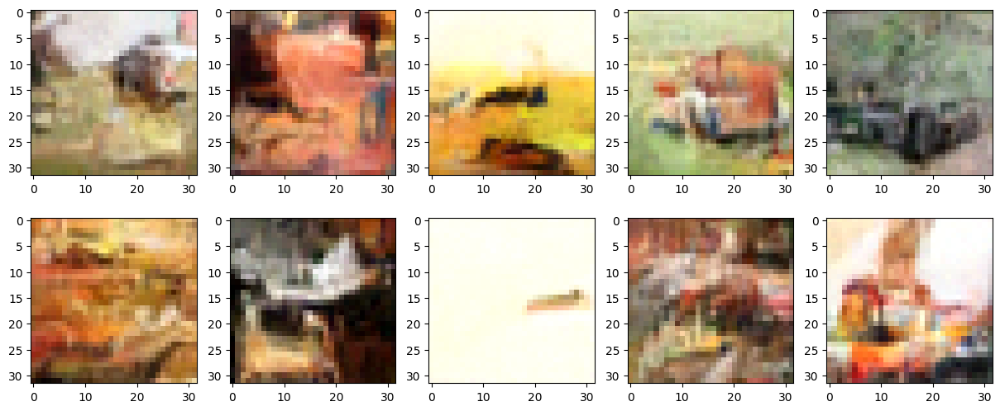

Epoch: 41


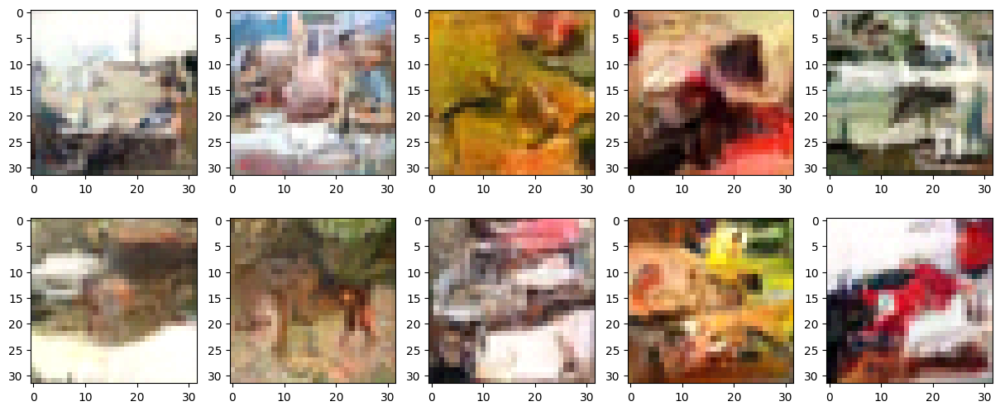

loss for epoch 41: 0.0325: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


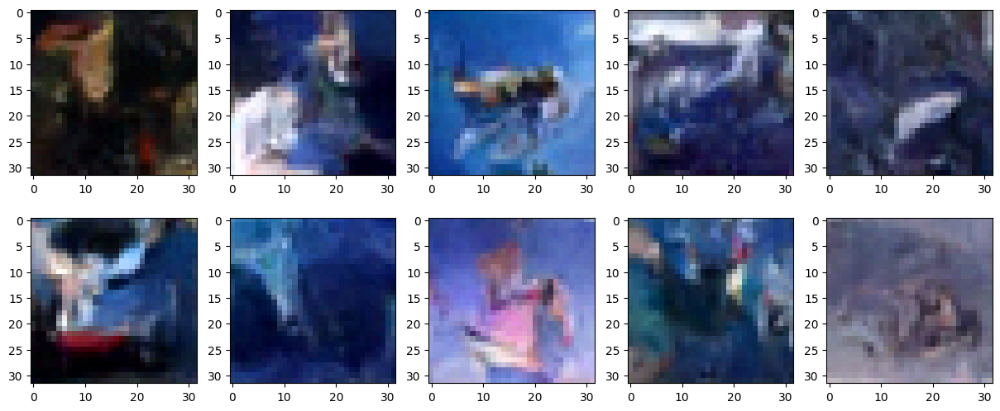

Epoch: 42


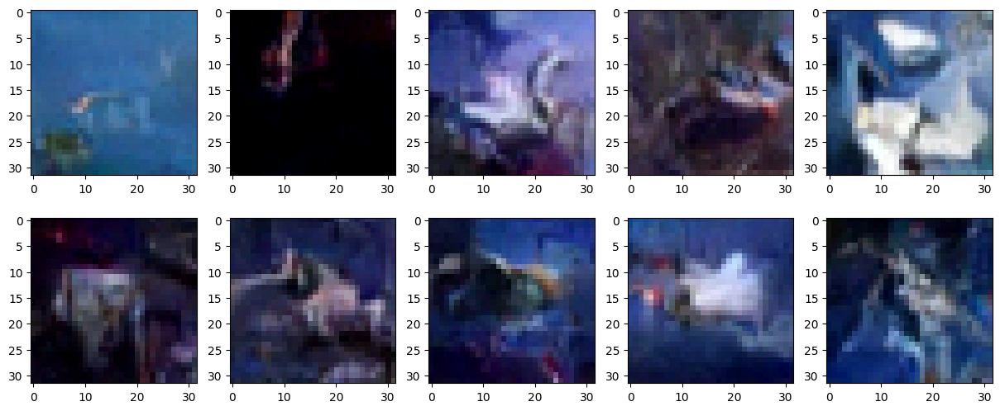

loss for epoch 42: 0.0321: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


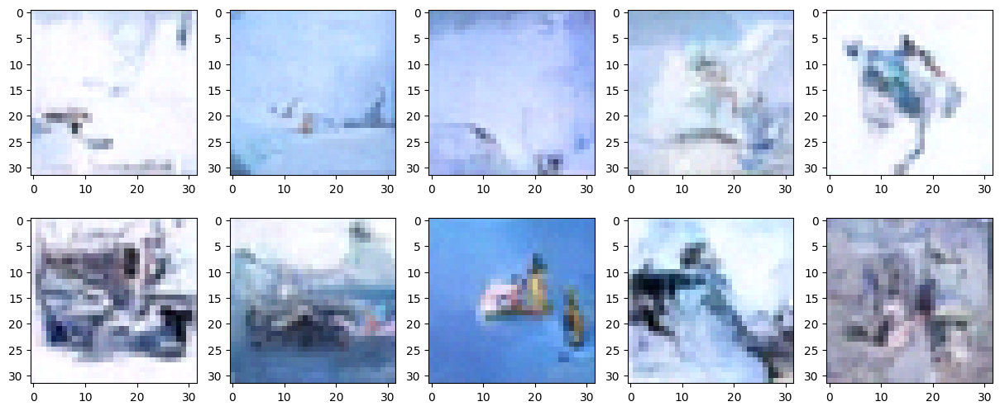

Epoch: 43


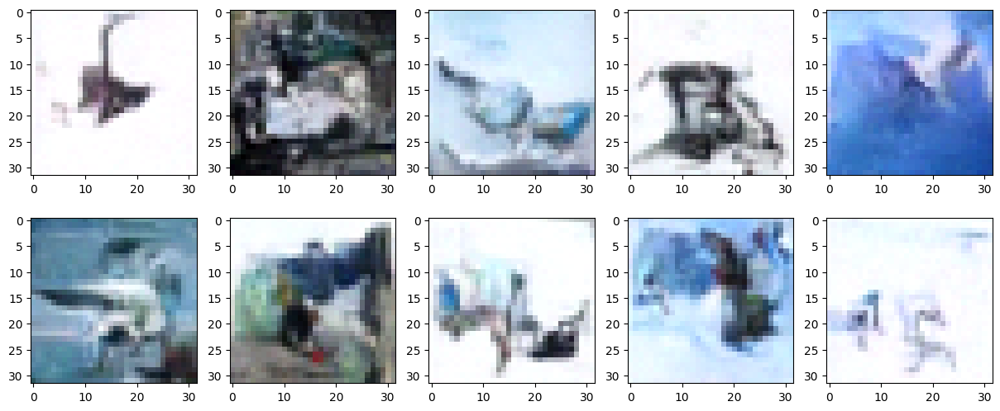

loss for epoch 43: 0.0322: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


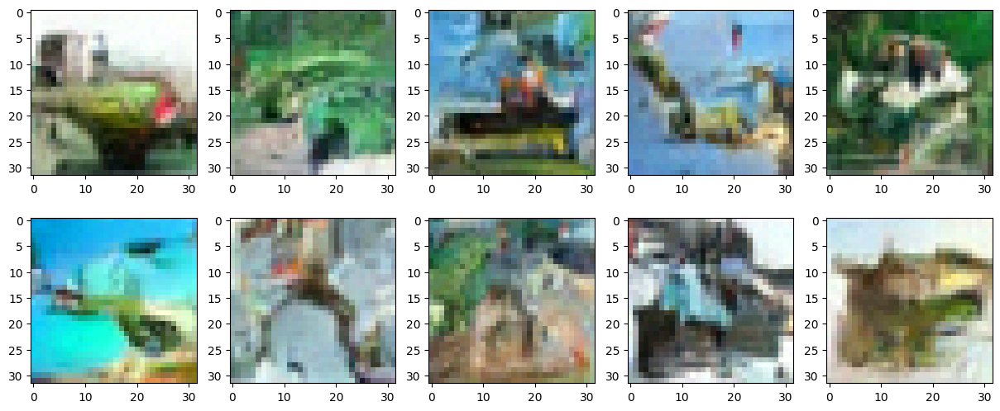

Epoch: 44


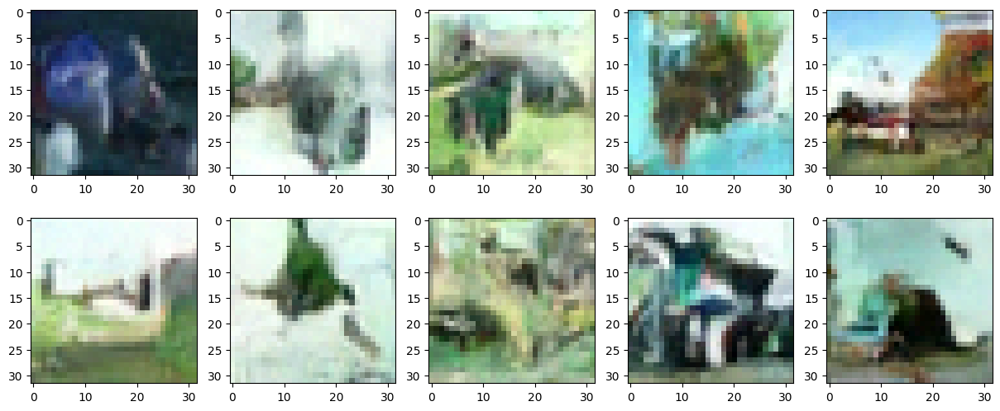

loss for epoch 44: 0.0319: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


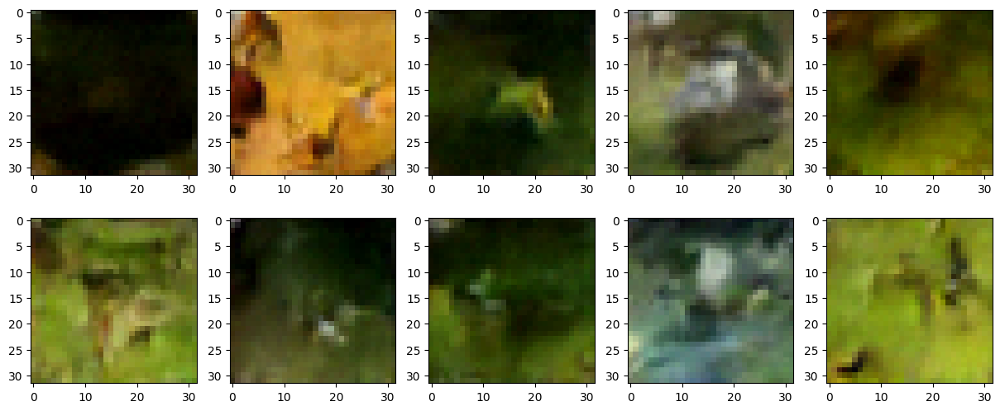

Epoch: 45


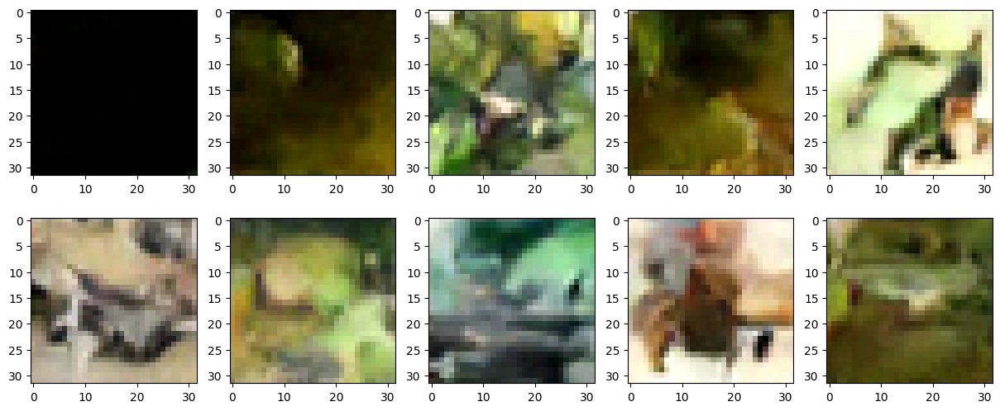

loss for epoch 45: 0.0321: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


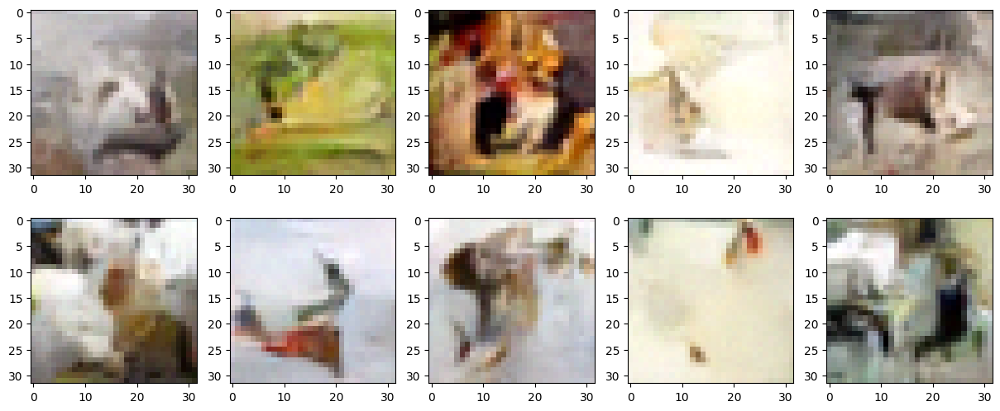

Epoch: 46


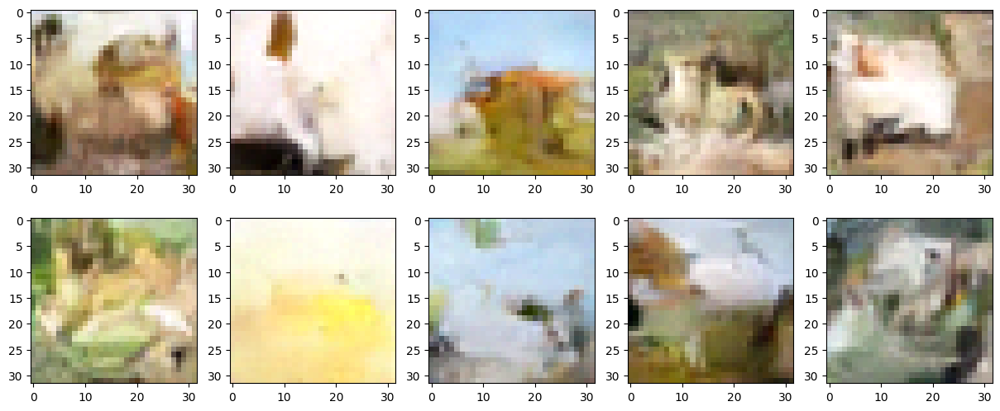

loss for epoch 46: 0.0316: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


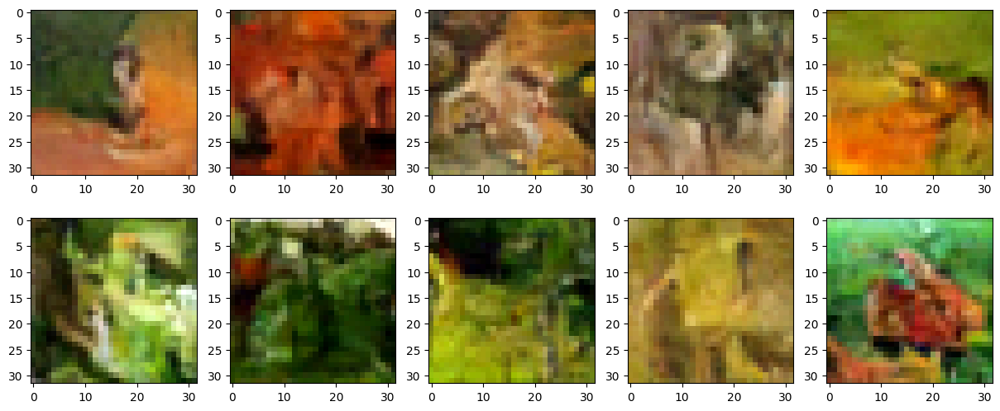

Epoch: 47


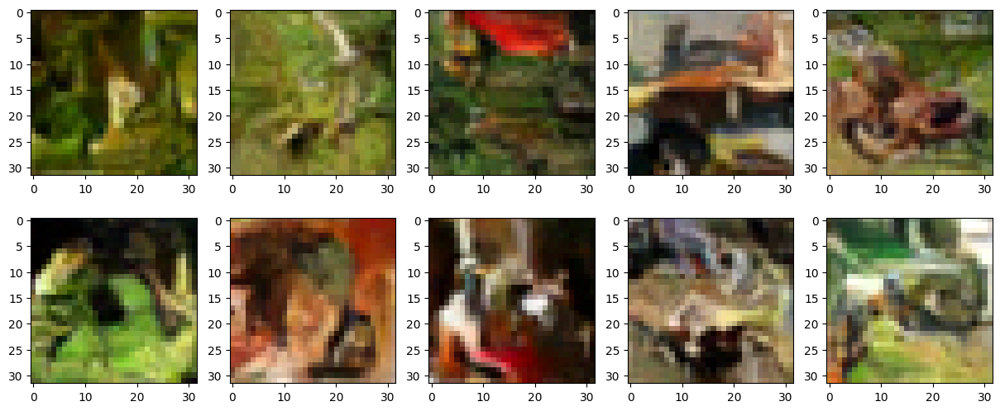

loss for epoch 47: 0.0315: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


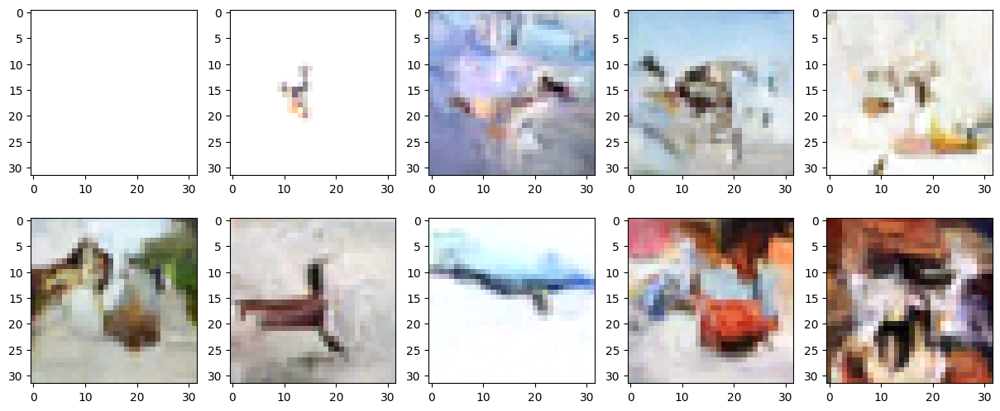

Epoch: 48


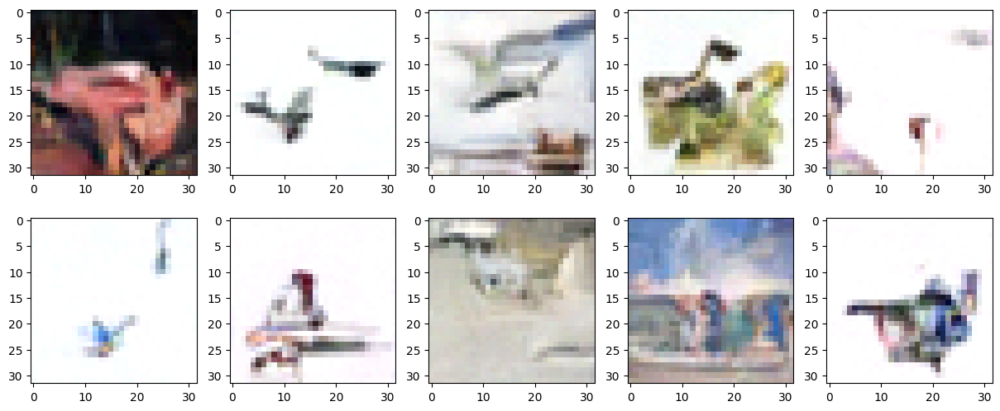

loss for epoch 48: 0.0319: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


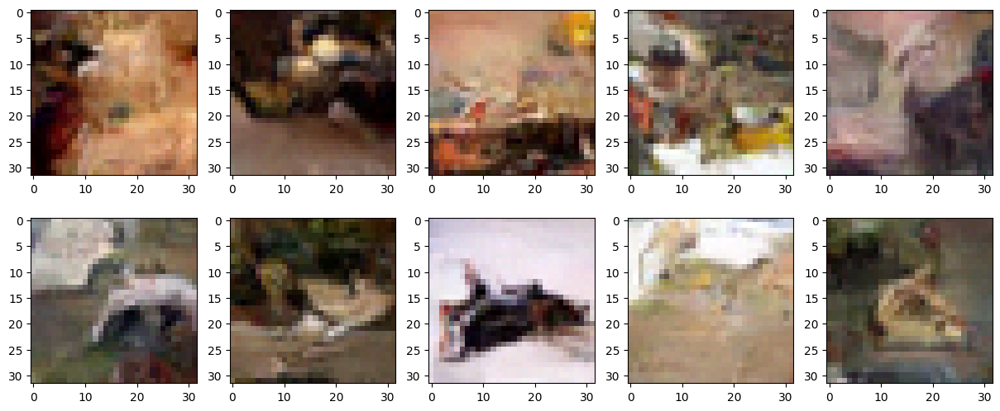

Epoch: 49


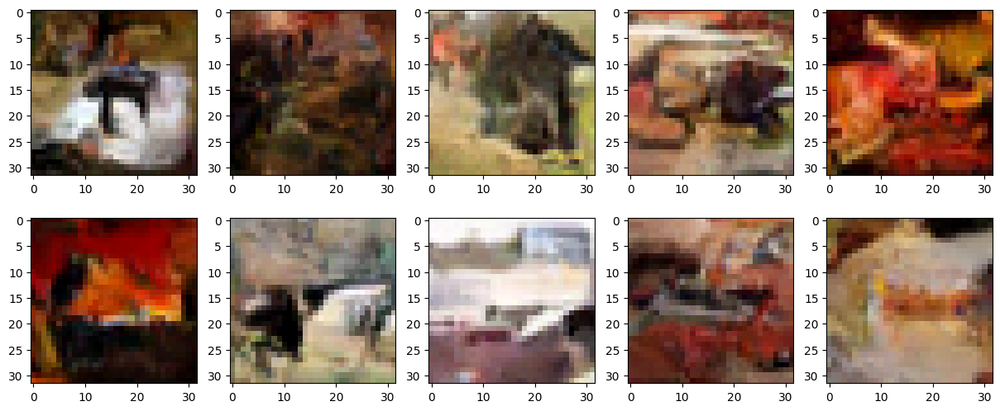

loss for epoch 49: 0.0320: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


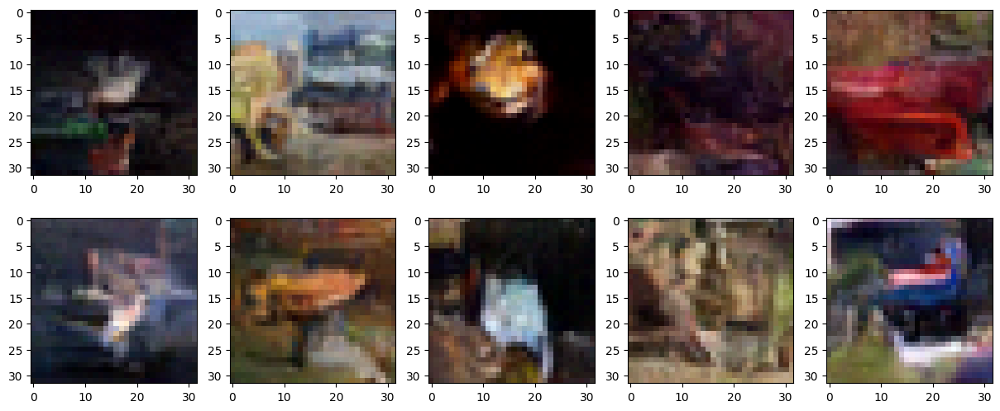

Epoch: 50


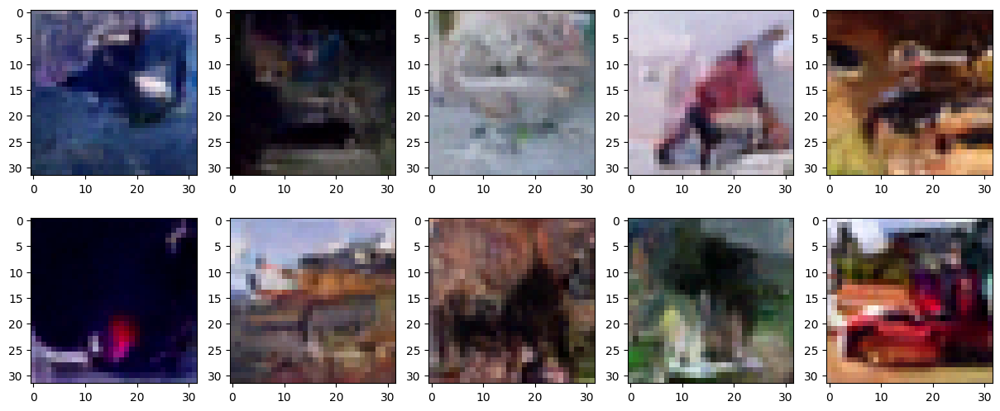

loss for epoch 50: 0.0320: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


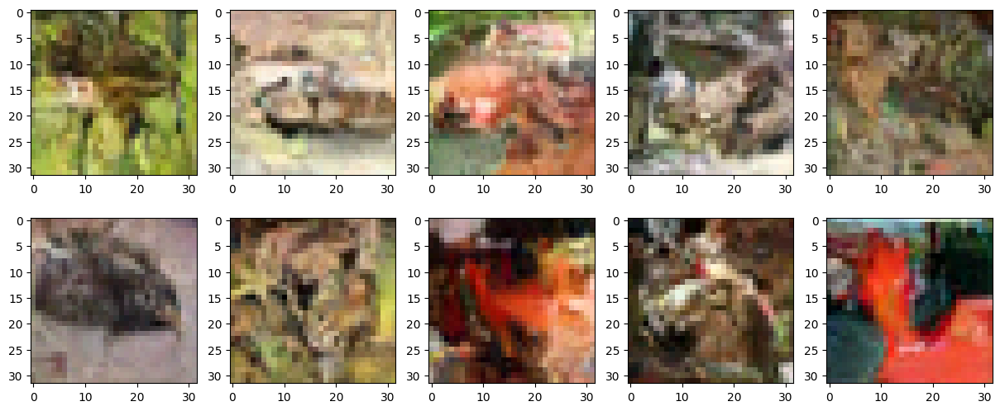

Epoch: 51


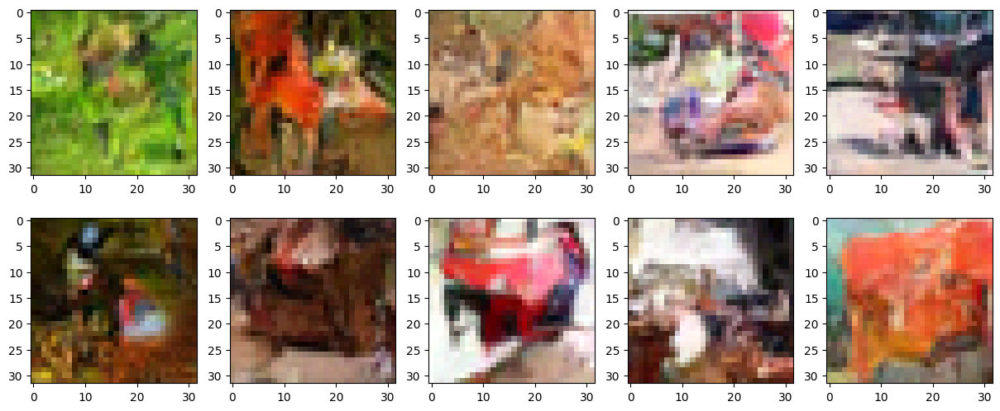

loss for epoch 51: 0.0321: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


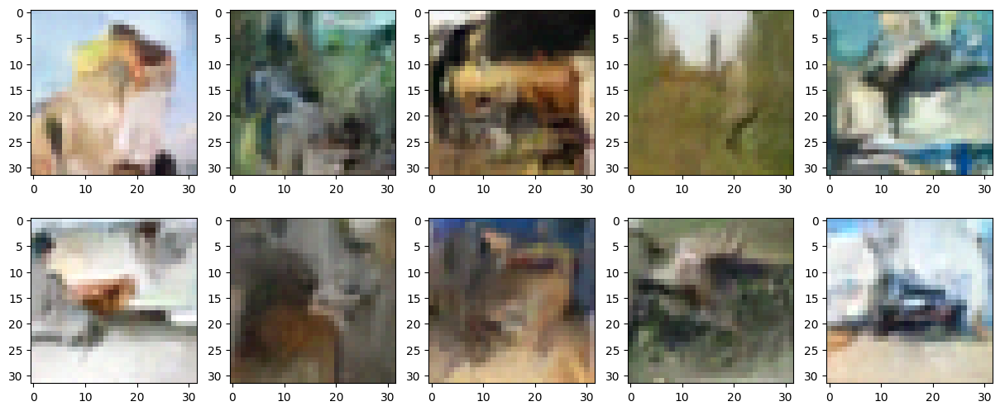

Epoch: 52


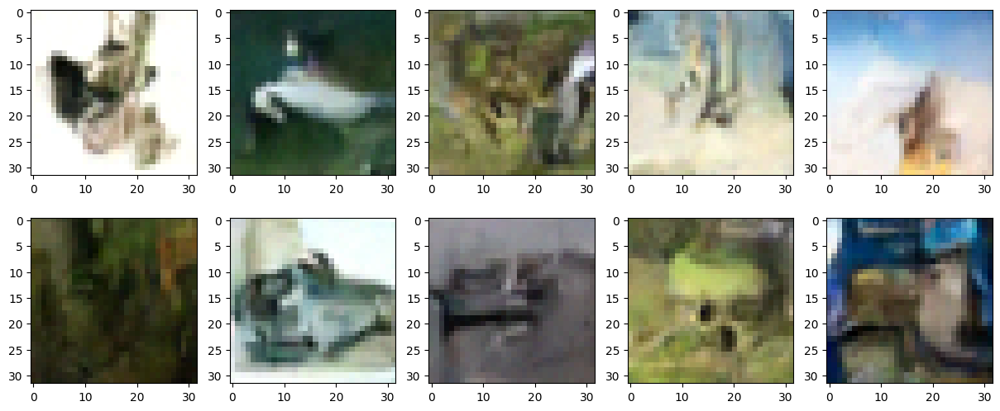

loss for epoch 52: 0.0314: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


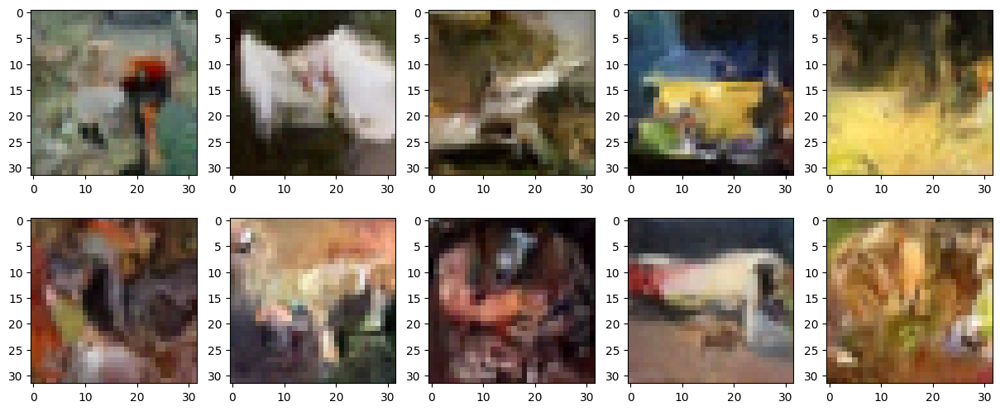

Epoch: 53


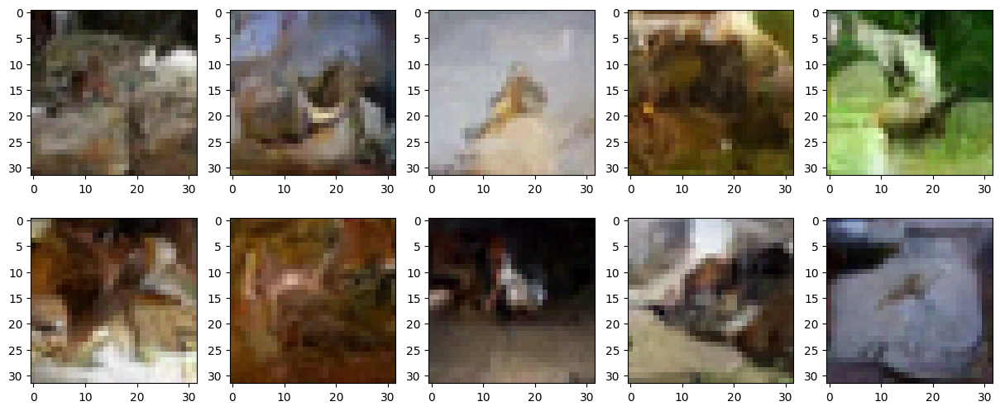

loss for epoch 53: 0.0318: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


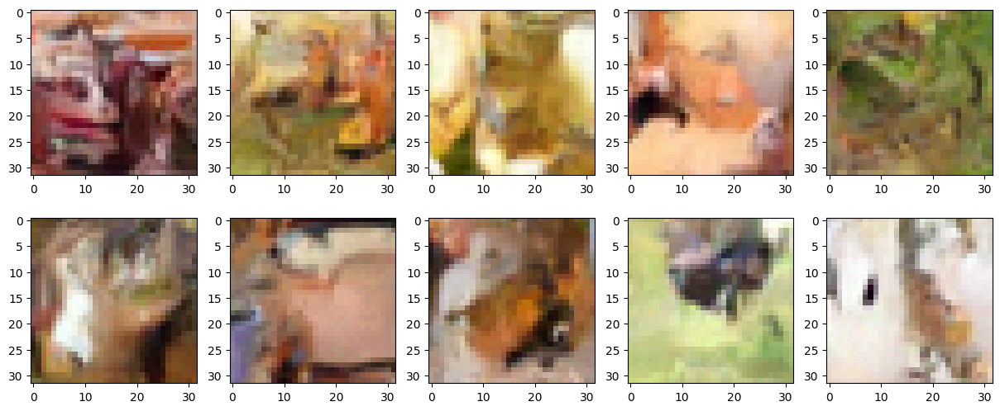

Epoch: 54


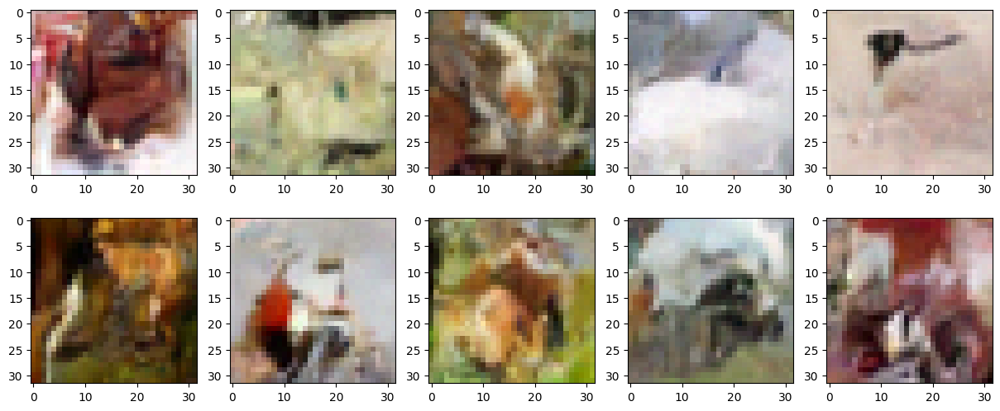

loss for epoch 54: 0.0315: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


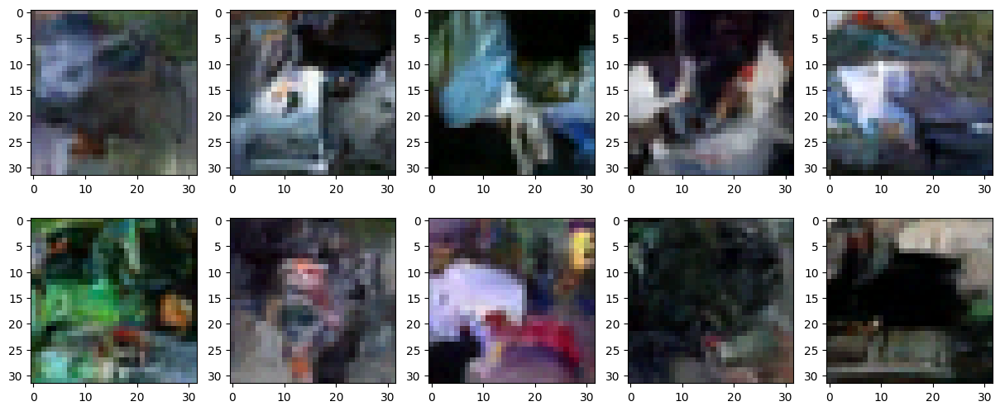

Epoch: 55


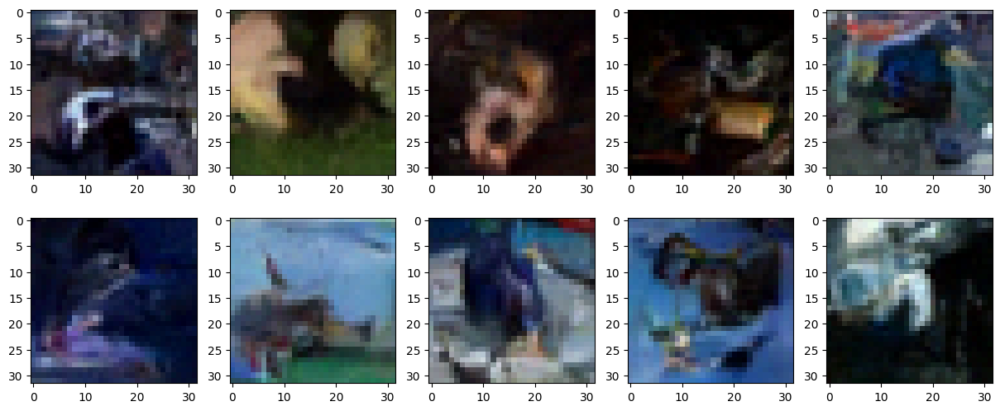

loss for epoch 55: 0.0315: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


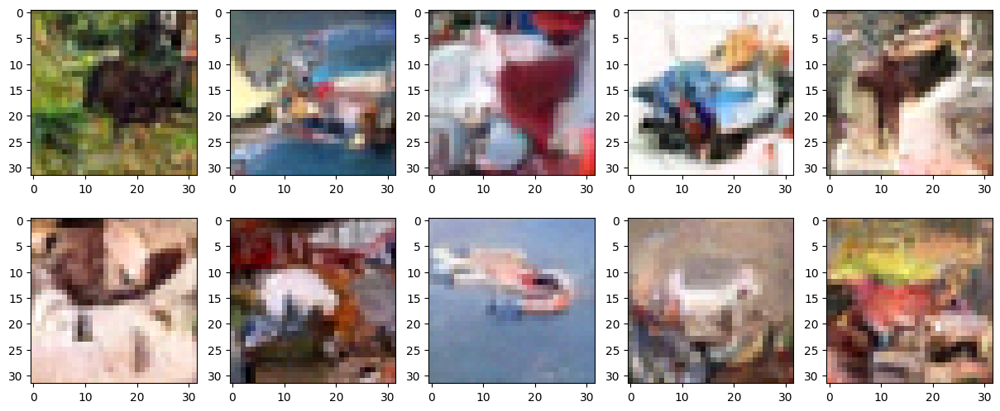

Epoch: 56


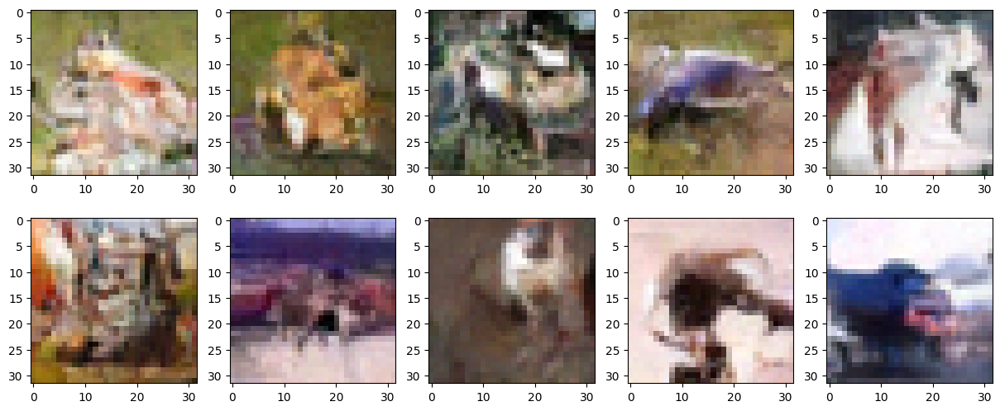

loss for epoch 56: 0.0322: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


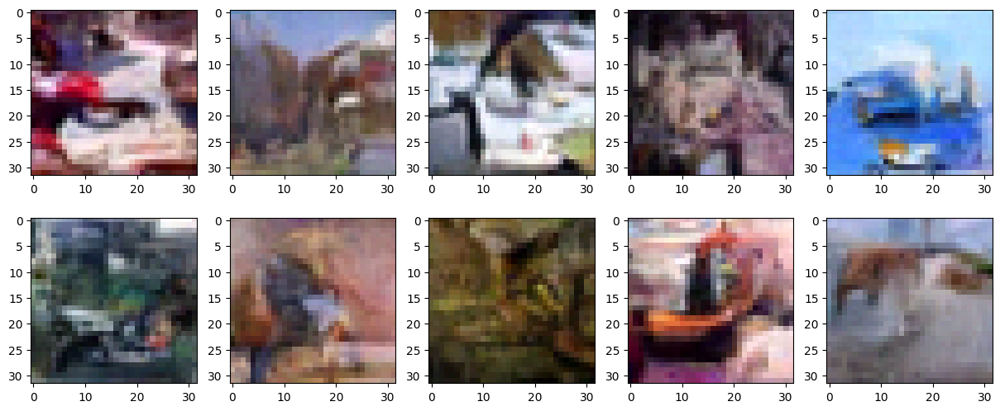

Epoch: 57


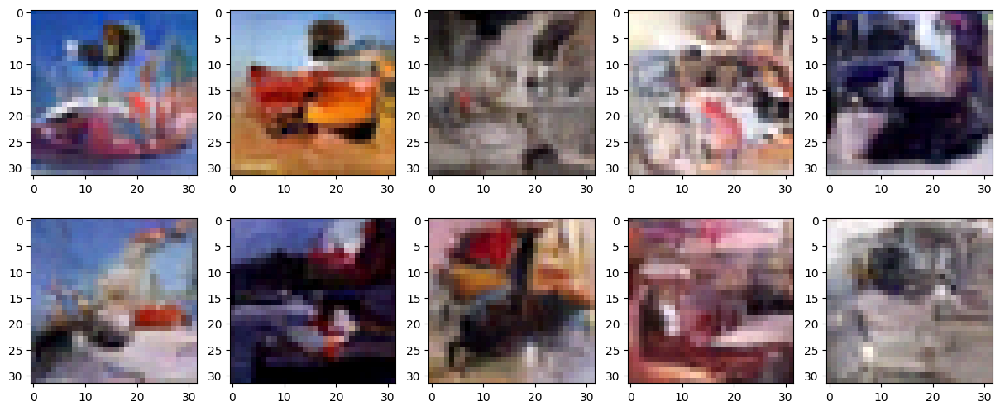

loss for epoch 57: 0.0312: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


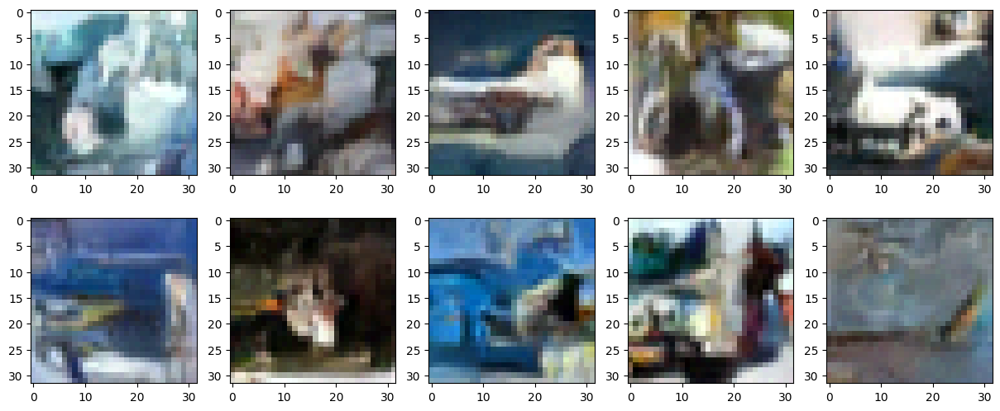

Epoch: 58


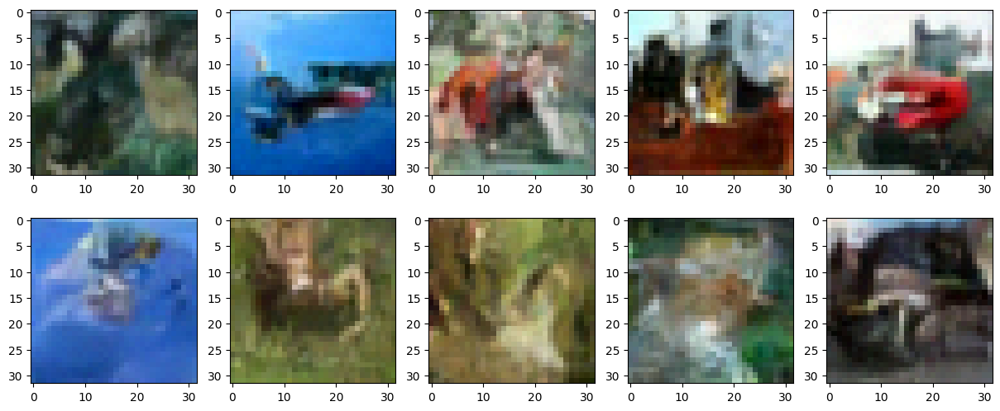

loss for epoch 58: 0.0312: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


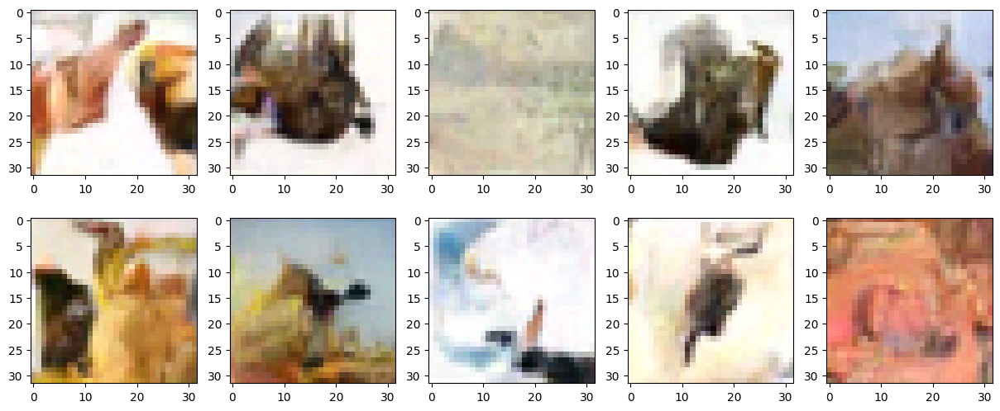

Epoch: 59


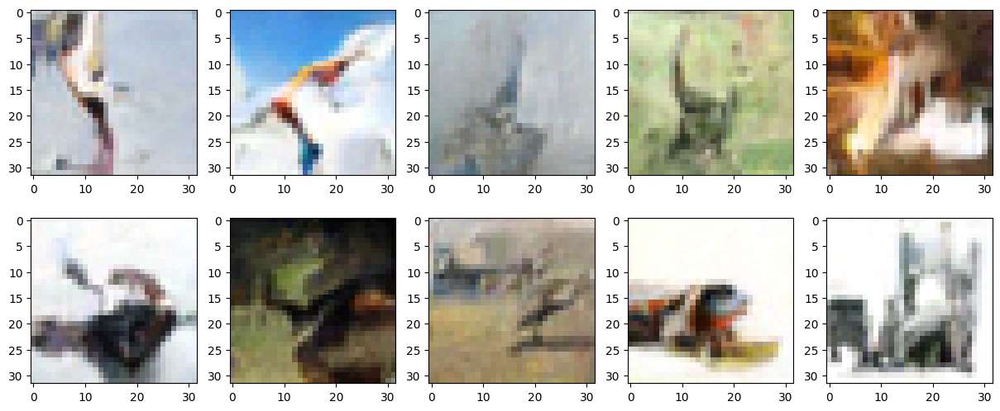

loss for epoch 59: 0.0314: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


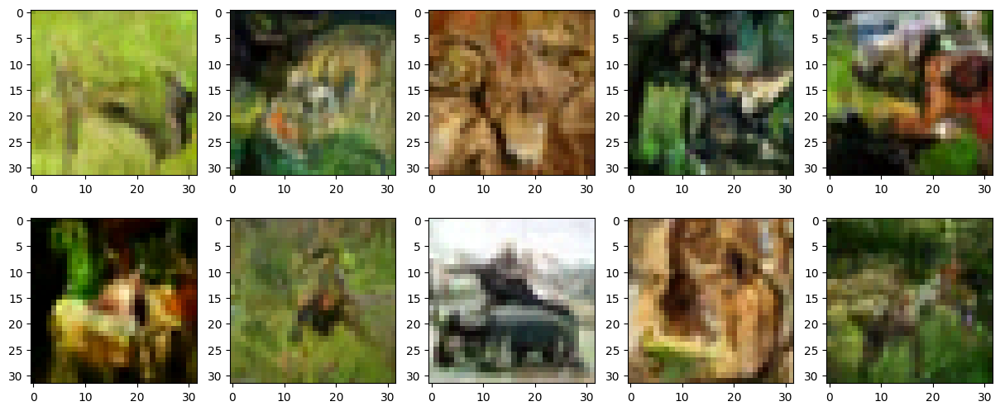

Epoch: 60


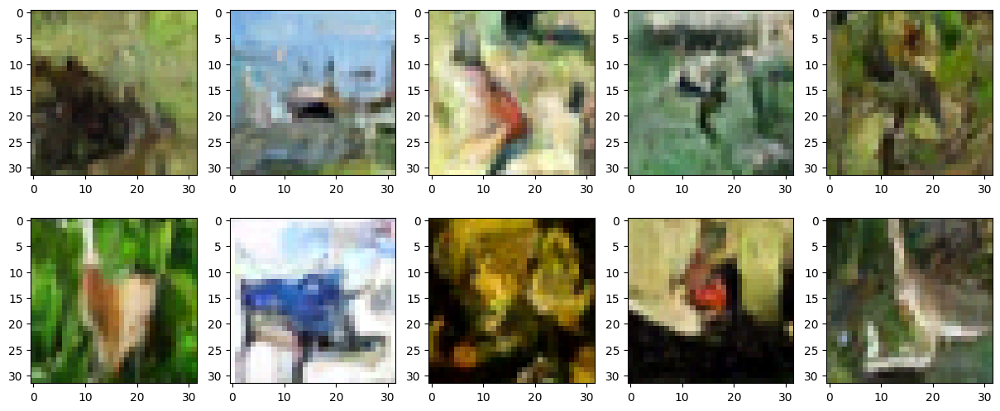

loss for epoch 60: 0.0317: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


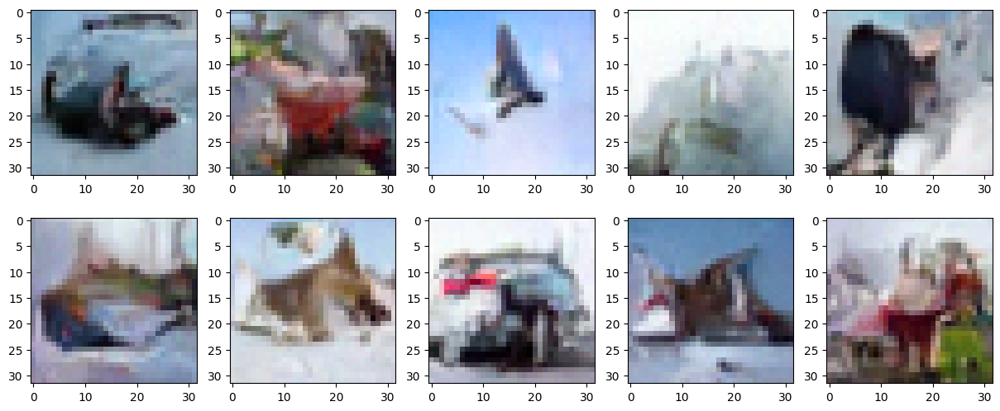

Epoch: 61


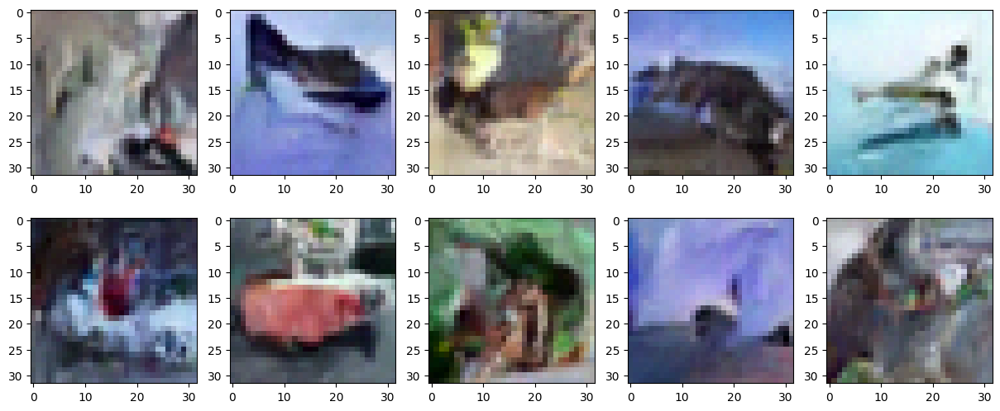

loss for epoch 61: 0.0307: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


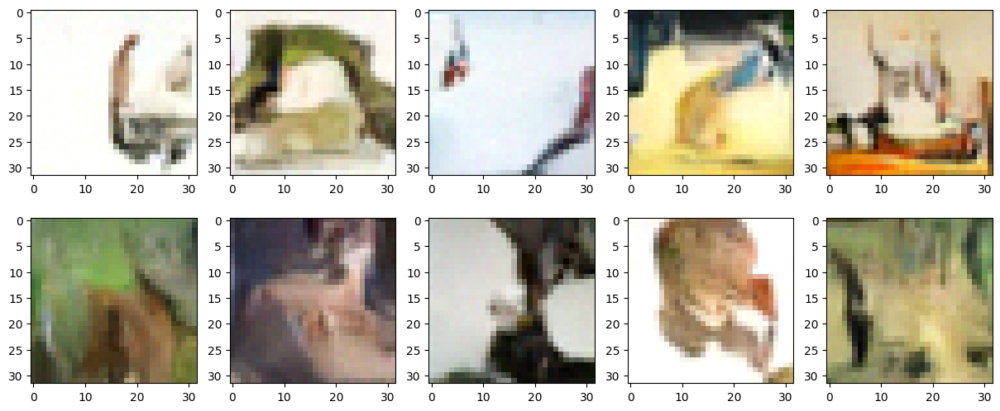

Epoch: 62


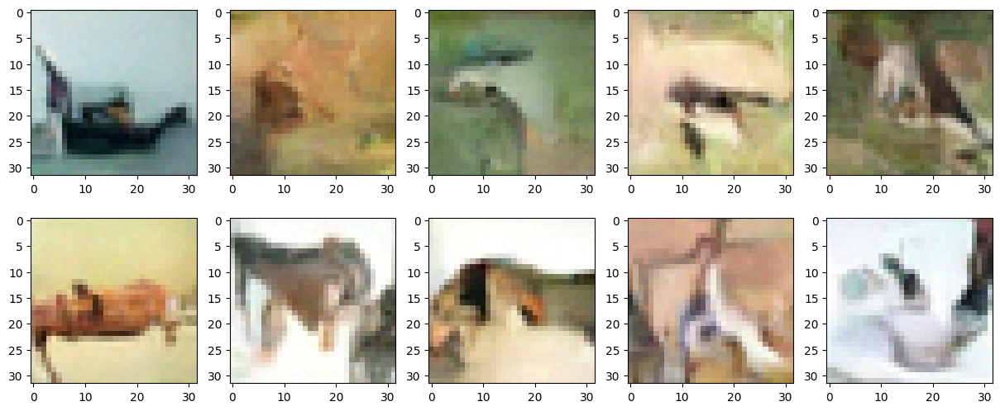

loss for epoch 62: 0.0314: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


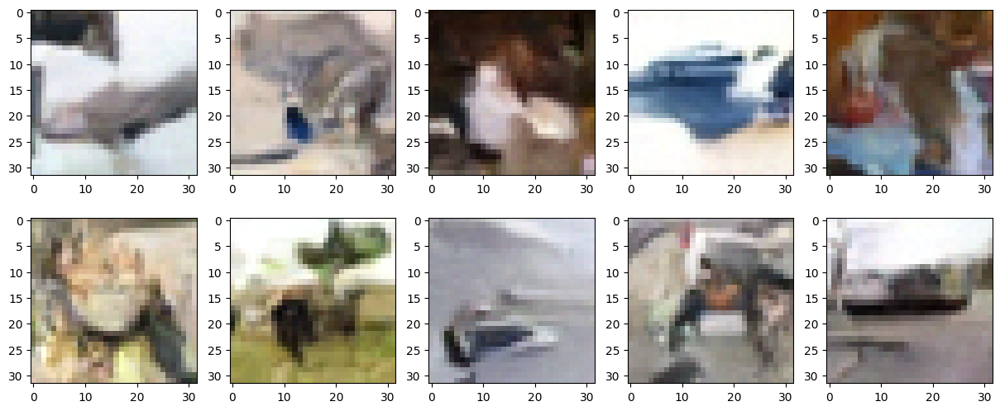

Epoch: 63


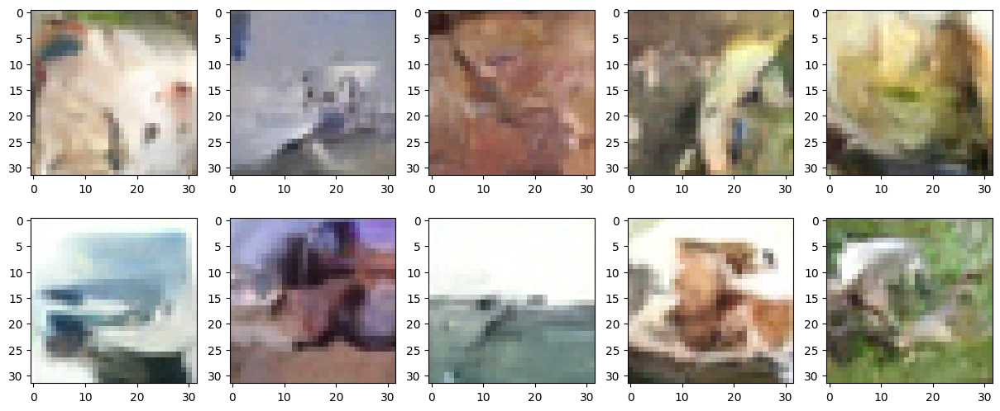

loss for epoch 63: 0.0316: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


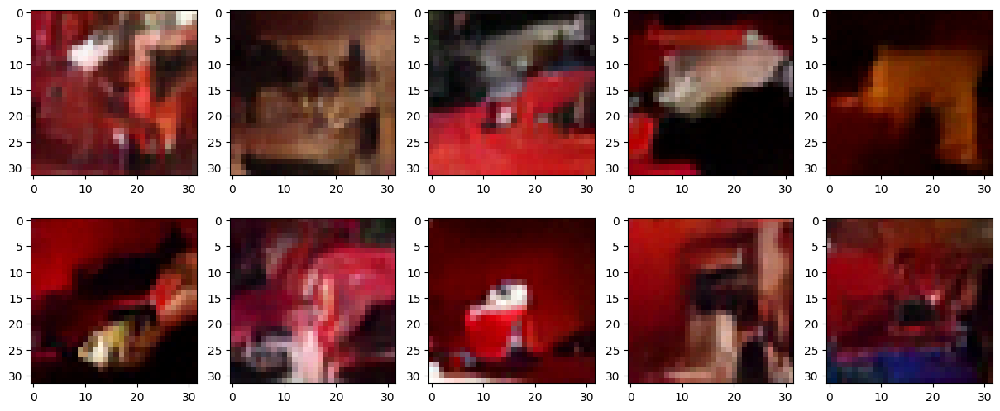

Epoch: 64


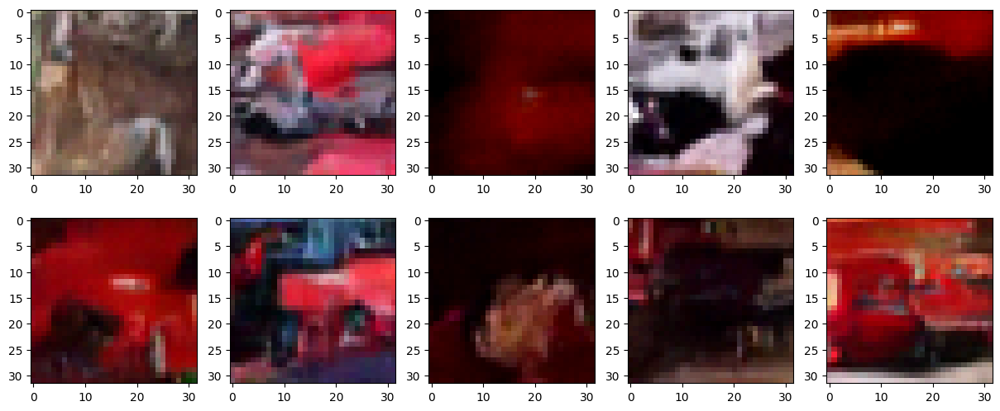

loss for epoch 64: 0.0313: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


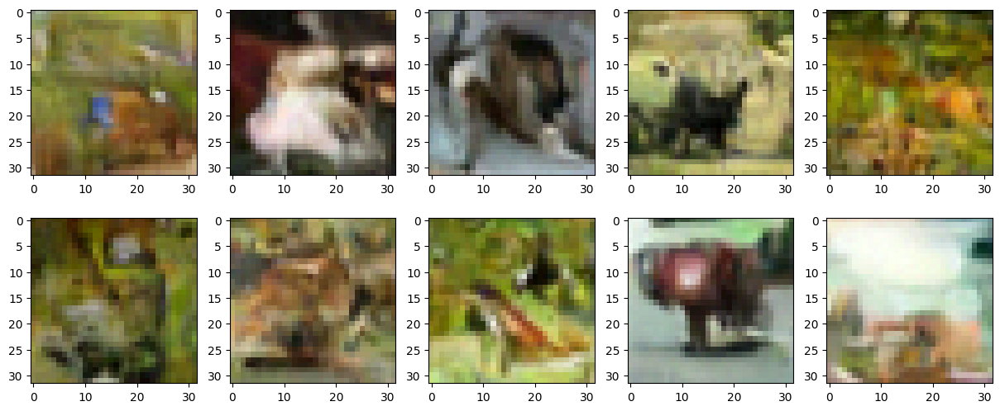

Epoch: 65


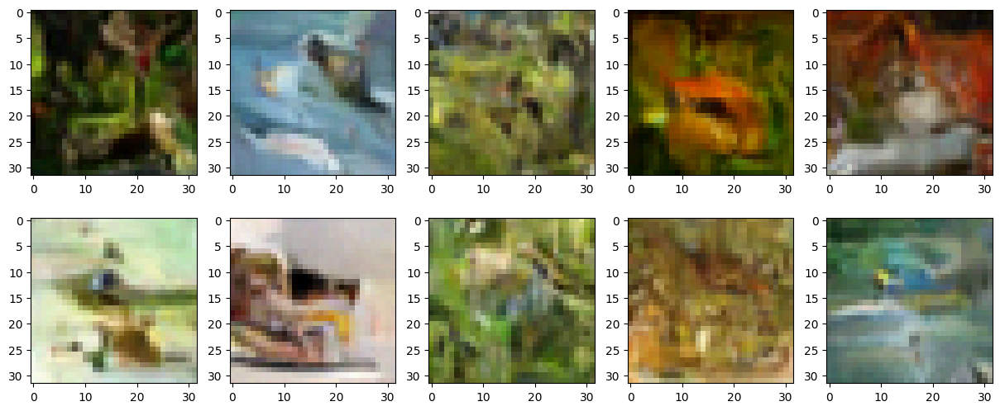

loss for epoch 65: 0.0310: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


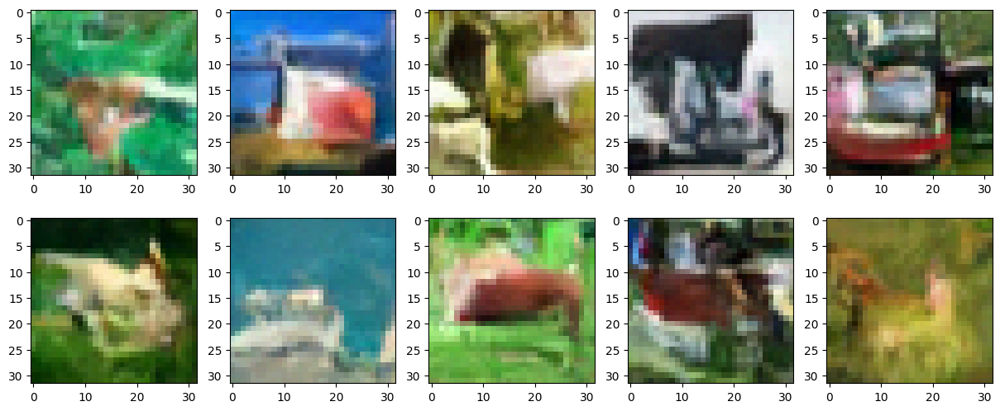

Epoch: 66


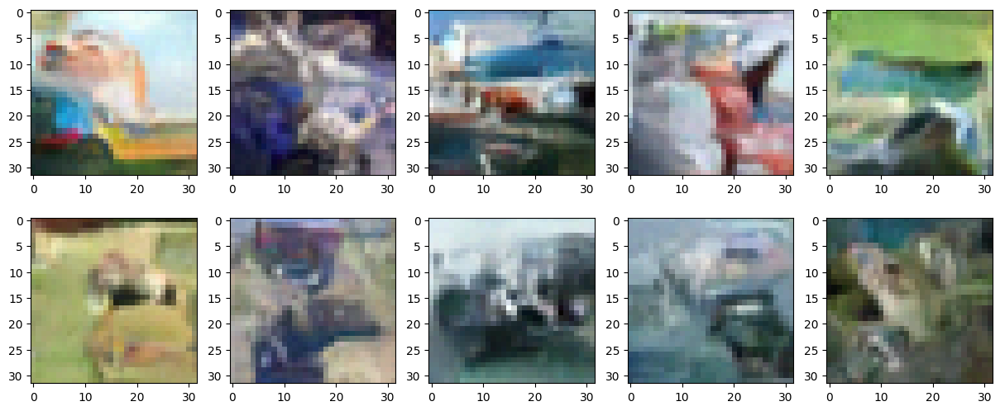

loss for epoch 66: 0.0319: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


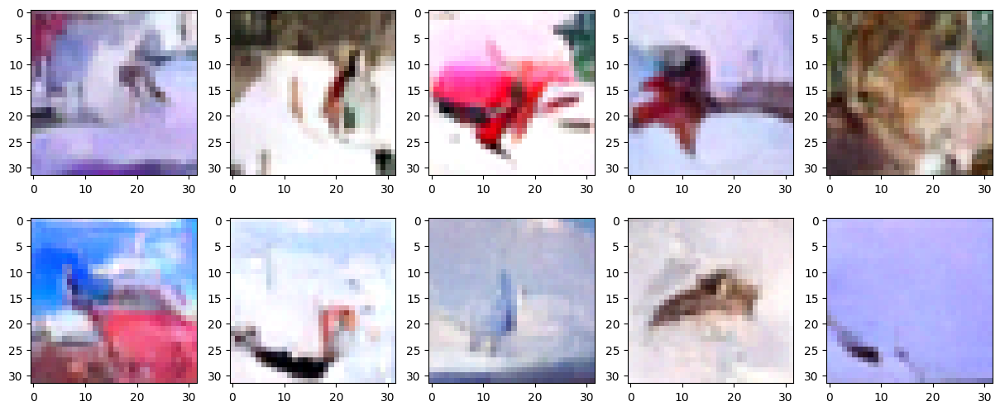

Epoch: 67


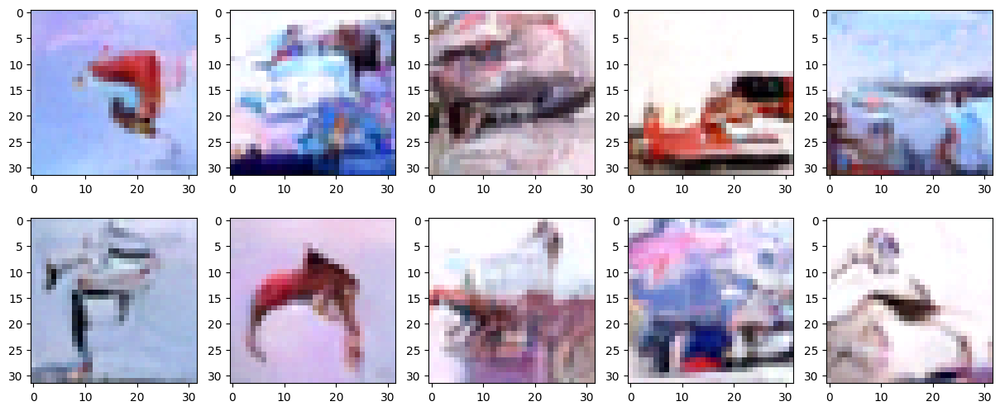

loss for epoch 67: 0.0313: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


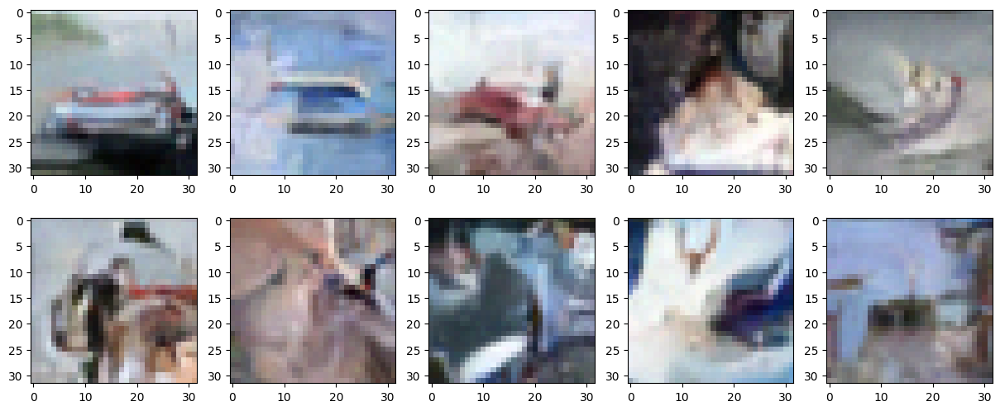

Epoch: 68


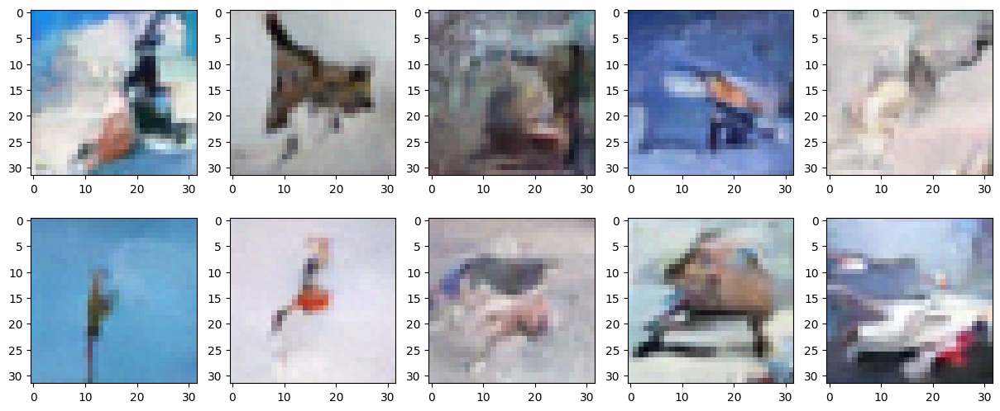

loss for epoch 68: 0.0309: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


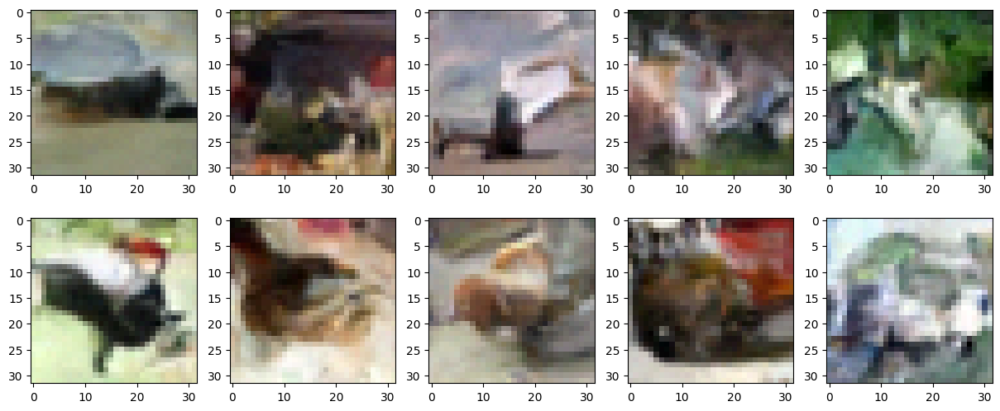

Epoch: 69


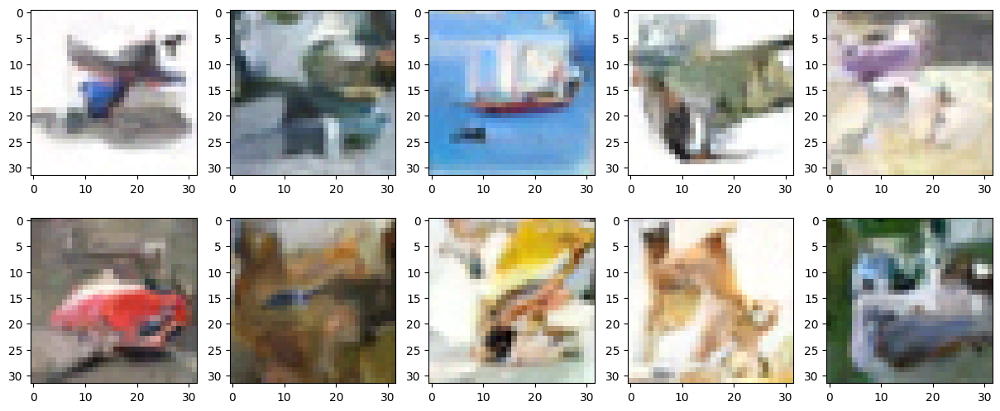

loss for epoch 69: 0.0312: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


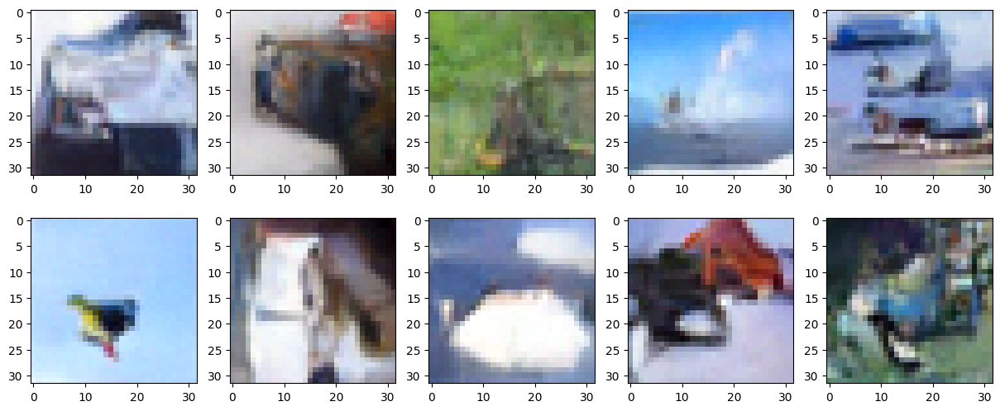

Epoch: 70


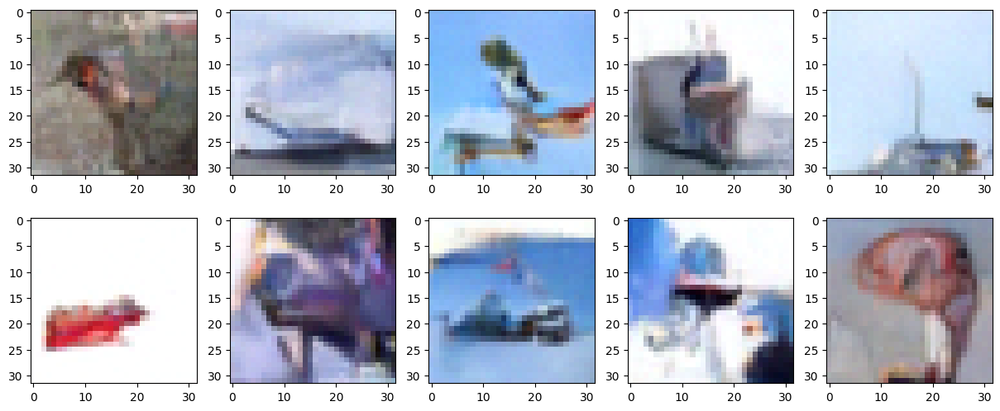

loss for epoch 70: 0.0317: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


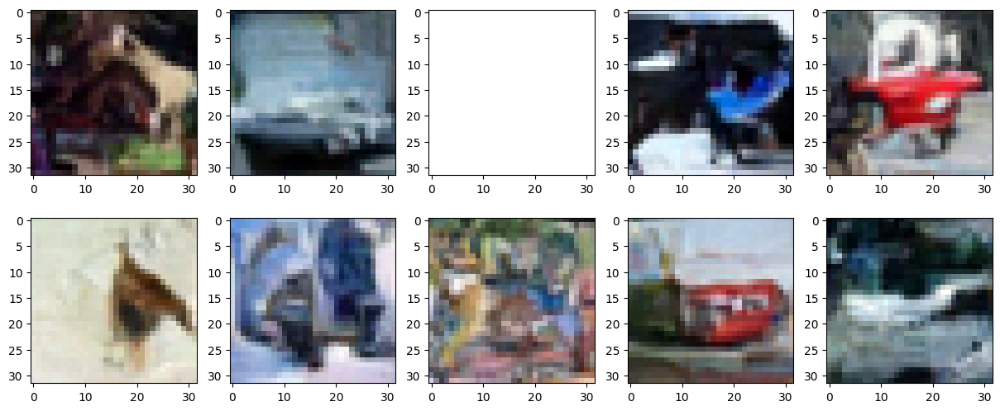

Epoch: 71


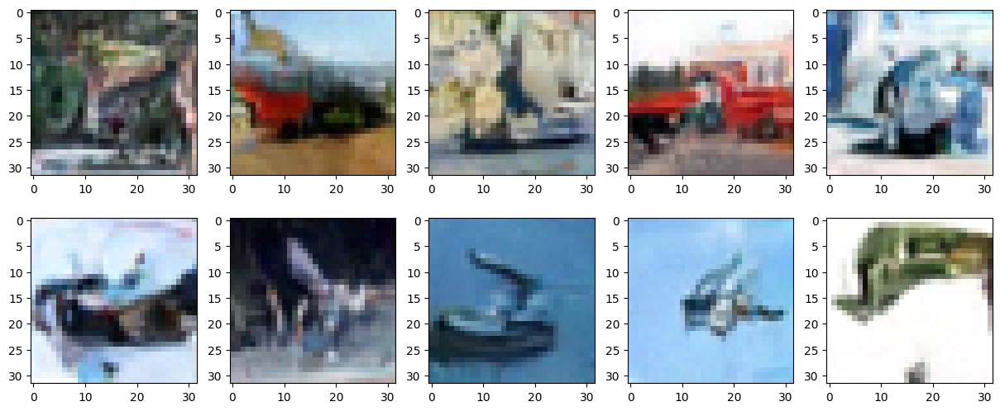

loss for epoch 71: 0.0315: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


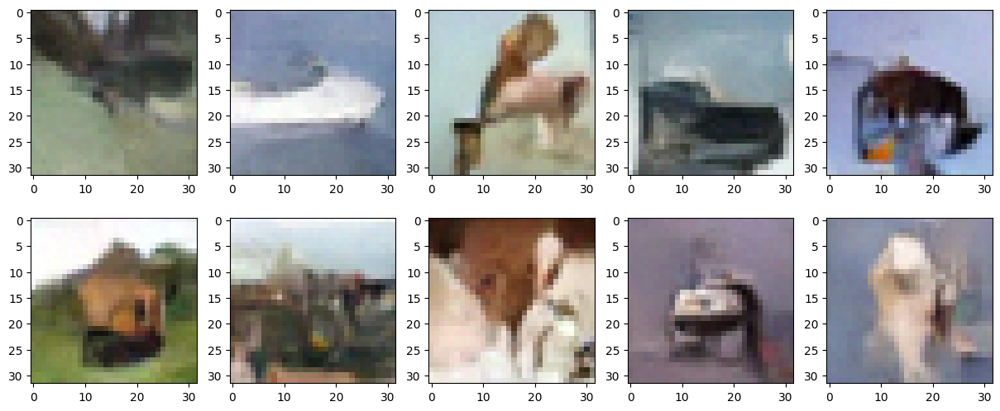

Epoch: 72


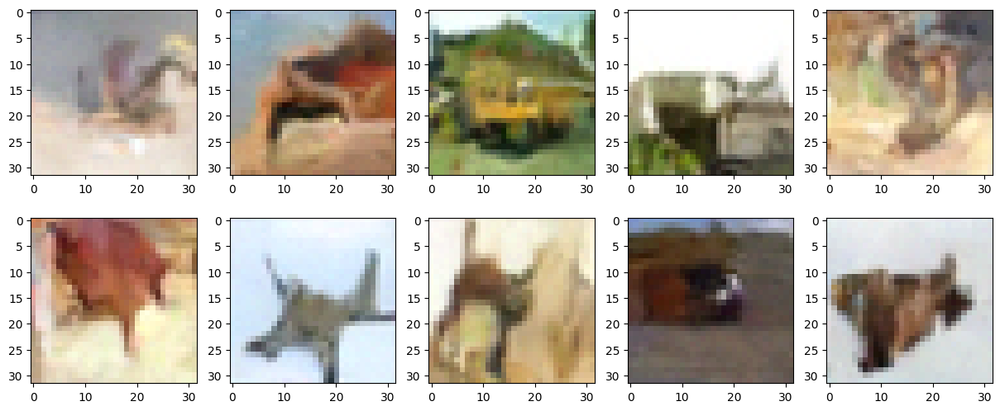

loss for epoch 72: 0.0311: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


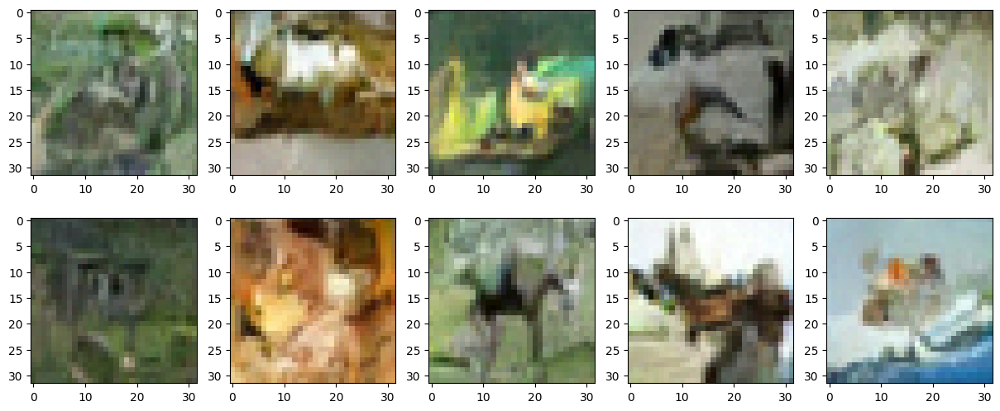

Epoch: 73


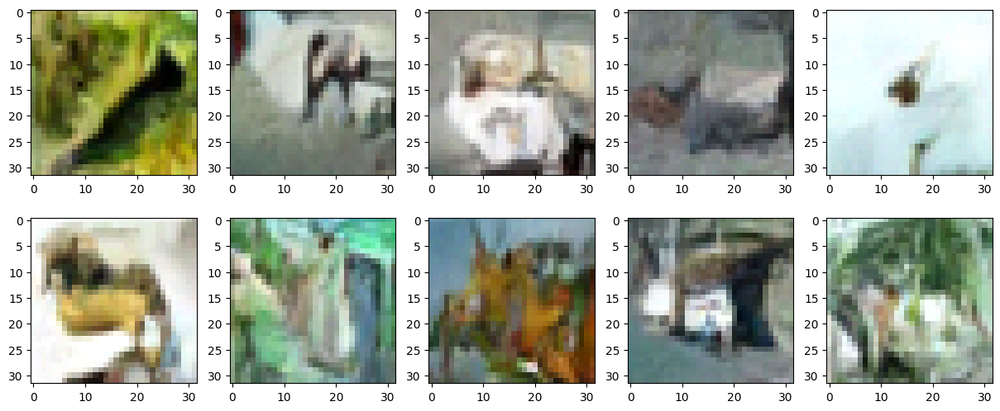

loss for epoch 73: 0.0317: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


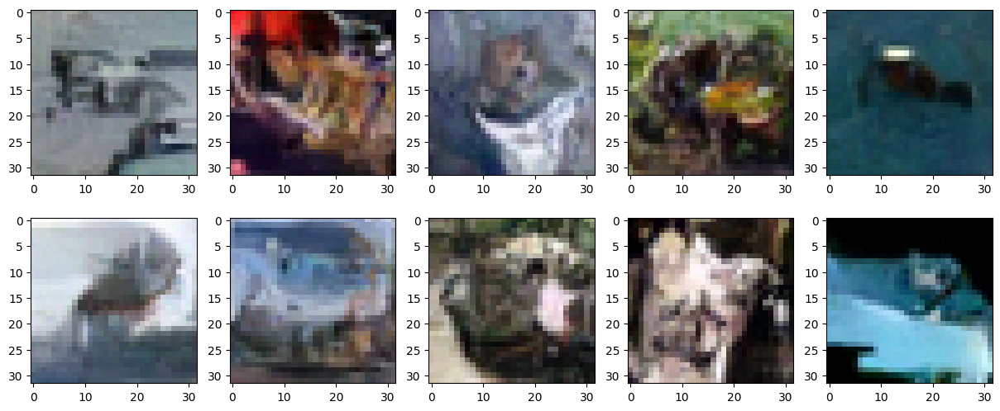

Epoch: 74


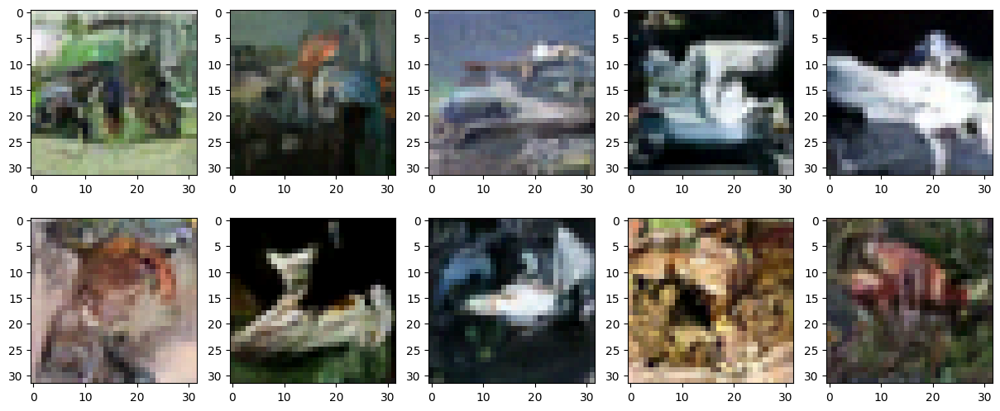

loss for epoch 74: 0.0310: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


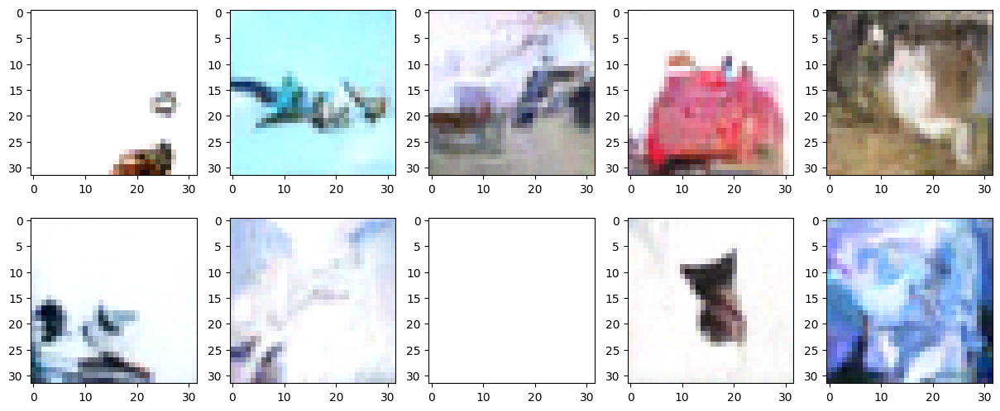

Epoch: 75


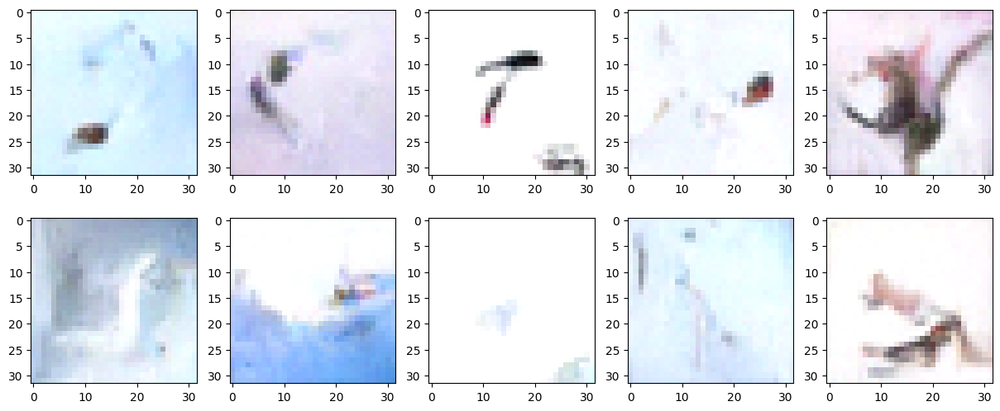

loss for epoch 75: 0.0311: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


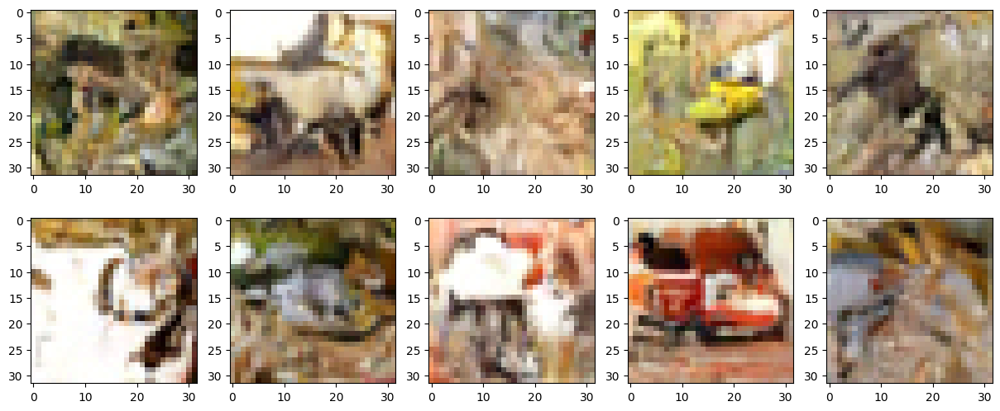

Epoch: 76


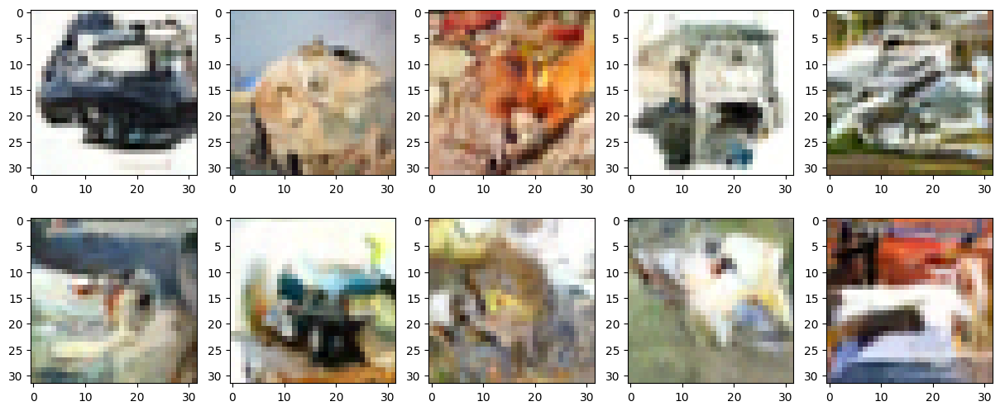

loss for epoch 76: 0.0314: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


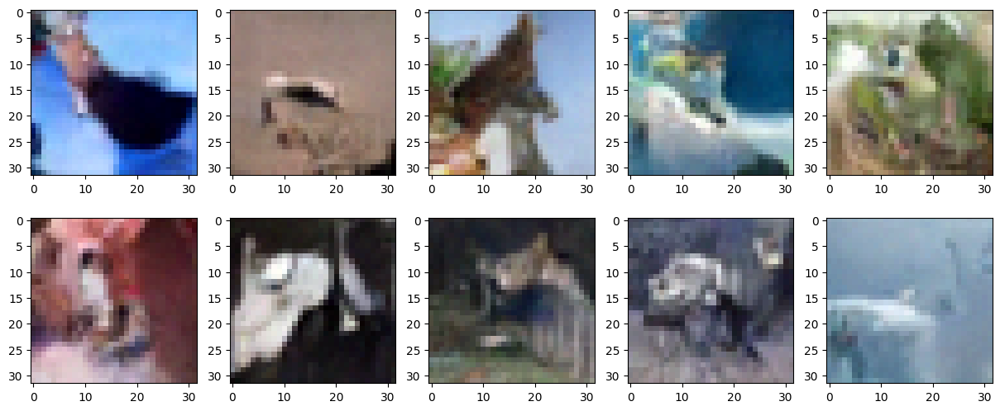

Epoch: 77


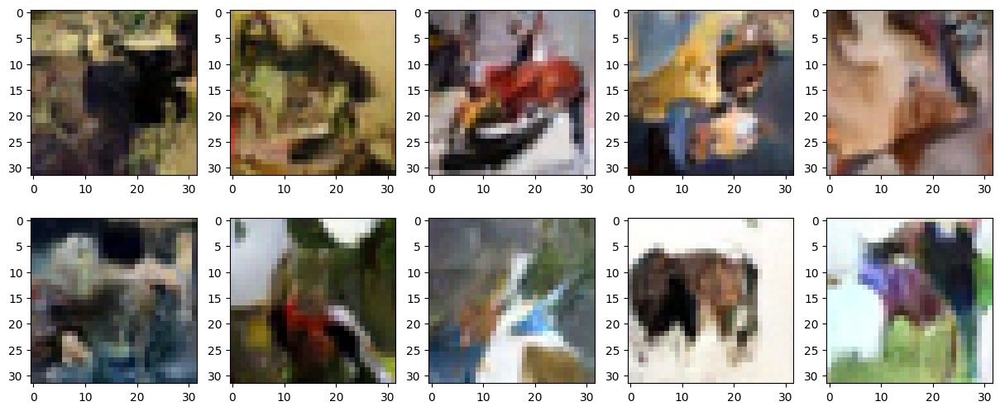

loss for epoch 77: 0.0315: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


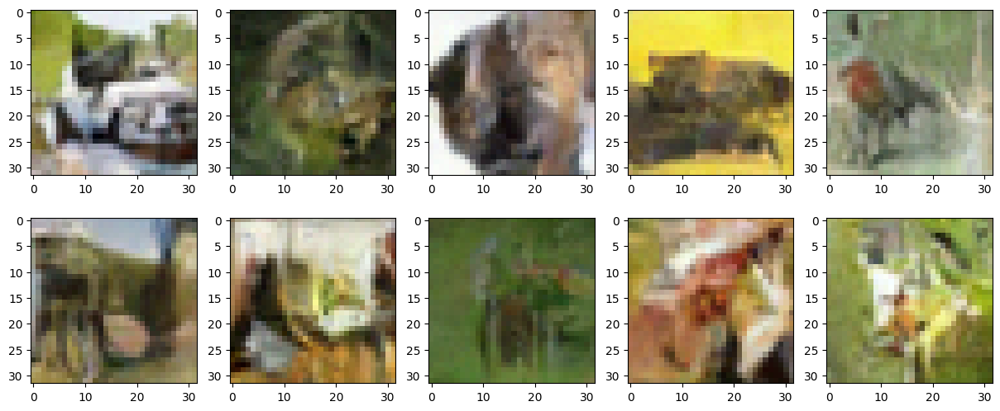

Epoch: 78


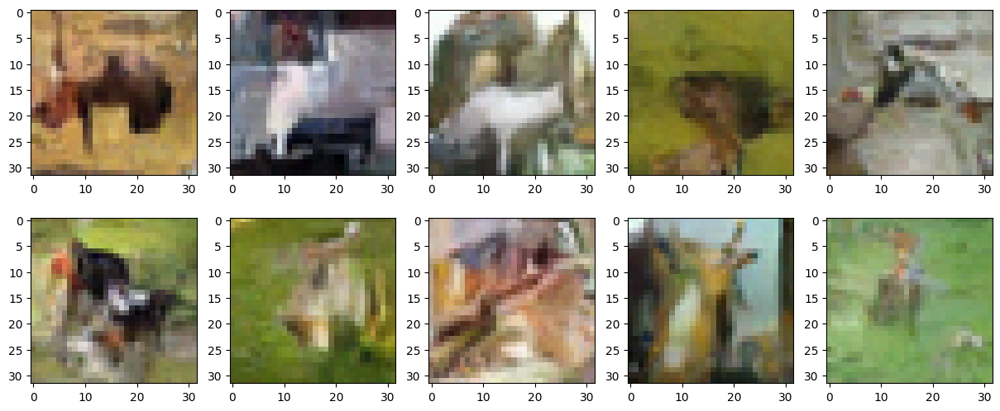

loss for epoch 78: 0.0312: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


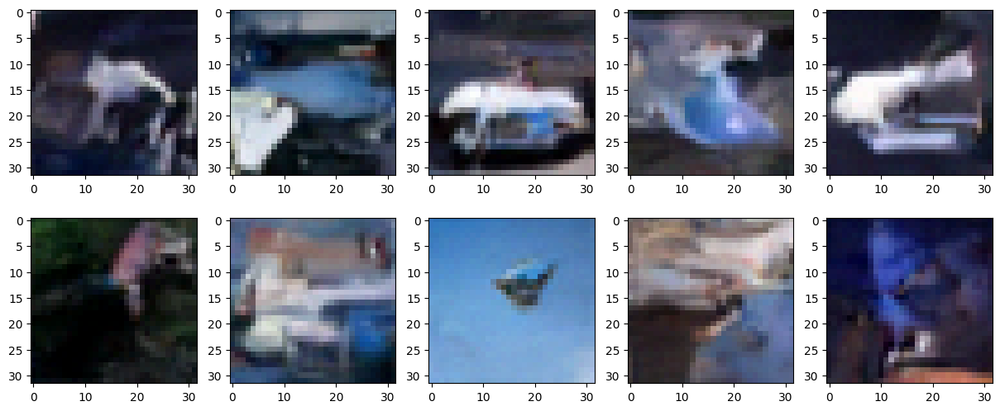

Epoch: 79


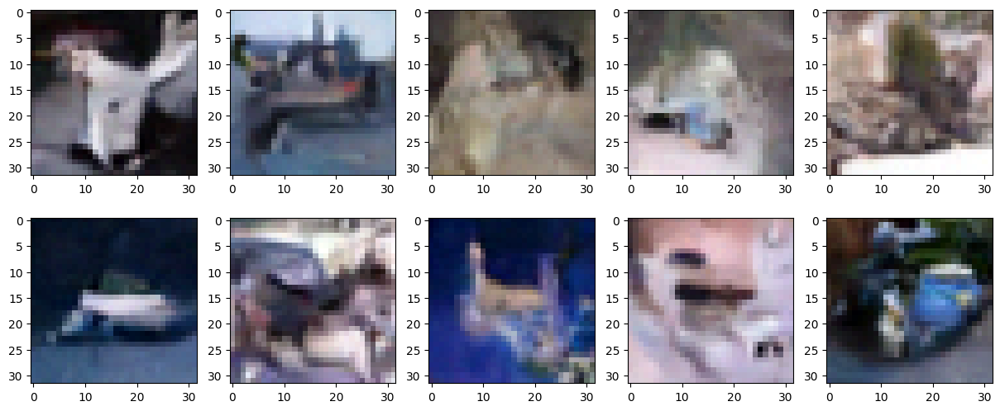

loss for epoch 79: 0.0311: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


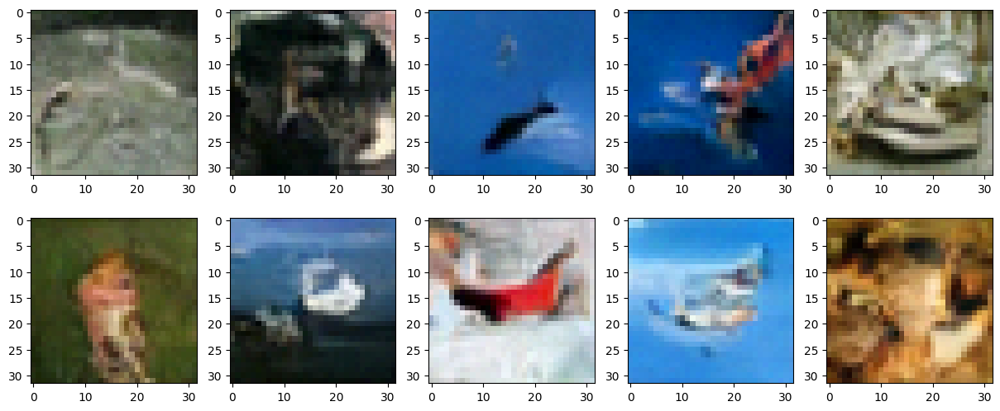

Epoch: 80


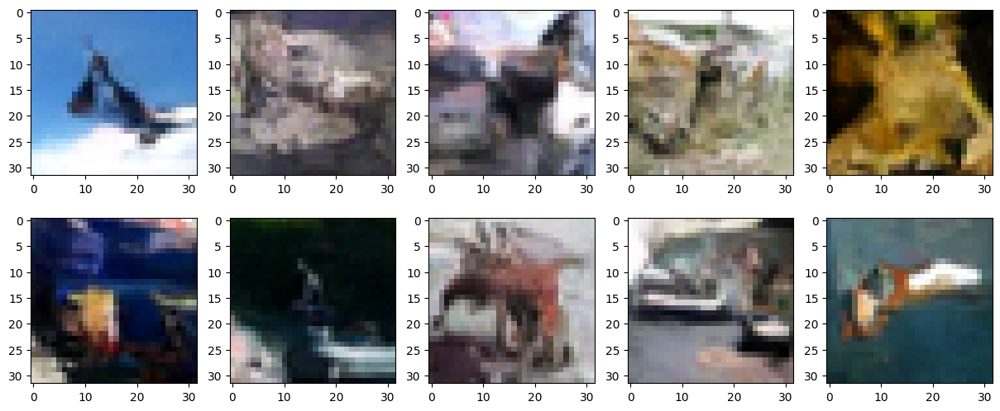

loss for epoch 80: 0.0317: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


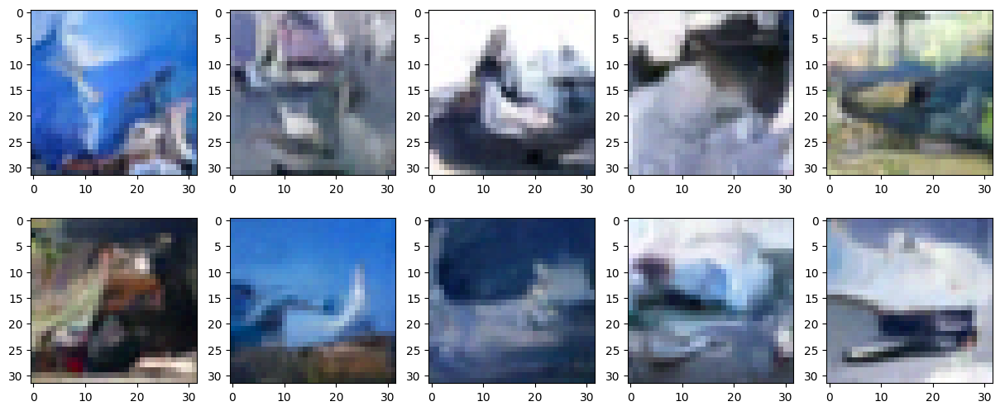

Epoch: 81


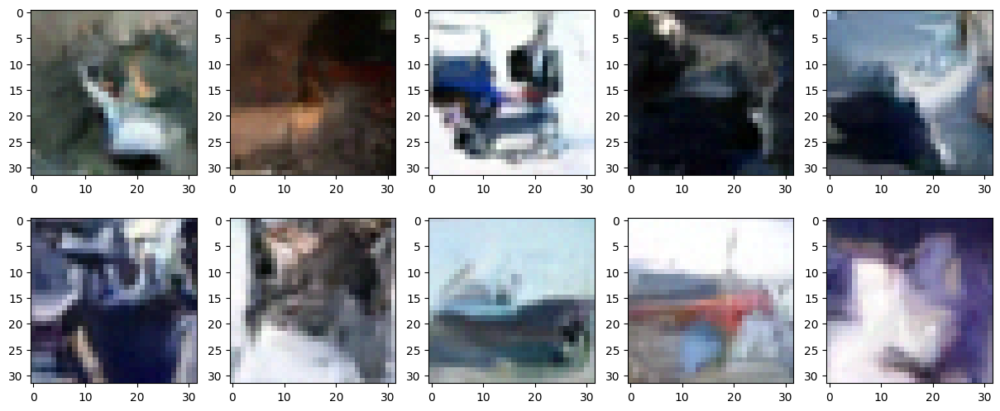

loss for epoch 81: 0.0311: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


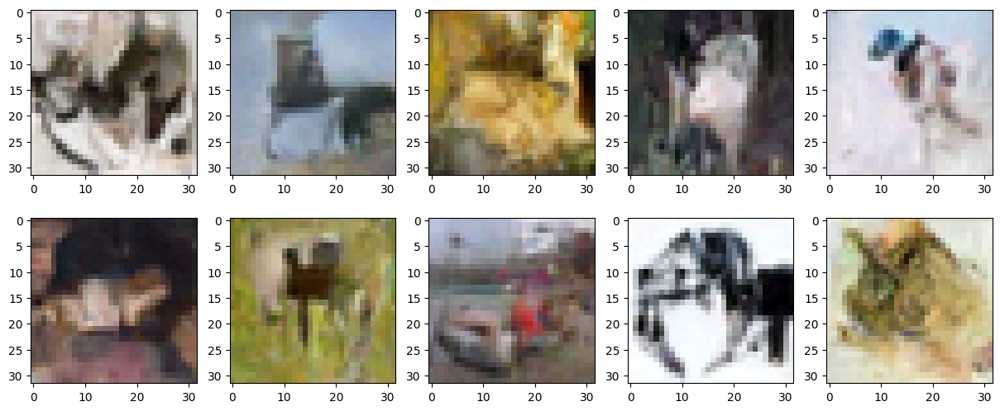

Epoch: 82


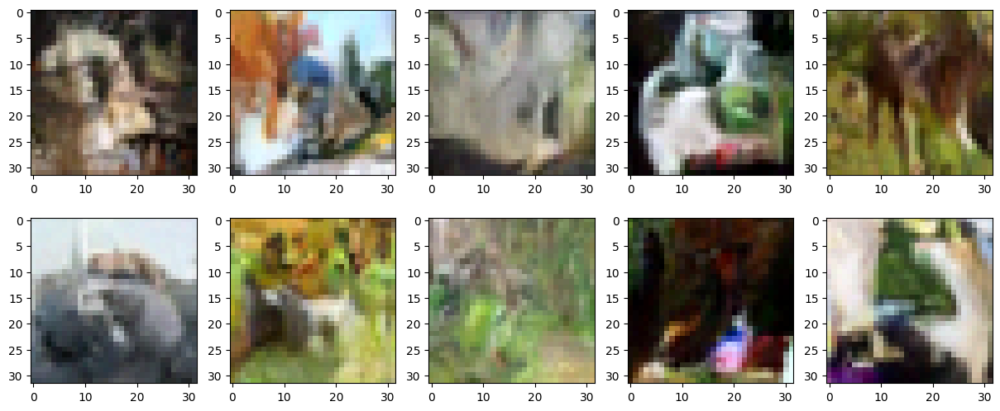

loss for epoch 82: 0.0313: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


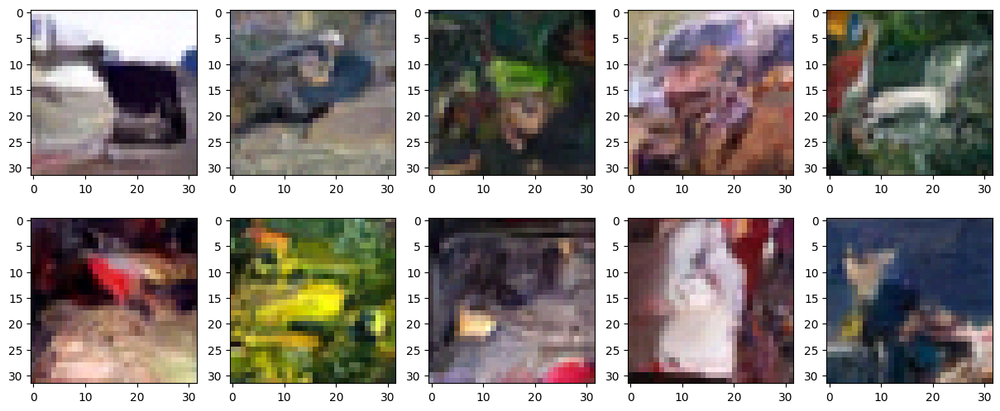

Epoch: 83


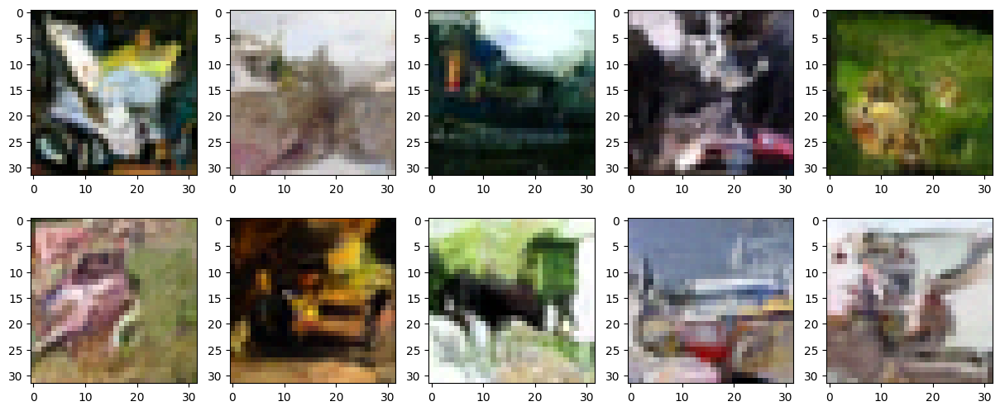

loss for epoch 83: 0.0315: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


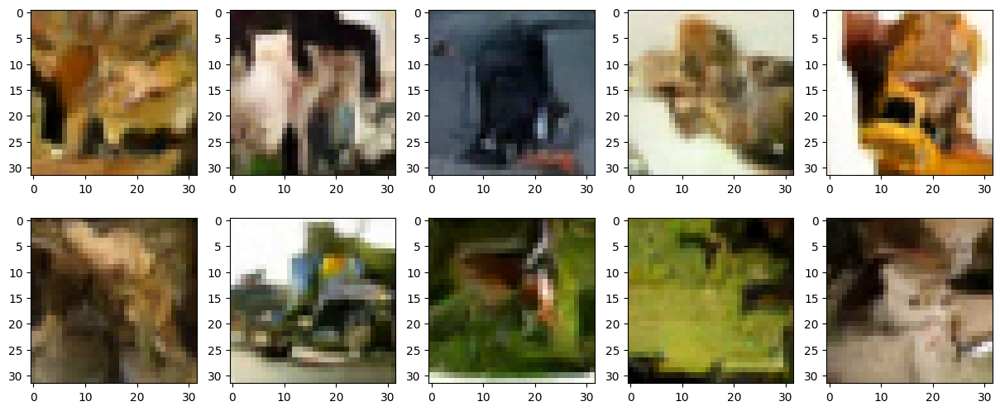

Epoch: 84


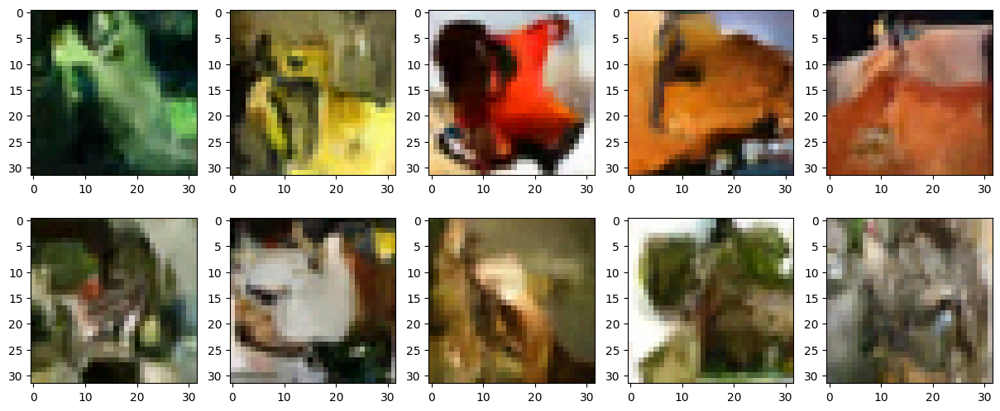

loss for epoch 84: 0.0310: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


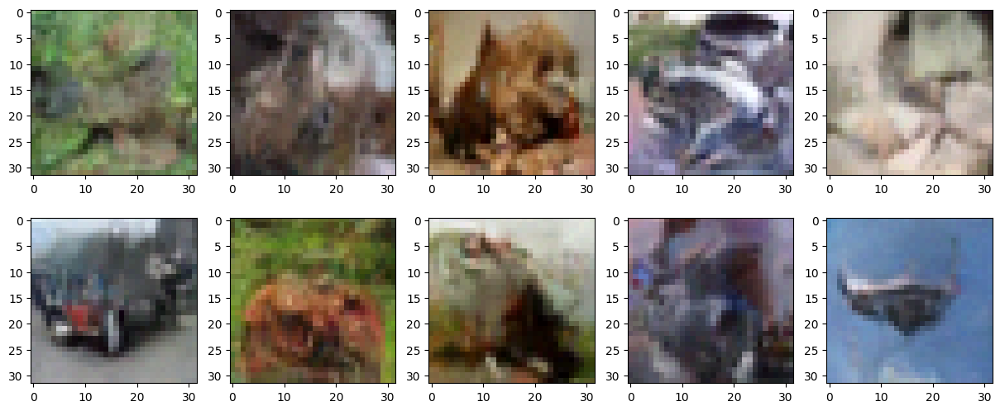

Epoch: 85


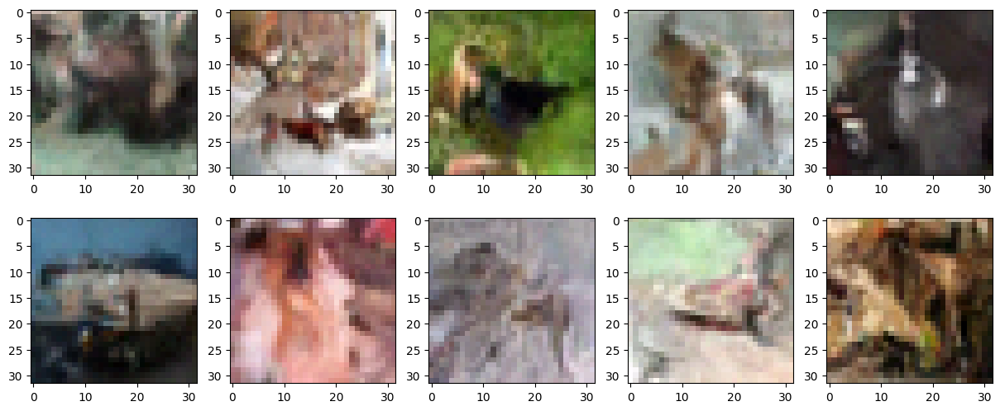

loss for epoch 85: 0.0311: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


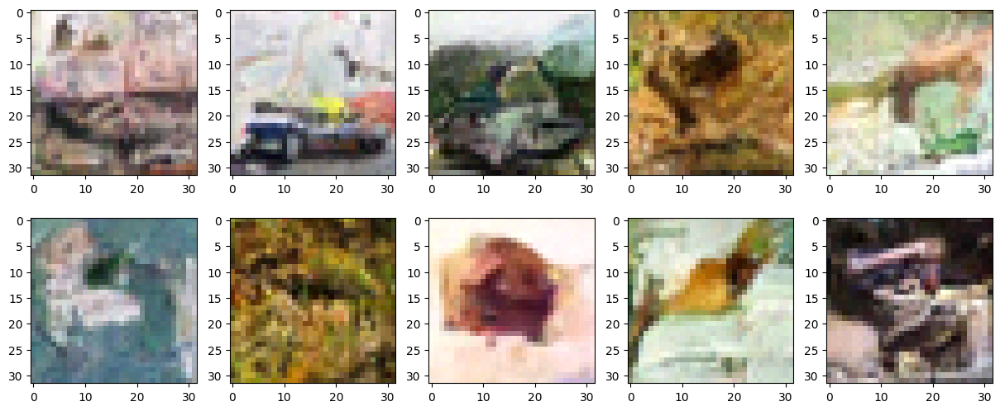

Epoch: 86


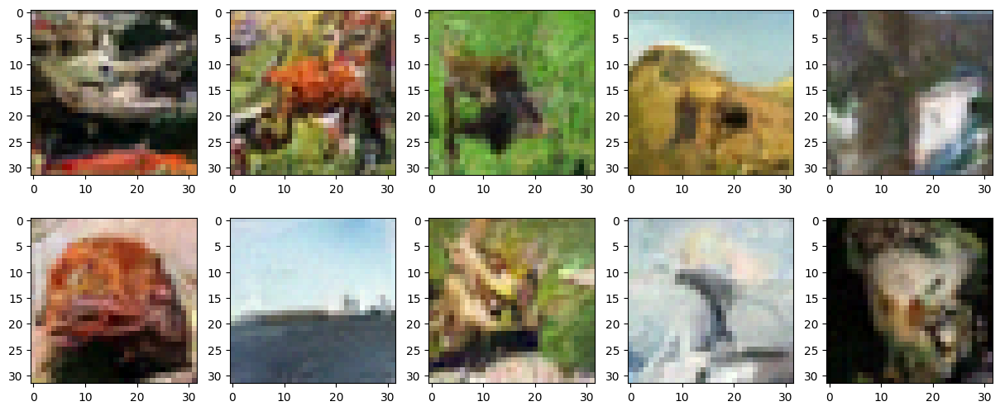

loss for epoch 86: 0.0311: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


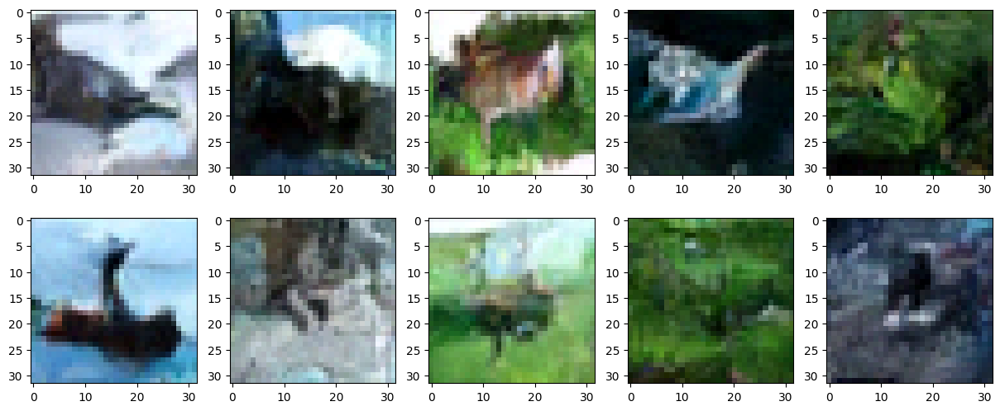

Epoch: 87


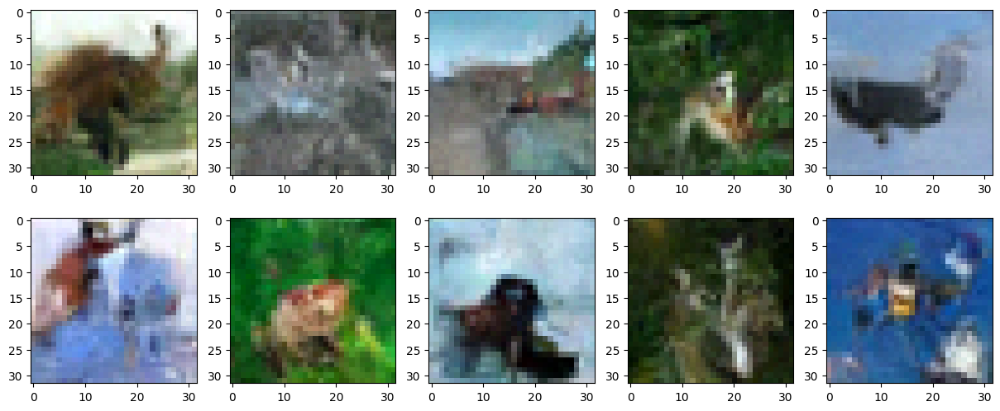

loss for epoch 87: 0.0311: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


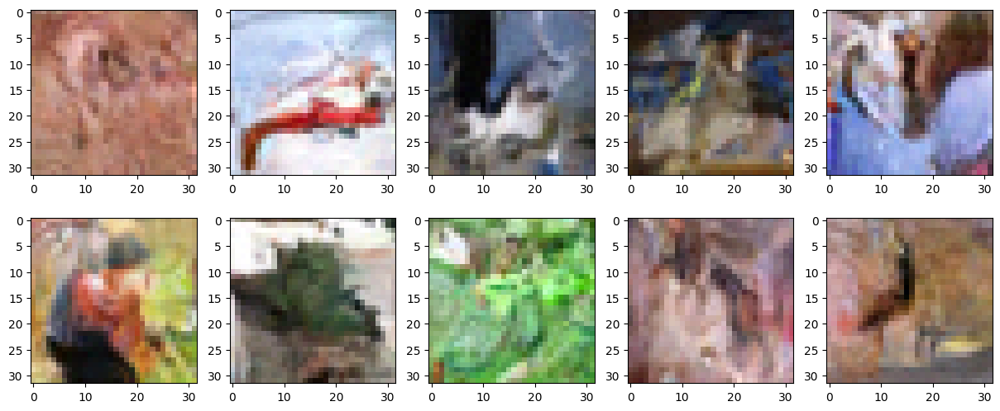

Epoch: 88


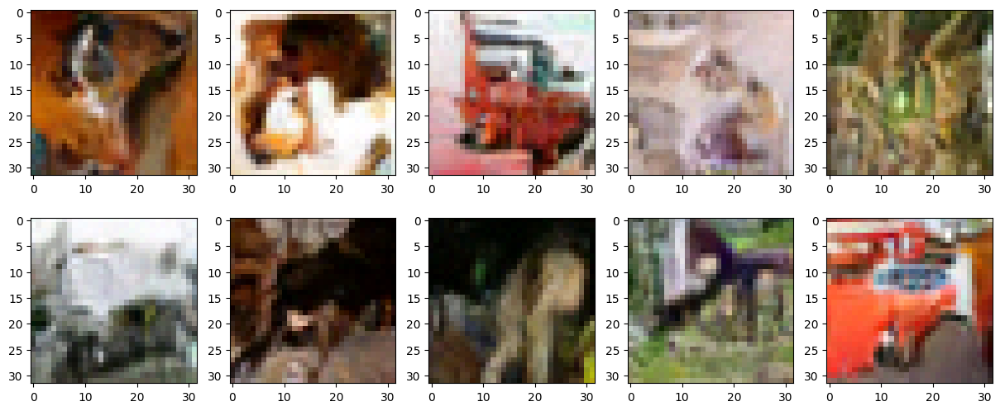

loss for epoch 88: 0.0310: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


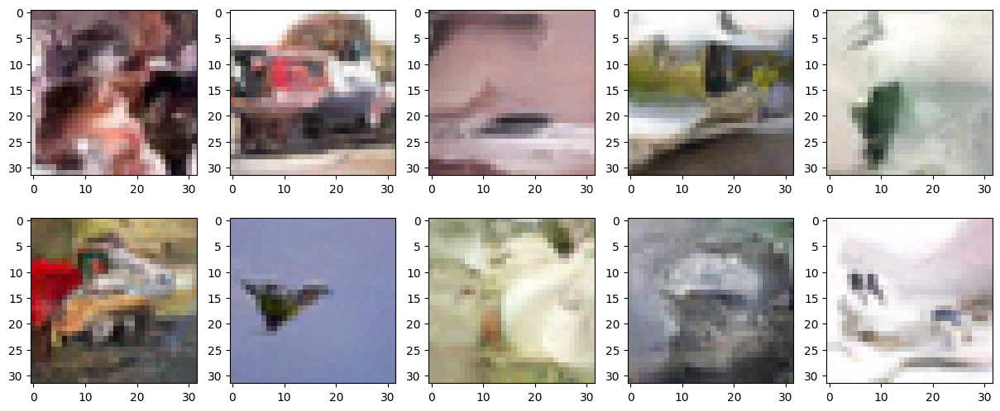

Epoch: 89


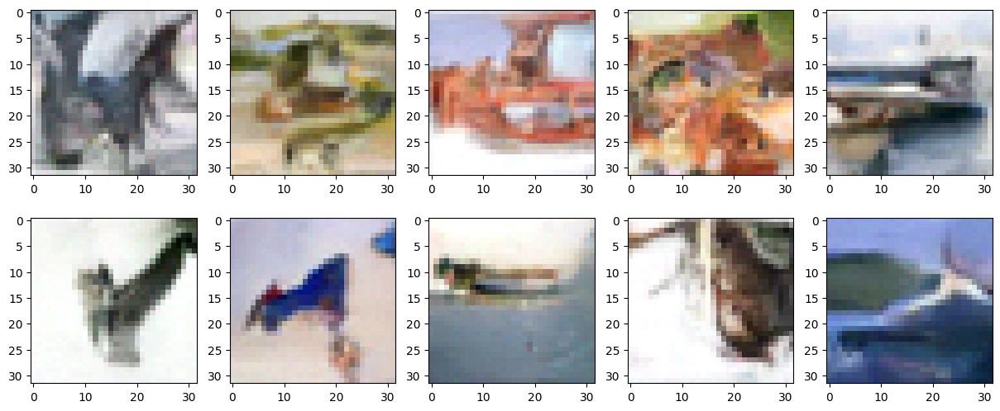

loss for epoch 89: 0.0308: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


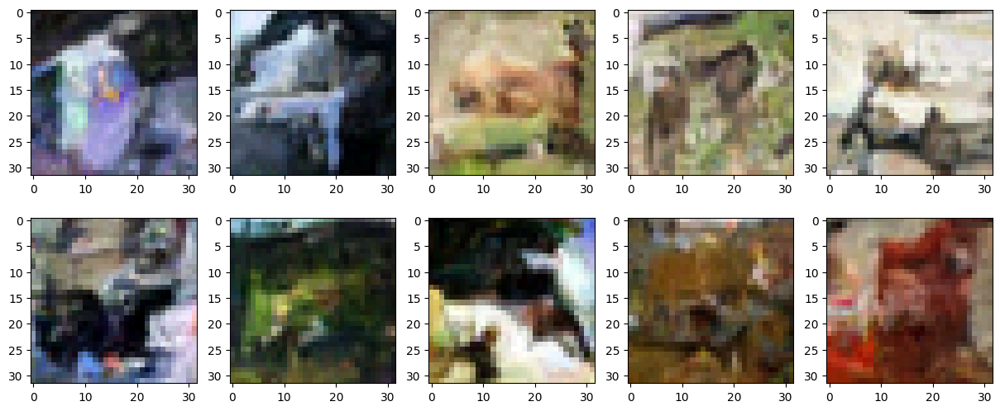

Epoch: 90


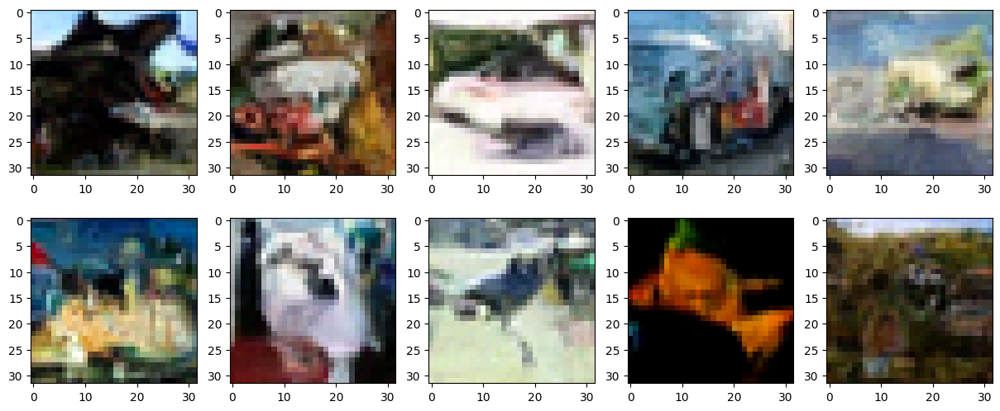

loss for epoch 90: 0.0307: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


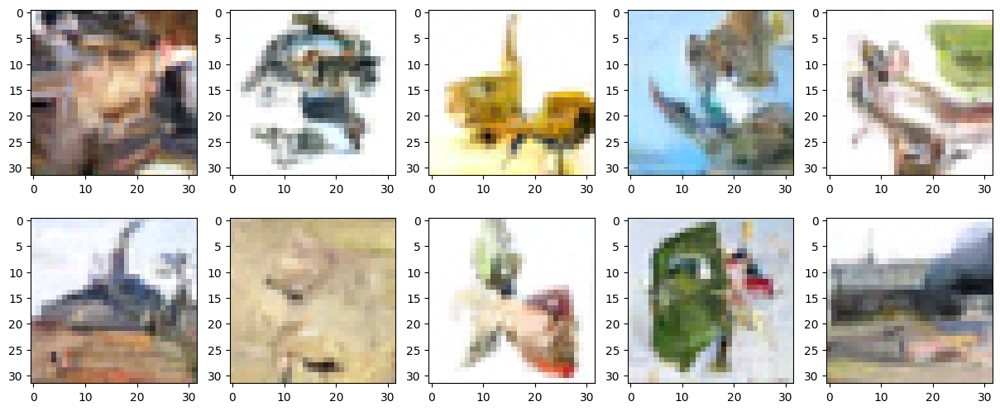

Epoch: 91


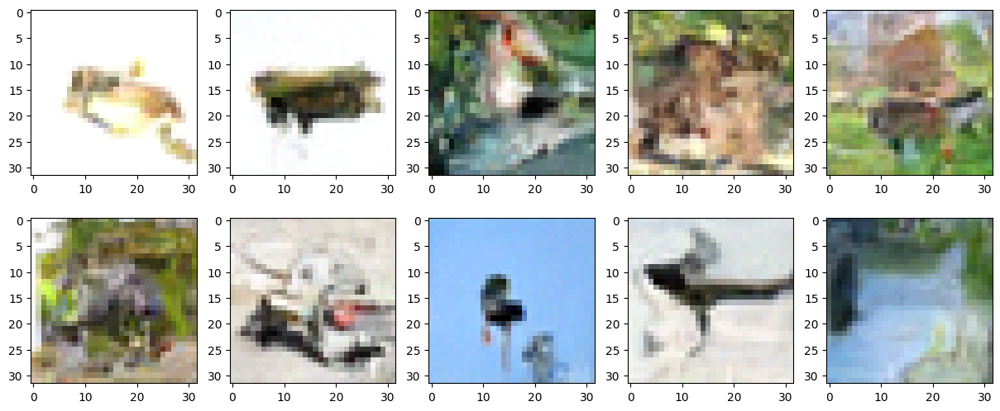

loss for epoch 91: 0.0312: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


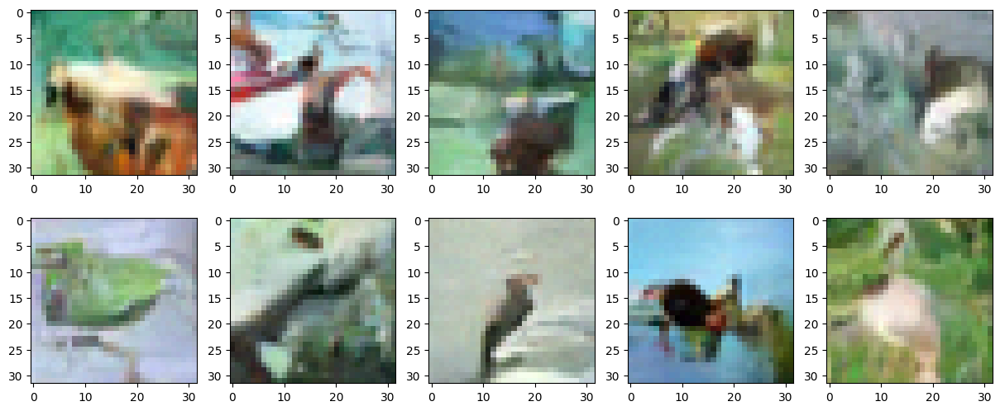

Epoch: 92


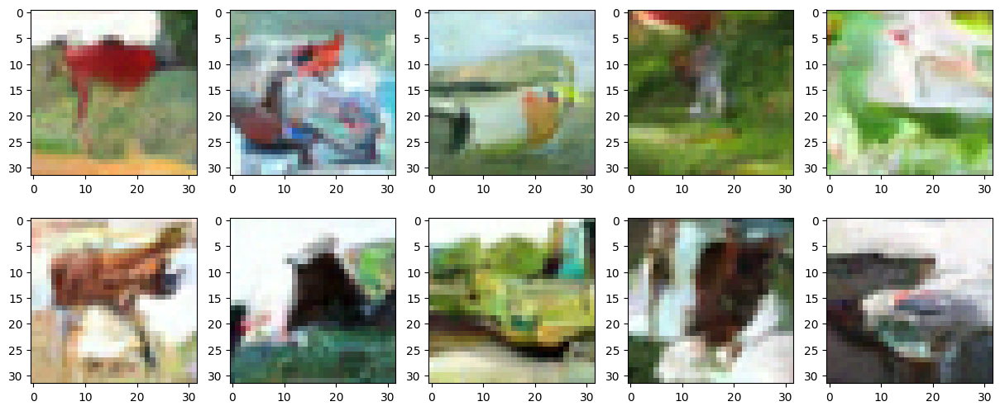

loss for epoch 92: 0.0308: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


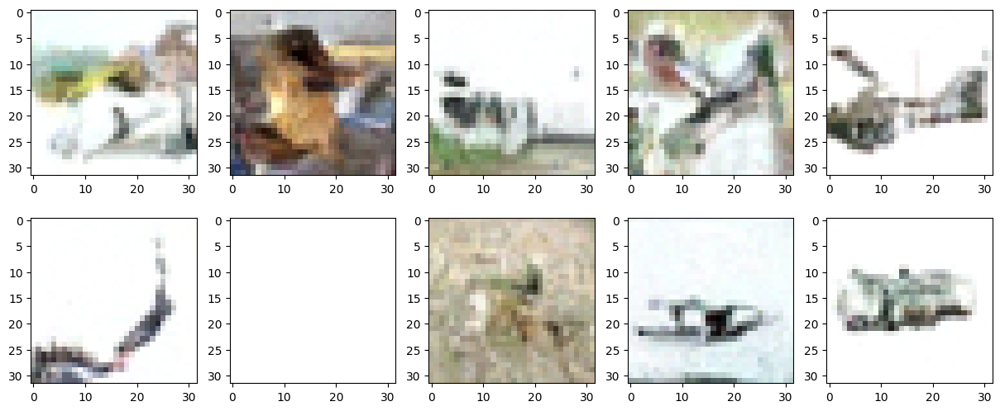

Epoch: 93


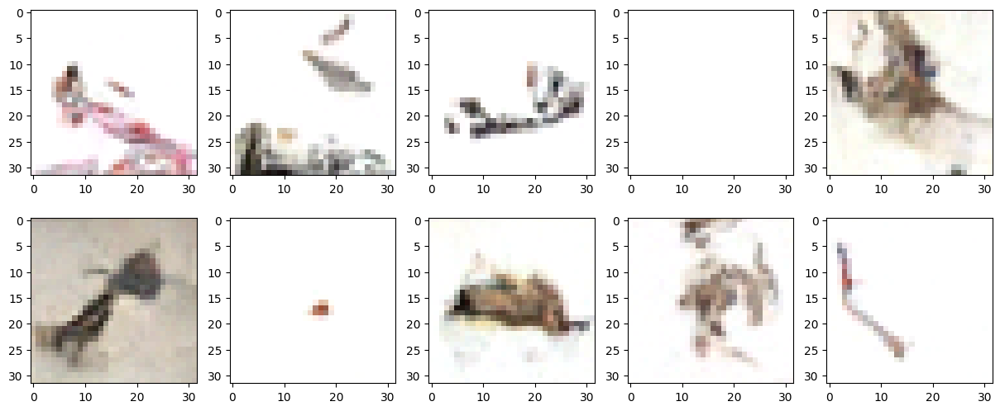

loss for epoch 93: 0.0308: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


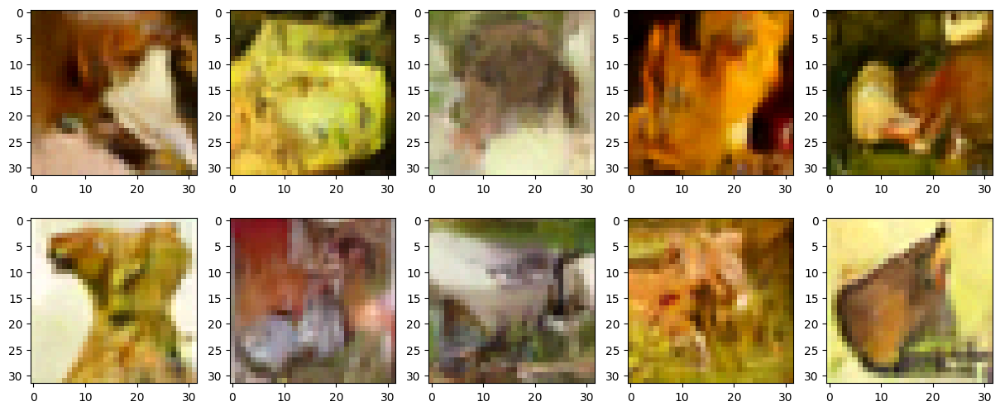

Epoch: 94


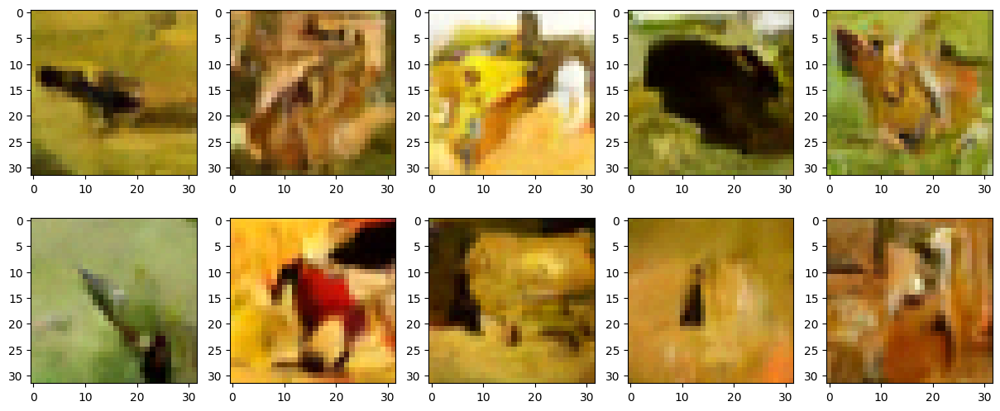

loss for epoch 94: 0.0305: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


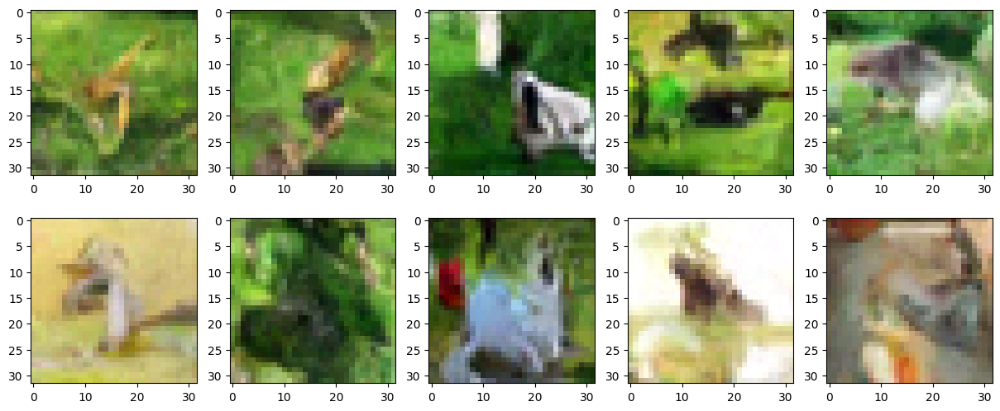

Epoch: 95


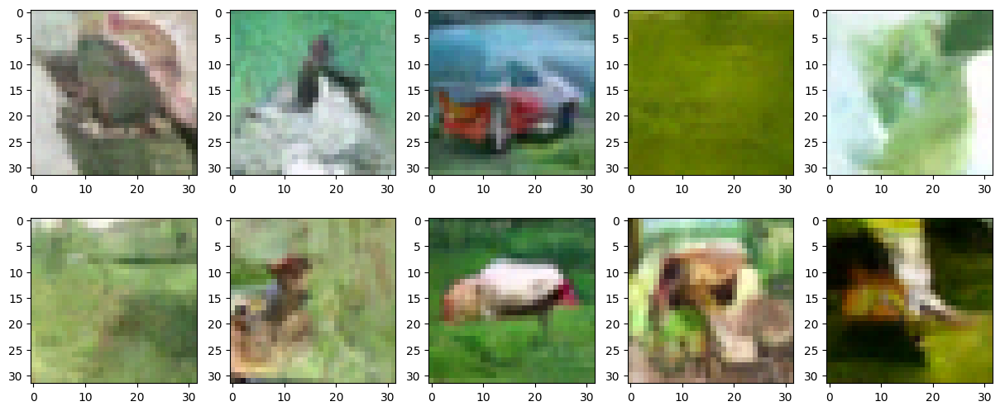

loss for epoch 95: 0.0305: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


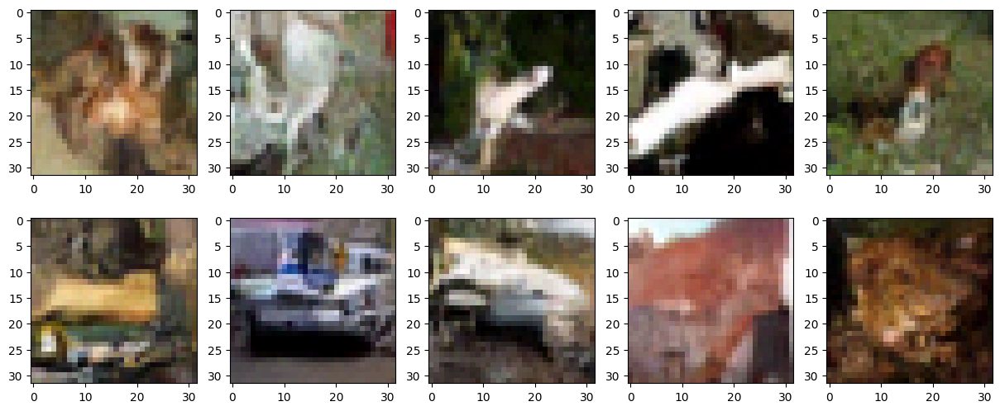

Epoch: 96


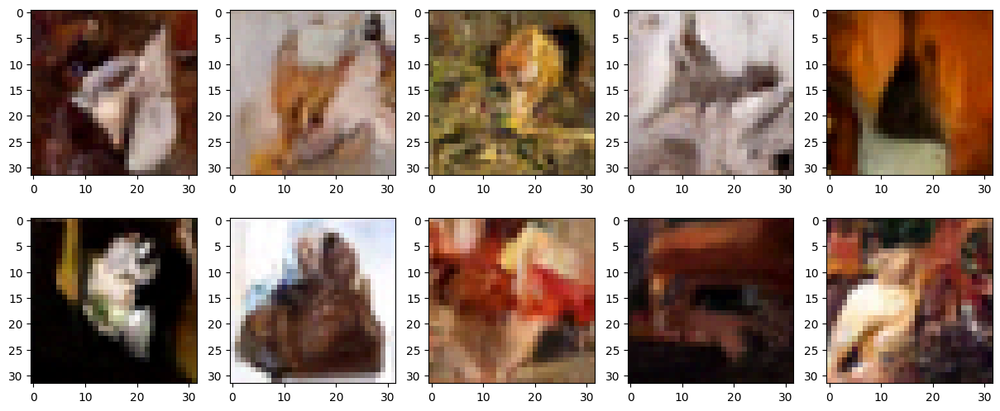

loss for epoch 96: 0.0306: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


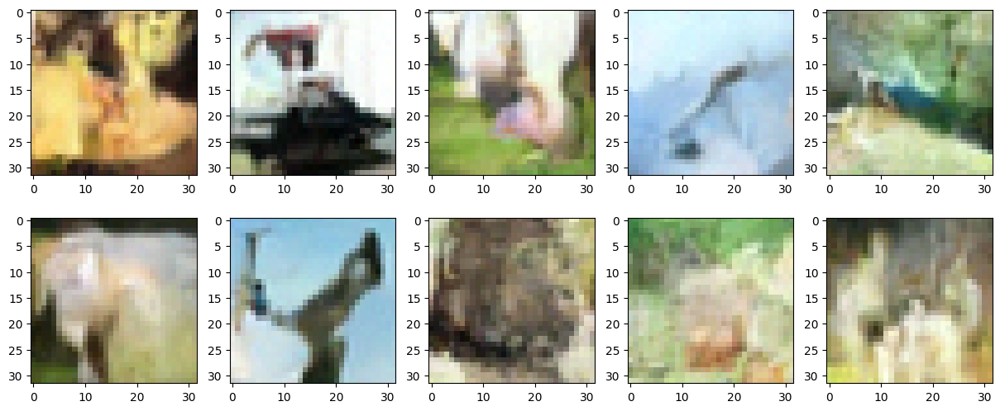

Epoch: 97


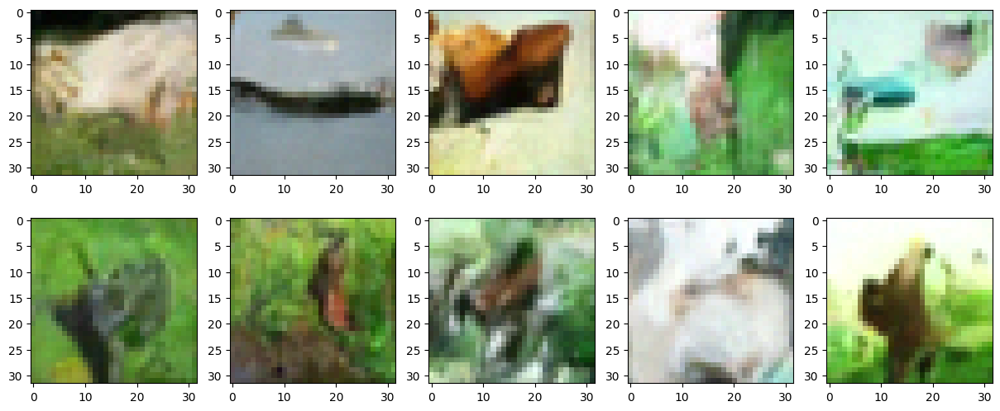

loss for epoch 97: 0.0307: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


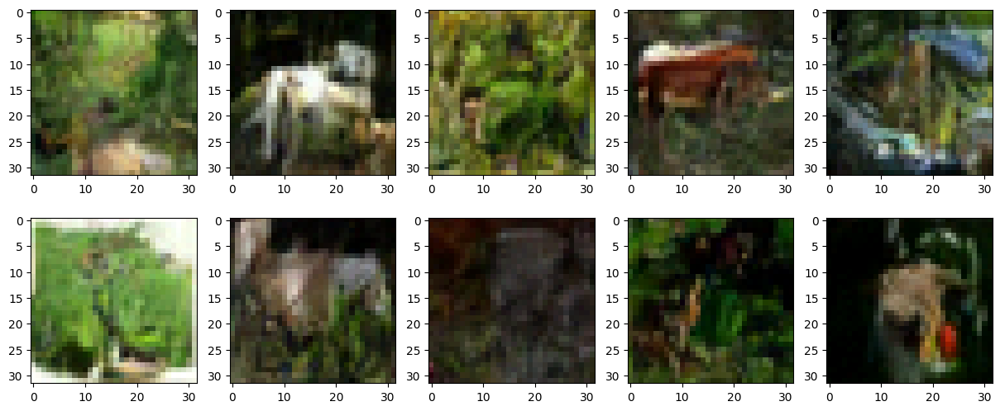

Epoch: 98


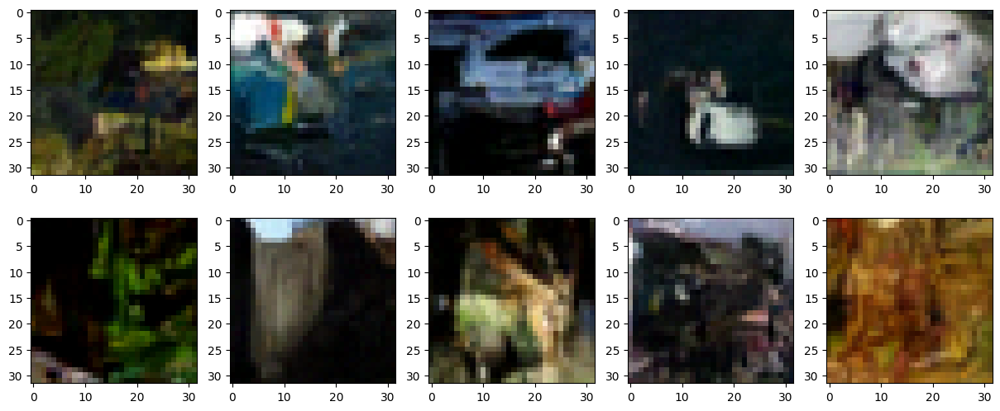

loss for epoch 98: 0.0308: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


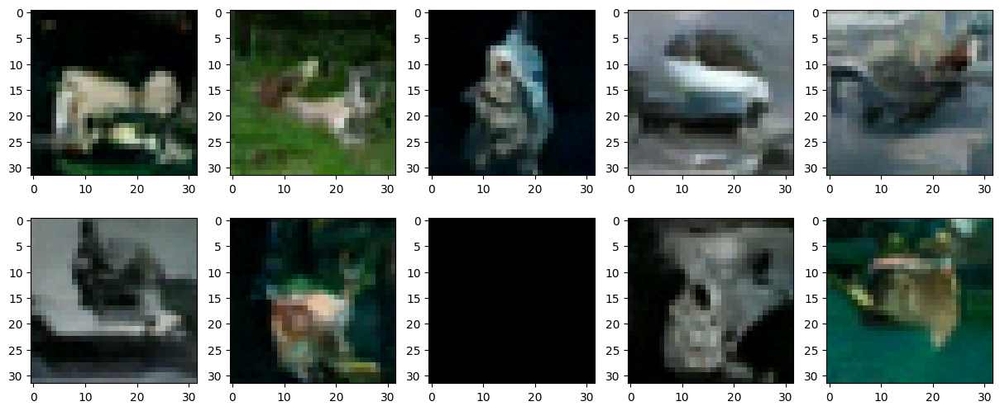

Epoch: 99


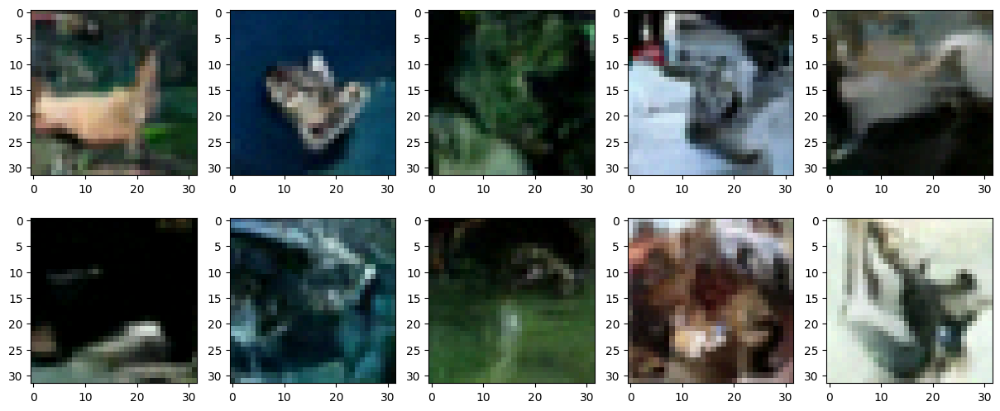

loss for epoch 99: 0.0304: 100%|██████████| 391/391 [04:29<00:00,  1.45it/s]


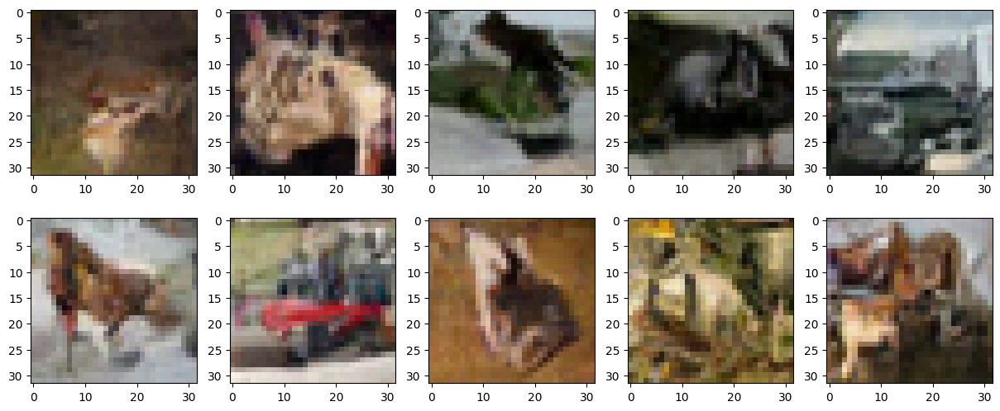

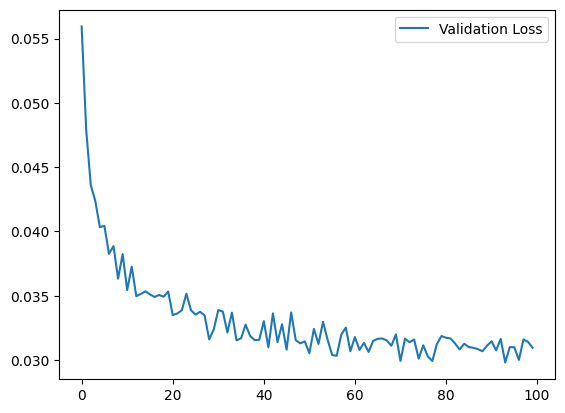

In [13]:
_, val_losses = train(
    model=ddpm,
    optimizer=torch.optim.Adam(params=ddpm.parameters(), lr=2e-4),
    epochs=EPOCHS,
    device=device,
    train_dataloader=data.train_loader,
    val_dataloader=data.val_loader
)

plt.plot(val_losses, label="Validation Loss")

plt.legend()

In [14]:
path = "model.pth"
torch.save(ddpm.state_dict(), path)

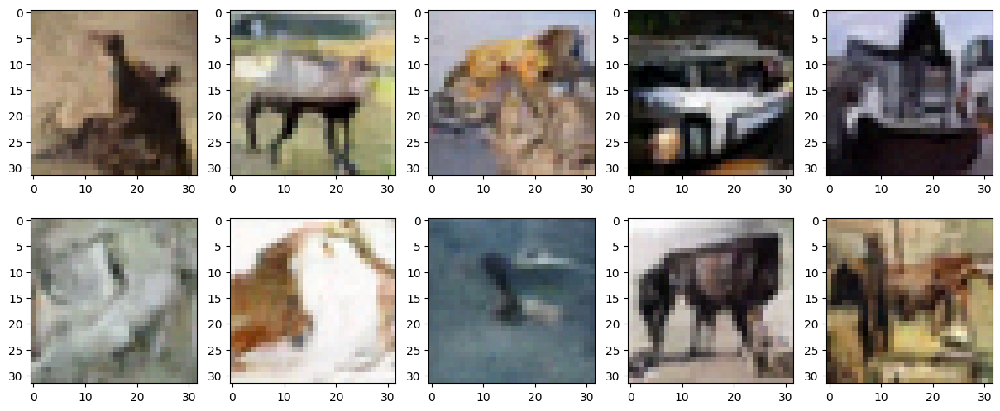

In [15]:
show_samples()